In [1]:
from IPython.display import HTML
from IPython.display import display, HTML
from PIL import Image
from dask.distributed import Client
from dask.distributed import as_completed
from datetime import datetime
from dateutil.relativedelta import relativedelta
from matplotlib.dates import DateFormatter
from pandas.io.formats.style import Styler
from pivottablejs import pivot_ui
from pmdarima.arima import auto_arima
from scipy import stats
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import TimeSeriesSplit
import datetime as dt
import matplotlib
import matplotlib as mp
import matplotlib as mpl
import matplotlib.dates as md
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import pandas_market_calendars as mcal
import pickle
import rpy2
import seaborn as sns
import sqlite3
import statsmodels.api as sm
import warnings
pd.options.display.max_columns = 50
pd.options.display.max_rows = 200

In [2]:
dict_sectors = {'Basic Materials':'VAW', 'Communication Services':'VOX', 'Consumer Cyclical':'VCR',
       'Consumer Defensive':'VDC', 'Energy':'VDE', 'Financial Services':'VFH', 'Healthcare':'VHT',
       'Industrials':'VIS', 'Real Estate':'VNQ', 'Technology':'VGT', 'Utilities':'VPU', 'error':'error'}

dict_indexes = {'SPTM':'SP1500', 'SPY':'SP500', 'SLY':'SP600', 'MDYG':'SP400','error':'error'}

dict_sectors_reverse = {'VAW':'Basic Materials',
 'VOX':'Communication Services',
 'VCR':'Consumer Cyclical',
 'VDC':'Consumer Defensive',
 'VDE':'Energy',
 'VFH':'Financial Services',
 'VHT':'Healthcare',
 'VIS':'Industrials',
 'VNQ':'Real Estate',
 'VGT':'Technology',
 'VPU':'Utilities',
 'error': 'error'}

In [3]:
def evaluate_ets(npa_):
    train,test,model_func,flag_ = npa_
    
    try:
        if(len(flag)==2):
            if(flag[1] is None):
                model = model_func(np.log(train['Adj Close']),initialization_method='heuristic',seasonal=flag[0],trend=flag[1],dates=train.index).fit()
            else:
                model = model_func(np.log(train['Adj Close']),initialization_method='heuristic',seasonal=flag[0],seasonal_periods=52,trend=flag[1],dates=train.index).fit()
        else:
            model = model_func(np.log(train['Adj Close']),initialization_method='heuristic',seasonal=flag[0],seasonal_periods=52,trend=flag[1],damped_trend=flag[2],dates=train.index).fit()

        fc_ets_ = np.exp(model.get_prediction(start=test.index[0],end=test.index[-1]).summary_frame())
        rmse_ = mean_squared_error(test, fc_ets_['mean'], squared=True)
    except:
        #not enough data points
        rmse_ = np.nan
    
    return([flag,rmse_])

In [4]:
def time_to_int(dateobj):
    total = int(dateobj.strftime('%S'))
    total += int(dateobj.strftime('%M')) * 60
    total += int(dateobj.strftime('%H')) * 60 * 60
    total += (int(dateobj.strftime('%j')) - 1) * 60 * 60 * 24
    total += (int(dateobj.strftime('%Y')) - 1970) * 60 * 60 * 24 * 365
    return total

def myfunc(x):
    return slope * x + intercept

In [5]:
def highlight_cells(val, color_if_true, color_if_false, threshold_):
    color = color_if_true if val >= threshold_ else color_if_false
    return 'background-color: {}'.format(color)

In [6]:
db_filename = 'todo.db'

db_is_new = not os.path.exists(db_filename)

conn = sqlite3.connect(db_filename)

if db_is_new:
    print('Need to create schema')
else:
    print('Database exists, assume schema does, too.')

conn.close()

Database exists, assume schema does, too.


In [7]:
si = ['03-31','06-30','09-30','12-31']
               
[start,end, prices_df, sp1500_index_df, sp500, sp600, sp400, market_data, completed_fred_pvt, completed_bonds, completed_bonds_pvt, sectors, indexes, screener_sorted] = pickle.load(open('./data_object.pkl', 'rb'))

prices = prices_df
#prices = pd.read_excel('SP1500_screener_multiple.xlsx',sheet_name="SP1500_Sectors_Indexes_Prices")

In [8]:
def colored(r, g, b, text):
    return f"\033[38;2;{r};{g};{b}m{text}\033[0m"

In [9]:
def display_side_by_side(dfs:list, captions:list, tablespacing=5):
    """Display tables side by side to save vertical space
    Input:
        dfs: list of pandas.DataFrame
        captions: list of table captions
    """
    output = ""
    for (caption, df) in zip(captions, dfs):
        output += df.style.set_table_attributes("style='display:inline'").set_caption(caption)._repr_html_()
        output += tablespacing * "\xa0"
    display(HTML(output))

In [10]:
cm = sns.color_palette("blend:red,yellow,green", as_cmap=True)

def b_g(s, cmap=cm, low=0, high=0):
    # Pass the columns from Dataframe A 
    a = A.loc[:,s.name].copy()
    #rng = a.max() - a.min()
    rng = np.nanmax(A.values.ravel()) - np.nanmin(A.values.ravel())
    norm = mp.colors.Normalize(np.nanmin(A.values.ravel()) - (rng * low),
                        np.nanmax(A.values.ravel()) + (rng * high))
    normed = norm(a.values)
    #c = [mp.colors.rgb2hex(x) for x in plt.cm.get_cmap(cmap)(normed)]
    c = [mp.colors.rgb2hex(x) for x in plt.cm.get_cmap(cm)(normed)]
    return ['background-color: %s' % color for color in c]

In [11]:
nyse = mcal.get_calendar('NYSE')
nyse_dates = nyse.schedule(start_date=start, end_date=end)

In [12]:
stock_fundamentals = market_data
screener = screener_sorted
fundamentals = stock_fundamentals
stock_indexes = sp1500_index_df

spdr_indexes = indexes
spdr_indexes.columns=['Symbol']
vanguard_sectors = sectors
vanguard_sectors.columns=['Symbol']

In [13]:
sector_performance_return = pd.DataFrame()
sector_performance_Q_smoothed_return = pd.DataFrame()

for v in [*spdr_indexes['Symbol'],*vanguard_sectors['Symbol']]:
    subset = prices[prices['Symbol'] == v]
    #subset_ = subset.set_index('Date').asfreq('Q')[['Adj Close']].pct_change()
    subset_ = subset.asfreq('D').interpolate().asfreq('Q')[['Adj Close']].pct_change()
    #print(subset_)
    #subset_qs = subset.set_index('Date')[['Adj Close']].pct_change().rolling(63).mean()
    subset_qs = subset[['Adj Close']].pct_change().rolling(63).mean()
    subset_.index = subset_.index.values.astype('M8[D]')
    subset_qs.index = subset_qs.index.values.astype('M8[D]')
    dt_str = subset_.index[-1].strftime('%Y-%m-%d')
    #tail = subset[subset.set_index('Date').index>=dt_str]
    tail = subset[subset.index>=dt_str]
    #dt_str = subset.set_index('Date').index[-1].strftime('%Y-%m-%d')
    dt_str = subset.index[-1].strftime('%Y-%m-%d')
    #tail_ = pd.DataFrame([(tail.set_index('Date')['Adj Close'][-1]-tail.set_index('Date')['Adj Close'][0])/tail.set_index('Date')['Adj Close'][0]],index=[datetime.strptime(dt_str, '%Y-%m-%d')],columns=['Adj Close'])
    tail_ = pd.DataFrame([(tail['Adj Close'][-1]-tail['Adj Close'][0])/tail['Adj Close'][0]],index=[datetime.strptime(dt_str, '%Y-%m-%d')],columns=['Adj Close'])
    subset__ = pd.concat([subset_,tail_],axis=0)
    sector_performance_return = pd.concat([sector_performance_return,subset__],axis=1)
    sector_performance_Q_smoothed_return = pd.concat([sector_performance_Q_smoothed_return,subset_qs],axis=1)

In [14]:
sector_performance_Q_smoothed_return.columns = [*[i for i in spdr_indexes.index],*[v for v in vanguard_sectors.index]]
sector_performance_return.columns = [*[i for i in spdr_indexes.index],*[v for v in vanguard_sectors.index]]

Seasonal Indexes


,03-31,06-30,09-30,12-31
0,Energy ETF,Information Technology ETF,Information Technology ETF,Information Technology ETF
1,Information Technology ETF,Consumer Discretionary ETF,Consumer Discretionary ETF,Financials ETF
2,Utilities ETF,Energy ETF,SP500,Materials ETF
3,SP1500,Materials ETF,Industrials ETF,SP600
4,Industrials ETF,SP1500,SP1500,Consumer Discretionary ETF
5,SP500,SP500,Health Care ETF,SP400
6,SP600,SP600,Utilities ETF,SP500
7,Health Care ETF,SP400,Consumer Staples ETF,SP1500
8,Consumer Staples ETF,Health Care ETF,Financials ETF,Health Care ETF
9,SP400,Communication Services ETF,Materials ETF,Consumer Staples ETF


,03-31,06-30,09-30,12-31
SP1500,-0.010622,0.081757,0.041626,0.049958
SP500,-0.011990,0.080771,0.045646,0.050086
SP600,-0.017768,0.080509,0.019158,0.057970
SP400,-0.019859,0.080174,0.020554,0.051549
Communication Services ETF,-0.032872,0.075995,0.022591,0.017899
Consumer Discretionary ETF,-0.021214,0.120254,0.052510,0.052777
Consumer Staples ETF,-0.018663,0.035480,0.034807,0.045915
Energy ETF,0.055913,0.096281,-0.039735,0.042416
Financials ETF,-0.020711,0.061049,0.030176,0.065446
Health Care ETF,-0.017923,0.078706,0.041045,0.047467


Note if the final data in the prices ends on a quarter, this will aggregate into the seasonal_index above and there will be no comparison
Current


,06-17
Energy ETF,-0.043815
Consumer Staples ETF,-0.096218
Utilities ETF,-0.125888
Health Care ETF,-0.134327
Materials ETF,-0.161041
SP600,-0.165794
Industrials ETF,-0.178228
SP1500,-0.184779
Financials ETF,-0.187815
SP500,-0.189930


standard deviations


,03-31,06-30,09-30,12-31
SP1500,0.134644,0.072380,0.037999,0.110320
SP500,0.127411,0.070450,0.039033,0.106496
SP600,0.199479,0.088447,0.037096,0.179394
SP400,0.157662,0.100224,0.037075,0.138781
Communication Services ETF,0.138244,0.095192,0.045269,0.123434
Consumer Discretionary ETF,0.151791,0.146922,0.083611,0.127243
Consumer Staples ETF,0.096633,0.035421,0.049261,0.063730
Energy ETF,0.369457,0.166709,0.099129,0.202483
Financials ETF,0.192299,0.053666,0.014462,0.140299
Health Care ETF,0.079810,0.054107,0.065798,0.098650


t scores


,03-31,06-30,09-30,12-31
SP1500,-0.035281,0.505153,0.489908,0.202519
SP500,-0.042087,0.512730,0.522980,0.210329
SP600,-0.039834,0.407076,0.230960,0.144515
SP400,-0.056330,0.357747,0.247928,0.166115
Communication Services ETF,-0.106341,0.357027,0.223180,0.064848
Consumer Discretionary ETF,-0.062503,0.366041,0.280865,0.185493
Consumer Staples ETF,-0.086371,0.447954,0.315992,0.322196
Energy ETF,0.067680,0.258283,-0.179260,0.093682
Financials ETF,-0.048166,0.508740,0.933164,0.208614
Health Care ETF,-0.100433,0.650529,0.278976,0.215182


p values


,03-31,06-30,09-30,12-31
SP1500,0.487036,0.675887,0.671106,0.573766
SP500,0.484537,0.678247,0.681422,0.576557
SP600,0.485364,0.644372,0.583899,0.552872
SP400,0.479310,0.627889,0.589904,0.560685
Communication Services ETF,0.461012,0.627646,0.581136,0.523813
Consumer Discretionary ETF,0.477047,0.630688,0.601465,0.567662
Consumer Staples ETF,0.468307,0.657720,0.613641,0.615774
Energy ETF,0.524851,0.593553,0.434579,0.534366
Financials ETF,0.482306,0.677006,0.790214,0.575945
Health Care ETF,0.463168,0.719135,0.600805,0.578288


array([[<AxesSubplot:title={'center':'03-31'}>,
        <AxesSubplot:title={'center':'06-30'}>],
       [<AxesSubplot:title={'center':'09-30'}>,
        <AxesSubplot:title={'center':'12-31'}>]], dtype=object)

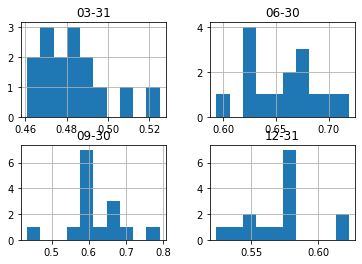

In [15]:
from scipy import stats as st
from scipy.stats import t

std_indexes = pd.DataFrame()
seasonal_indexes = pd.DataFrame()

warnings.filterwarnings('ignore')
for spr in sector_performance_return.columns:
    #print(spr)
    s = sector_performance_return[[spr]]
    #print(s)
    years = []
    quarters = []
    for d in sector_performance_return[spr].index:

        d_ = d.strftime('%Y-%m-%d')
        #print(d_)

        datem = dt.datetime.strptime(d_, "%Y-%m-%d")
        years.append(str(datem.year))
        #print(datem.year)       # 2021
        m = datem.month
        d = datem.day
        if(len(str(m))==1):
            m = '0'+str(m)
        else:
            m = str(m)
        if(len(str(d))==1):
            d = '0'+str(d)
        else:
            d = str(d)
        quarters.append(m+"-"+d)

    s['Years'] = years
    s['Quarters'] = quarters
    ct = pd.crosstab(s['Years'], s['Quarters'],values=s[spr],aggfunc=np.mean).mean(axis=0).sort_index()
    ct.columns = [spr]
    
    ct_std = pd.crosstab(s['Years'], s['Quarters'],values=s[spr],aggfunc=np.mean).std(axis=0).sort_index()
    ct_std.columns = [spr]
    
    std_indexes = pd.concat([std_indexes,ct_std],axis=1)
    seasonal_indexes = pd.concat([seasonal_indexes,ct],axis=1)

seasonal_indexes.columns = sector_performance_return.columns

std_indexes.columns = sector_performance_return.columns
    
seasonal_indexes = seasonal_indexes.T

std_indexes = std_indexes.T

si = ['03-31','06-30','09-30','12-31']

print("Seasonal Indexes")

seasonal_index_values_sorted = []
seasonal_index_names_sorted = []
#B = seasonal_indexes[si]
for c in seasonal_indexes[si].columns:
    seasonal_index_values_sorted.append(seasonal_indexes[si][c].sort_values(ascending=False).values)
    seasonal_index_names_sorted.append(seasonal_indexes[si][c].sort_values(ascending=False).index.values)

temp_seasonal_index_values_sorted = pd.DataFrame(seasonal_index_values_sorted).T
temp_seasonal_index_values_sorted.columns = seasonal_indexes[si].columns

temp_seasonal_index_names_sorted = pd.DataFrame(seasonal_index_names_sorted).T
temp_seasonal_index_names_sorted.columns = seasonal_indexes[si].columns

A = temp_seasonal_index_values_sorted
B = temp_seasonal_index_names_sorted 

display(B.style.apply(b_g,cmap=cm))

display(seasonal_indexes[si].style.background_gradient(cmap = cm,axis=0))

print("Note if the final data in the prices ends on a quarter, this will aggregate into the seasonal_index above and there will be no comparison")
print("Current")

display(seasonal_indexes[seasonal_indexes.columns.difference(si)].sort_values(by=seasonal_indexes[seasonal_indexes.columns.difference(si)].columns[0],ascending=False).style.background_gradient(cmap = cm,axis=0))    

#calculate p-value
n=5

print("standard deviations")
display(std_indexes[si])
t_scores = (seasonal_indexes[si])/(std_indexes[si]*np.sqrt(n))
print("t scores")
display(t_scores)
print("p values")
p_values = pd.DataFrame(t.cdf(t_scores, df=n-2),index=seasonal_indexes[si].index,columns=seasonal_indexes[si].columns)

display(p_values.style.applymap(highlight_cells, color_if_true='green', color_if_false='yellow', threshold_=.5))

p_values.hist()

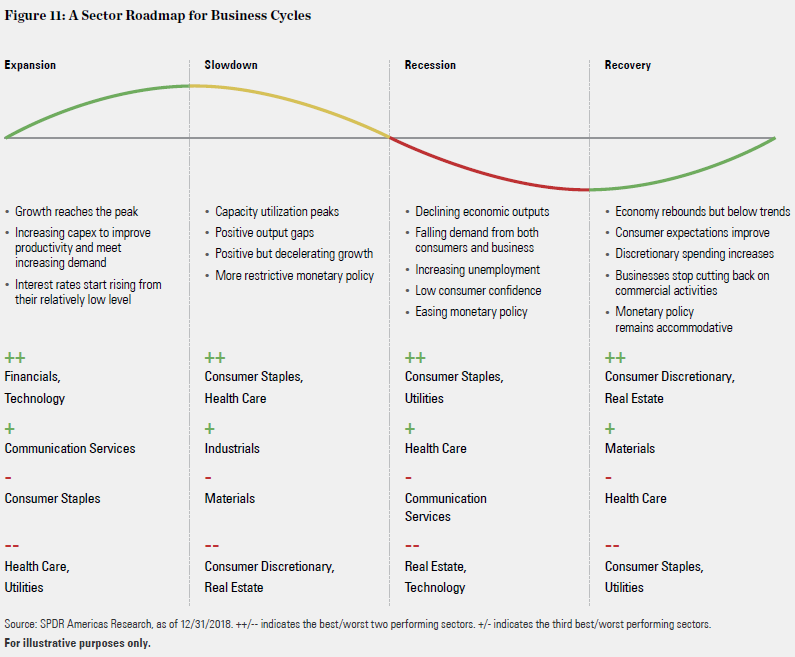

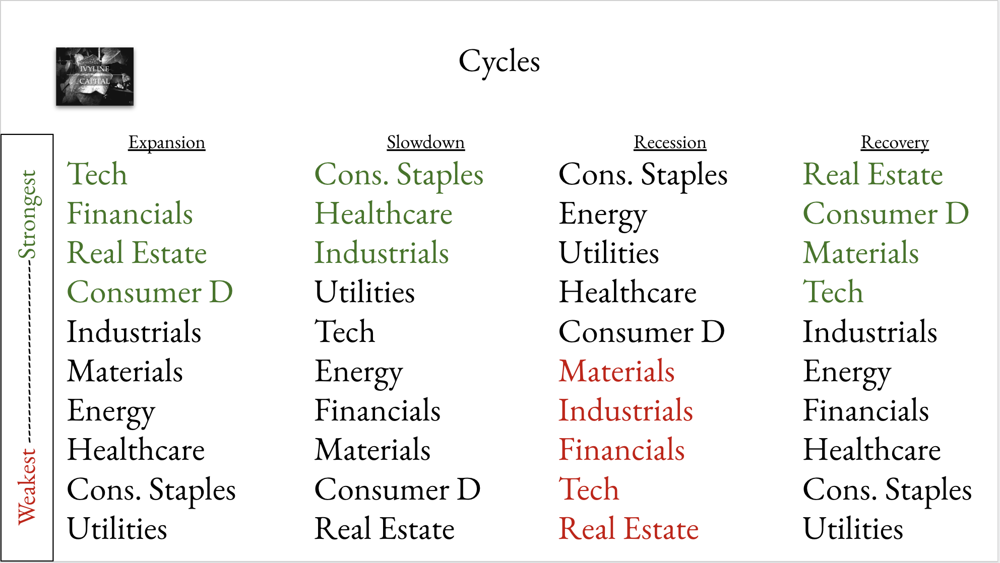

In [16]:
cycles_ = ['Expansion','Slowdown','Recession','Recovery']

path=r"C:\Users\User\Documents\wiki\wiki\dev\python\Python-Stock\reports\figures\Business cycles.png"
display(Image.open(path))
path=r"C:\Users\User\Documents\wiki\wiki\Finance\Business Cycles-2.png"
display(Image.open(path))

In [17]:
sector_performance_return_pvt = sector_performance_return[sector_performance_return.iloc[-1].sort_values(ascending=False).index]

sector_performance_return_pvt_heatmap = sector_performance_return_pvt.style.background_gradient(cmap = cm,axis=None)
display(sector_performance_return_pvt_heatmap)

sector_performances = pd.DataFrame()
sector_performances_values = pd.DataFrame()
for c in sector_performance_return.T.columns:
    #print(c)
    temp = pd.DataFrame(sector_performance_return.T[c].sort_values(ascending=False).index,columns=[c])
    #print(temp)
    temp2 = pd.DataFrame(sector_performance_return.T[c].sort_values(ascending=False),columns=[c])
    #print(temp2)
    temp2.reset_index(drop=True,inplace=True)    
    sector_performances = pd.concat([sector_performances,temp],axis=1)
    sector_performances_values = pd.concat([sector_performances_values,temp2],axis=1)
    
A = sector_performances_values
B = sector_performances

df = B.style.apply(b_g,cmap='RdYlGn')

display(df)


,Energy ETF,Consumer Staples ETF,Utilities ETF,Health Care ETF,Materials ETF,SP600,Industrials ETF,SP1500,Financials ETF,SP500,Real Estate ETF,SP400,Communication Services ETF,Information Technology ETF,Consumer Discretionary ETF
2017-03-31 00:00:00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2017-06-30 00:00:00,-0.078709,0.010040,0.022113,0.072895,0.026999,0.018327,0.042167,0.030375,0.038955,0.030708,0.017375,0.031752,-0.024136,0.041388,0.028386
2017-09-30 00:00:00,0.069612,-0.012346,0.031518,0.040565,0.066617,0.064962,0.052781,0.044807,0.052789,0.045666,0.008095,0.035020,0.015498,0.083223,0.014521
2017-12-31 00:00:00,0.073946,0.059268,0.000687,0.018576,0.071798,0.038747,0.066175,0.066880,0.073683,0.069917,0.012742,0.074139,0.000763,0.093087,0.097848
2018-03-31 00:00:00,-0.078807,-0.073521,-0.033734,-0.020049,-0.072483,-0.011631,-0.033542,-0.021321,-0.015065,-0.024130,-0.086159,-0.003978,-0.085669,0.020711,-0.001942
2018-06-30 00:00:00,0.150528,0.006353,0.053422,0.055259,0.036210,0.106722,-0.008057,0.052094,-0.011331,0.047568,0.094633,0.045520,0.035862,0.080437,0.088528
2018-09-30 00:00:00,0.021911,0.050064,0.019751,0.137698,0.007338,0.032842,0.094874,0.070536,0.031675,0.078236,0.000044,0.032902,0.023115,0.117719,0.066008
2018-12-31 00:00:00,-0.267451,-0.055862,0.009925,-0.108129,-0.154310,-0.193040,-0.183620,-0.142834,-0.138848,-0.137319,-0.058855,-0.172165,-0.143117,-0.174415,-0.162070
2019-03-31 00:00:00,0.178564,0.111156,0.103055,0.081835,0.126958,0.124660,0.183161,0.151853,0.109942,0.144236,0.173365,0.157497,0.139541,0.217473,0.157197
2019-06-30 00:00:00,-0.048754,0.036556,0.035855,0.017469,0.040951,0.010843,0.034436,0.039106,0.067026,0.040369,0.015389,0.030815,0.035928,0.054745,0.040127


,2017-03-31 00:00:00,2017-06-30 00:00:00,2017-09-30 00:00:00,2017-12-31 00:00:00,2018-03-31 00:00:00,2018-06-30 00:00:00,2018-09-30 00:00:00,2018-12-31 00:00:00,2019-03-31 00:00:00,2019-06-30 00:00:00,2019-09-30 00:00:00,2019-12-31 00:00:00,2020-03-31 00:00:00,2020-06-30 00:00:00,2020-09-30 00:00:00,2020-12-31 00:00:00,2021-03-31 00:00:00,2021-06-30 00:00:00,2021-09-30 00:00:00,2021-12-31 00:00:00,2022-03-31 00:00:00,2022-06-17 00:00:00
0,SP1500,Health Care ETF,Information Technology ETF,Consumer Discretionary ETF,Information Technology ETF,Energy ETF,Health Care ETF,Utilities ETF,Information Technology ETF,Financials ETF,Utilities ETF,Health Care ETF,Information Technology ETF,Consumer Discretionary ETF,Consumer Discretionary ETF,SP600,Energy ETF,Energy ETF,Financials ETF,Information Technology ETF,Energy ETF,Energy ETF
1,SP500,Industrials ETF,Energy ETF,Information Technology ETF,Consumer Discretionary ETF,SP600,Information Technology ETF,Consumer Staples ETF,Industrials ETF,Information Technology ETF,Real Estate ETF,Information Technology ETF,Health Care ETF,Energy ETF,Materials ETF,Energy ETF,SP600,Real Estate ETF,Information Technology ETF,Real Estate ETF,Utilities ETF,Consumer Staples ETF
2,SP600,Information Technology ETF,Materials ETF,SP400,SP400,Real Estate ETF,Industrials ETF,Real Estate ETF,Energy ETF,Materials ETF,Consumer Staples ETF,Financials ETF,Utilities ETF,Information Technology ETF,Information Technology ETF,Financials ETF,Financials ETF,Information Technology ETF,Utilities ETF,Materials ETF,Materials ETF,Utilities ETF
3,SP400,Financials ETF,SP600,Energy ETF,SP600,Consumer Discretionary ETF,SP500,Health Care ETF,Real Estate ETF,SP500,Information Technology ETF,SP1500,Consumer Staples ETF,Materials ETF,Industrials ETF,SP400,Industrials ETF,Communication Services ETF,SP500,Utilities ETF,Consumer Staples ETF,Health Care ETF
4,Communication Services ETF,SP400,Financials ETF,Financials ETF,Financials ETF,Information Technology ETF,SP1500,SP500,SP400,Consumer Discretionary ETF,Financials ETF,SP500,Communication Services ETF,SP400,Consumer Staples ETF,Communication Services ETF,Materials ETF,SP500,SP1500,Consumer Staples ETF,Financials ETF,Materials ETF
5,Consumer Discretionary ETF,SP500,Industrials ETF,Materials ETF,Health Care ETF,Health Care ETF,Consumer Discretionary ETF,Financials ETF,Consumer Discretionary ETF,SP1500,SP500,Communication Services ETF,SP500,Communication Services ETF,Communication Services ETF,Industrials ETF,Real Estate ETF,Health Care ETF,Health Care ETF,SP500,Industrials ETF,SP600
6,Consumer Staples ETF,SP1500,SP500,SP500,SP1500,Utilities ETF,Consumer Staples ETF,SP1500,SP1500,Consumer Staples ETF,SP1500,SP600,SP1500,SP600,SP500,Consumer Discretionary ETF,SP400,SP1500,Real Estate ETF,SP1500,Health Care ETF,Industrials ETF
7,Energy ETF,Consumer Discretionary ETF,SP1500,SP1500,SP500,SP1500,SP400,Communication Services ETF,SP500,Communication Services ETF,Industrials ETF,Materials ETF,Consumer Discretionary ETF,SP1500,SP1500,Materials ETF,Communication Services ETF,Financials ETF,Consumer Discretionary ETF,Consumer Discretionary ETF,SP500,SP1500
8,Financials ETF,Materials ETF,Health Care ETF,Industrials ETF,Industrials ETF,SP500,SP600,Materials ETF,Communication Services ETF,Utilities ETF,Consumer Discretionary ETF,SP400,Real Estate ETF,SP500,SP400,Information Technology ETF,Consumer Discretionary ETF,Consumer Discretionary ETF,Consumer Staples ETF,Industrials ETF,SP1500,Financials ETF
9,Health Care ETF,Utilities ETF,SP400,Consumer Staples ETF,Utilities ETF,SP400,Financials ETF,Consumer Discretionary ETF,Materials ETF,Industrials ETF,Communication Services ETF,Industrials ETF,SP400,Industrials ETF,Health Care ETF,SP1500,SP1500,Materials ETF,Communication Services ETF,Health Care ETF,SP600,SP500


In [18]:
#cm = sns.color_palette("blend:red,yellow,green", as_cmap=True)
#pd.crosstab(shares_viz['Year'], shares_viz['Month'])

#seasonal_indexes[si]
seasonally_adjusted = pd.DataFrame()

for s in sector_performance_return.columns:
    
    s_ = pd.DataFrame(sector_performance_return[s])
    #print(sector_performance_return[s])
    years = []
    quarters = []
    
    for d in s_.index:
        d_ = d.strftime('%Y-%m-%d')
        #print(d_)

        datem = dt.datetime.strptime(d_, "%Y-%m-%d")
        years.append(str(datem.year))
        #print(datem.year)       # 2021
        m = datem.month
        d = datem.day
        if(len(str(m))==1):
            m = '0'+str(m)
        else:
            m = str(m)
        if(len(str(d))==1):
            d = '0'+str(d)
        else:
            d = str(d)
        quarters.append(m+"-"+d)
        
    s_['Quarter'] = quarters
    si_ = seasonal_indexes.loc[s]
    
    modified = pd.DataFrame()
    #print(si_.index)
    for s_i_ in si_.index:
        #print(s_i_)
        #when it finds the last date (which hopefully isn't a quarter date)
        if(np.sum(np.array(si)==s_i_)==0):
            #print("don't modify")
            #print(s_i_)
            match = []
            for entry in si:
                if(int(s_i_.rsplit("-")[0])<=int(entry.rsplit("-")[0])):
                    match = entry
                    break            

            delta_months = int(match.rsplit("-")[0])-int(s_i_.rsplit("-")[0])
            delta_days_ = int(match.rsplit("-")[1])-int(s_i_.rsplit("-")[1])
            
            delta_days = int(delta_months*(91.25/3)+delta_days_)
            #daily interest
            
            #print(delta_days)
            #print(seasonal_indexes.loc[s].loc[match])
            seasonal_index_to_daily = (1+seasonal_indexes.loc[s].loc[match])**(1/91.25)-1
            #print("Seasonal Index to Daily Discounted Interest Rate:",seasonal_index_to_daily)
            daily_extrapolated = (1+seasonal_index_to_daily)**delta_days-1
            #print(daily_extrapolated)
            #print("Daily ^ delta_days:",daily_extrapolated)
            
            #print(match)
            #print(s_i_)
            seasonally_adjusted_column = pd.DataFrame([seasonal_indexes.loc[s].loc[match] - daily_extrapolated],columns=[s],index=[s_.index[-1]])
            
            
        else:
            seasonally_adjusted_column = pd.DataFrame(s_[s][s_['Quarter']==s_i_] - seasonal_indexes.loc[s].loc[s_i_],columns=[s])
        modified = pd.concat([modified,seasonally_adjusted_column],axis=0)
        modified.sort_index(inplace=True)
    #print(modified)
    seasonally_adjusted = pd.concat([seasonally_adjusted,modified],axis=1)

print("Comparative to Seasonal Indexes, tells you who is over or underperforming.")
print("This is Seasonal Index - Extrapolated Current Quarter.")
print("+: seasonal > current")
print("-: current > seasonal")

print("Note if the final data in the prices ends on a quarter, this will aggregate into the seasonal_index above and there will be no comparison")
    
    
std_indexes_seas_adj = pd.DataFrame()
seasonal_indexes_seas_adj = pd.DataFrame()

temp_ = pd.DataFrame(seasonally_adjusted.T.iloc[:,-1])
temp_.columns = pd.DataFrame(seasonally_adjusted.T.iloc[:,-1]).columns.strftime('%Y-%m-%d')
display(temp_.sort_values(by=temp_.columns[0],ascending=False).style.background_gradient(cmap = cm,axis=0))

#display(seasonally_adjusted[seasonally_adjusted.columns.difference(si)].style.background_gradient(cmap = cm,axis=0))

for spr in seasonally_adjusted.columns:
    #print(spr)
    s = seasonally_adjusted[[spr]]
    #print(s)
    years = []
    quarters = []
    for d in seasonally_adjusted[spr].index:
        d_ = d.strftime('%Y-%m-%d')
        #print(d_)

        datem = dt.datetime.strptime(d_, "%Y-%m-%d")
        years.append(str(datem.year))
        #print(datem.year)       # 2021
        m = datem.month
        d = datem.day
        if(len(str(m))==1):
            m = '0'+str(m)
        else:
            m = str(m)
        if(len(str(d))==1):
            d = '0'+str(d)
        else:
            d = str(d)
        quarters.append(m+"-"+d)

    s['Years'] = years
    s['Quarters'] = quarters
    ct = pd.crosstab(s['Years'], s['Quarters'],values=s[spr],aggfunc=np.mean).mean(axis=0).sort_index()
    ct.columns = [spr]
    #print(ct)
    
    ct_std = pd.crosstab(s['Years'], s['Quarters'],values=s[spr],aggfunc=np.mean).std(axis=0).sort_index()
    ct_std.columns = [spr]
    
    std_indexes_seas_adj = pd.concat([std_indexes_seas_adj,ct_std],axis=1)
    seasonal_indexes_seas_adj = pd.concat([seasonal_indexes_seas_adj,ct],axis=1)

seasonal_indexes_seas_adj.columns = seasonally_adjusted.columns

std_indexes_seas_adj.columns = seasonally_adjusted.columns
    
seasonal_indexes_seas_adj = seasonal_indexes_seas_adj.T

std_indexes_seas_adj = std_indexes_seas_adj.T

sector_performances_sea_adj = pd.DataFrame()
sector_performances_values_sea_adj = pd.DataFrame()
for c in seasonally_adjusted.T.columns:
    temp = pd.DataFrame(seasonally_adjusted.T[c].sort_values(ascending=False).index,columns=[c])
    temp2 = pd.DataFrame(seasonally_adjusted.T[c].sort_values(ascending=False),columns=[c])
    temp2.reset_index(drop=True,inplace=True)    
    sector_performances_sea_adj = pd.concat([sector_performances_sea_adj,temp],axis=1)
    sector_performances_values_sea_adj = pd.concat([sector_performances_values_sea_adj,temp2],axis=1)

A = sector_performances_values_sea_adj
B = sector_performances_sea_adj

df_sea_adj = B.style.apply(b_g,cmap='RdYlGn')
display(df_sea_adj)

Comparative to Seasonal Indexes, tells you who is over or underperforming.
This is Seasonal Index - Extrapolated Current Quarter.
+: seasonal > current
-: current > seasonal
Note if the final data in the prices ends on a quarter, this will aggregate into the seasonal_index above and there will be no comparison


,2022-06-17
Information Technology ETF,0.105318
Consumer Discretionary ETF,0.103945
Energy ETF,0.083099
Materials ETF,0.071426
SP1500,0.070498
SP500,0.069644
SP600,0.069416
SP400,0.069126
Health Care ETF,0.067854
Communication Services ETF,0.065505


,2017-03-31 00:00:00,2017-06-30 00:00:00,2017-09-30 00:00:00,2017-12-31 00:00:00,2018-03-31 00:00:00,2018-06-30 00:00:00,2018-09-30 00:00:00,2018-12-31 00:00:00,2019-03-31 00:00:00,2019-06-30 00:00:00,2019-09-30 00:00:00,2019-12-31 00:00:00,2020-03-31 00:00:00,2020-06-30 00:00:00,2020-09-30 00:00:00,2020-12-31 00:00:00,2021-03-31 00:00:00,2021-06-30 00:00:00,2021-09-30 00:00:00,2021-12-31 00:00:00,2022-03-31 00:00:00,2022-06-17 00:00:00
0,SP1500,Utilities ETF,Energy ETF,Consumer Discretionary ETF,Consumer Discretionary ETF,Energy ETF,Health Care ETF,Utilities ETF,Information Technology ETF,Utilities ETF,Real Estate ETF,Health Care ETF,Health Care ETF,Consumer Discretionary ETF,Consumer Discretionary ETF,Energy ETF,Energy ETF,Real Estate ETF,Energy ETF,Real Estate ETF,Energy ETF,Information Technology ETF
1,SP500,Health Care ETF,SP600,Energy ETF,SP400,Utilities ETF,Energy ETF,Real Estate ETF,Real Estate ETF,Financials ETF,Utilities ETF,Information Technology ETF,Consumer Staples ETF,Energy ETF,Materials ETF,SP600,SP600,Communication Services ETF,Financials ETF,Utilities ETF,Utilities ETF,Consumer Discretionary ETF
2,SP600,Industrials ETF,Materials ETF,Industrials ETF,Information Technology ETF,SP600,Industrials ETF,Consumer Staples ETF,Industrials ETF,Consumer Staples ETF,Consumer Staples ETF,Communication Services ETF,Information Technology ETF,Information Technology ETF,Communication Services ETF,Financials ETF,Financials ETF,Energy ETF,Real Estate ETF,Materials ETF,Materials ETF,Energy ETF
3,SP400,Financials ETF,Financials ETF,Information Technology ETF,SP600,Real Estate ETF,Information Technology ETF,Health Care ETF,Consumer Discretionary ETF,Industrials ETF,Financials ETF,SP1500,Utilities ETF,SP400,Industrials ETF,Communication Services ETF,Materials ETF,Financials ETF,Utilities ETF,Information Technology ETF,Consumer Staples ETF,Materials ETF
4,Communication Services ETF,Consumer Staples ETF,Information Technology ETF,SP400,Financials ETF,Health Care ETF,SP500,Communication Services ETF,SP400,Communication Services ETF,SP600,SP500,Communication Services ETF,Materials ETF,Consumer Staples ETF,SP400,Industrials ETF,Health Care ETF,Health Care ETF,Consumer Staples ETF,Financials ETF,SP1500
5,Consumer Discretionary ETF,SP400,SP400,SP500,Health Care ETF,Consumer Staples ETF,SP1500,SP500,Communication Services ETF,SP500,Communication Services ETF,Financials ETF,SP500,Communication Services ETF,Information Technology ETF,Industrials ETF,Communication Services ETF,SP500,SP1500,SP500,Health Care ETF,SP500
6,Consumer Staples ETF,SP500,Industrials ETF,SP1500,SP1500,SP1500,Consumer Staples ETF,SP1500,SP1500,Materials ETF,SP400,SP600,SP1500,SP600,SP400,Consumer Discretionary ETF,Real Estate ETF,SP1500,SP500,SP1500,Industrials ETF,SP600
7,Energy ETF,SP1500,SP1500,Consumer Staples ETF,SP500,Consumer Discretionary ETF,SP600,Financials ETF,SP500,SP1500,SP500,Industrials ETF,Consumer Discretionary ETF,SP1500,SP500,Materials ETF,SP400,Consumer Staples ETF,Communication Services ETF,Consumer Discretionary ETF,SP500,SP400
8,Financials ETF,Materials ETF,SP500,Materials ETF,Industrials ETF,SP500,Consumer Discretionary ETF,Materials ETF,Materials ETF,SP400,SP1500,SP400,Real Estate ETF,Industrials ETF,SP1500,SP1500,Consumer Discretionary ETF,Information Technology ETF,SP400,Industrials ETF,SP1500,Health Care ETF
9,Health Care ETF,Real Estate ETF,Health Care ETF,Financials ETF,Utilities ETF,SP400,SP400,Consumer Discretionary ETF,SP600,Real Estate ETF,Energy ETF,Energy ETF,SP400,SP500,Health Care ETF,SP500,SP1500,Industrials ETF,SP600,Health Care ETF,Real Estate ETF,Communication Services ETF


In [19]:
index_performance = []
for v in spdr_indexes['Symbol'].values:
    index_performance.append([v,screener.loc[v]['risk_trend_factor']])
temp_i = pd.DataFrame(index_performance,index=spdr_indexes.index)
temp_i.columns = ['Symbol','risk_trend_factor']
index_risk_sorted = pd.DataFrame(index_performance,columns=['Symbol','risk_trend_factor'],index=spdr_indexes.index).sort_values(by='risk_trend_factor',ascending=False).reset_index()
index_risk_sorted.columns = ['Index','Symbol','risk_trend_factor']
index_risk_sorted

,Index,Symbol,risk_trend_factor
0,SP500,SPY,-3.791861
1,SP1500,SPTM,-3.879022
2,SP400,MDYG,-5.134573
3,SP600,SLY,-5.242200


In [20]:
sector_performance = []
for v in vanguard_sectors['Symbol'].values:
    sector_performance.append([v,screener.loc[v]['risk_trend_factor']])
temp_v = vanguard_sectors.reset_index()
temp_v.columns = ['Sector','Symbol']
sectors_risk_sorted = pd.DataFrame(sector_performance,columns=['Symbol','risk_trend_factor']).merge(temp_v, on='Symbol', how='left').sort_values(by='risk_trend_factor',ascending=False)    
sectors_risk_sorted

,Symbol,risk_trend_factor,Sector
3,VDE,-0.123306,Energy ETF
2,VDC,-2.283970,Consumer Staples ETF
10,VPU,-2.520459,Utilities ETF
9,VNQ,-3.053370,Real Estate ETF
8,VAW,-3.165271,Materials ETF
5,VHT,-3.323632,Health Care ETF
6,VIS,-4.514668,Industrials ETF
4,VFH,-4.617891,Financials ETF
1,VCR,-4.721407,Consumer Discretionary ETF
7,VGT,-4.954472,Information Technology ETF


Rolling Quarterly Mean Return


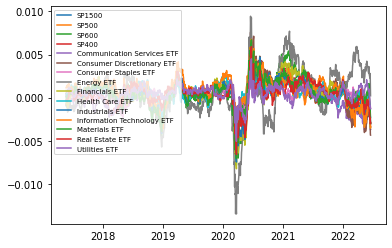

In [21]:
print("Rolling Quarterly Mean Return")
plt.plot(sector_performance_Q_smoothed_return)
plt.legend([*[i for i in spdr_indexes.index],*[v for v in vanguard_sectors.index]],loc=2,fontsize=7)
plt.show()

Quarterly Returns


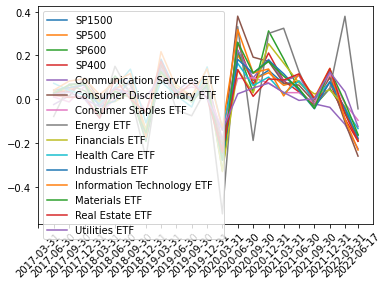

In [22]:
print ("Quarterly Returns")
for v in sector_performance_return.T.index:
    subset = pd.DataFrame(sector_performance_return.T.loc[v])
    subset.columns = ['Return']
    plt.plot(subset)
    plt.xticks(subset.index, rotation=45)
plt.legend(sector_performance_return.T.index,loc=2)    
plt.show()


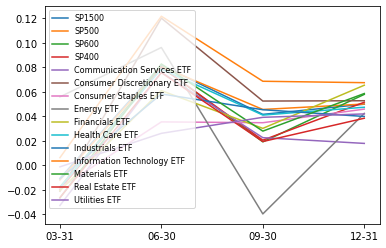

In [23]:
plt.plot(seasonal_indexes[si].T)
plt.legend(seasonal_indexes[si].T.columns,loc=2,fontsize=8)
plt.show()

In [24]:
threshold = .975

In [25]:
screener_sorted_ = screener_sorted.reset_index().merge(stock_indexes,on='Symbol',how='left')

screener_good = screener_sorted_[screener_sorted_['risk_trend_factor']!='missing']

risk_trend_threshold = screener_good['risk_trend_factor'].quantile(q=[threshold]).values[0]


In [26]:
risk_trend_threshold

0.051078501531639196

In [27]:
stock_sectors = stock_fundamentals['sector']

In [28]:
temp = stock_sectors.reset_index()
temp.columns = ['Symbol','Sector']
sector_merged = screener[['risk_trend_factor']].merge(temp, on='Symbol', how='right')
temp_sm = sector_merged.merge(sp1500_index_df, on='Symbol', how='left').set_index('Symbol')
temp_sm.columns = ['risk_trend_factor', 'Sector', 'index']
temp_sm = temp_sm.merge(spdr_indexes.reset_index(), on='index', how='left')
temp_sm.columns = ['risk_trend_factor', 'Sector', 'index','index_Symbol']
temp_sm.index = sector_merged['Symbol']

for spdr_ in range(0,len(spdr_indexes['Symbol'].values)):
    spdr__ = spdr_indexes['Symbol'].values[spdr_]
    spdr__i = spdr_indexes['Symbol'].index[spdr_]
    temp_sm.iloc[np.where(temp_sm.index==spdr__)][['index']] = spdr__i
    temp_sm.iloc[np.where(temp_sm.index==spdr__)][['index_Symbol']] = spdr__

array([[<AxesSubplot:title={'center':'risk_trend_factor'}>]], dtype=object)

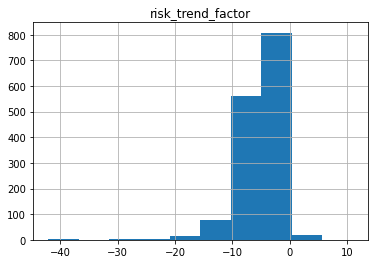

In [29]:
screener[['risk_trend_factor']].replace(['missing','error'], np.NaN).dropna().hist()

In [30]:
len(screener)

1520

In [31]:
prices_df.columns

Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'Symbol',
       'trailing_1yr_max', 'MIN_Lookback_One_Year', 'MIN_Lookback_2_Months',
       'MIN_Lookback_1_Months', 'trailing_1yr_min', 'supply_trend_1yr',
       'supply_trend_60d', 'supply_trend_30d', 'trailing_60d_max',
       'trailing_60d_min', 'trailing_30d_max', 'trailing_30d_min', '90dSMA',
       '90dSDev', 'TP', '21dstdTP', '21dMA-TP', '21dBOLU', '21dBOLD',
       'trailing_risk_40d_max', 'trailing_risk_40d_min', 'risk_per_share',
       '30d_vol', '30d_vol_2yr', 'volume_factor', '1YMF', 'risk_trend_factor'],
      dtype='object')

In [32]:
risk_screened = screener_good[(screener_good['risk_trend_factor']>risk_trend_threshold) & (screener_good['volume_factor']!= 'missing')]
risk_screened = risk_screened.merge(temp, on='Symbol', how='left')
print(risk_screened.columns)
temp_df = risk_screened[['Symbol','latest_p','MIN_Lookback_One_Year', 'MIN_Lookback_2_Months', 'MIN_Lookback_1_Months','risk_trend_factor','volume_factor','adf','hurst','Sector','Market Index']]
temp_df.set_index('Symbol',inplace=True)
pd.concat([temp_df,temp_sm],axis=0)

Index(['Symbol', 'max_2y', 'min_2y', 'std_2y', 'mean_2y', 'max_1y', 'min_1y',
       'std_1y', 'mean_1y', 'latest_p', '2yr_close_0pct', '2yr_close_2pct',
       '2yr_close_9pct', '2yr_close_25pct', '2yr_close_50pct',
       '2yr_close_75pct', '2yr_close_91pct', '2yr_close_98pct',
       '2yr_close_100pct', '1yr_close_0pct', '1yr_close_2pct',
       '1yr_close_9pct', '1yr_close_25pct', '1yr_close_50pct',
       '2yr_close_75pct', '1yr_close_91pct', '1yr_close_98pct',
       '1yr_close_100pct', 'risk_trend_factor', 'supply_trend_1yr',
       'supply_trend_60d', 'supply_trend_30d', 'vol_30d_2yr', 'pct_1yr',
       'pct_2yr', 'MIN_Lookback_One_Year', 'MIN_Lookback_2_Months',
       'MIN_Lookback_1_Months', 'vol_30d', 'volume_factor', 'adf', 'hurst',
       '1YMF', 'Market Index', 'Sector'],
      dtype='object')


,latest_p,MIN_Lookback_One_Year,MIN_Lookback_2_Months,MIN_Lookback_1_Months,risk_trend_factor,volume_factor,adf,hurst,Sector,Market Index,index,index_Symbol
Symbol,,,,,,,,,,,,
ACC,64.230003,49.209999,65.019997,65.019997,10.926848,2.134689,0.978004,0.420279,Real Estate,SP400,NaN,NaN
MTOR,35.939999,32.93,36.279999,36.279999,5.065223,1.664475,0.319063,0.43585,error,SP600,NaN,NaN
TVTY,32.130001,27.870001,32.889999,32.889999,2.341879,1.643789,0.518794,0.448871,error,SP600,NaN,NaN
BANF,94.860001,77.379997,86.82,86.82,2.011991,1.135864,0.955166,0.536352,error,SP600,NaN,NaN
Y,830.5,737.890015,862.869995,862.869995,1.771776,1.56538,0.382688,0.459685,Financial Services,SP400,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
ODFL,NaN,NaN,NaN,NaN,-5.178995,NaN,NaN,NaN,Industrials,NaN,SP500,SPY
EW,NaN,NaN,NaN,NaN,-2.677285,NaN,NaN,NaN,Healthcare,NaN,SP500,SPY
PCRX,NaN,NaN,NaN,NaN,-2.849253,NaN,NaN,NaN,Healthcare,NaN,SP600,SLY


In [33]:

screened_final_set = risk_screened

In [34]:
fundamentals_quarterlies = pickle.load(open('./fundamental.pkl', 'rb'))

In [35]:
fundamental_entries = [e[0] for e in fundamentals_quarterlies]

In [37]:
summary = pd.DataFrame()

In [62]:
summary = pd.DataFrame()
for name_ in np.unique(prices_df['Symbol'].values):
    summary = pd.concat([summary,pd.DataFrame(prices_df[prices_df['Symbol']==name_][['Symbol','MIN_Lookback_One_Year', 'MIN_Lookback_2_Months', 'MIN_Lookback_1_Months','risk_trend_factor','risk_per_share','volume_factor']].iloc[-1]).T.reset_index().set_index('Symbol')],axis=0)



In [64]:
threshold=.95

In [65]:
threshold_value = summary.dropna()['risk_trend_factor'].quantile([threshold])

temp_sm

In [66]:
summary

,index,MIN_Lookback_One_Year,MIN_Lookback_2_Months,MIN_Lookback_1_Months,risk_trend_factor,risk_per_share,volume_factor
Symbol,,,,,,,
A,2022-06-17,147.679993,179.570007,179.570007,-9.088903,18.559998,1.131711
AA,2022-06-17,44.419998,98.089996,98.089996,-3.704472,25.040001,0.98632
AAL,2022-06-17,22.549999,22.549999,22.549999,-3.126898,9.219999,0.707794
AAN,2022-06-17,NaN,35.439999,35.439999,NaN,6.969999,NaN
AAON,2022-06-17,81.25,83.790001,83.790001,-10.22921,9.380001,1.041044
...,...,...,...,...,...,...,...
ZIMV,2022-06-17,NaN,NaN,NaN,NaN,7.92,NaN
ZION,2022-06-17,60.650002,75.440002,75.440002,-4.600841,11.900002,0.978199
ZTS,2022-06-17,187.320007,249.270004,249.270004,-6.71488,31.180008,1.095466


In [67]:
temp_sm.columns

Index(['risk_trend_factor', 'Sector', 'index', 'index_Symbol'], dtype='object')

In [68]:
risk_trend_factor_sector_dict = dict()
for s in sectors['Symbol']:
    risk_trend_factor_sector_dict[s] = prices_df[prices_df['Symbol']==s]['risk_trend_factor'].values[-1]
    
risk_trend_factor_sector_dict['error']='error'    

In [69]:
inv_dict_map = {v: k for k, v in dict_indexes.items()}
inv_dict_map[np.nan] = 'error'
in_ = [inv_dict_map[t[0]] for t in temp_sm[['index']].values]
se_ = [dict_sectors[t[0]] for t in temp_sm[['Sector']].values]
#temp_sm[['Sector','index']]
symbols_w_index_sector = pd.concat([pd.DataFrame(se_,columns=['index'],index=temp_sm.index),pd.DataFrame(in_,columns=['sector'],index=temp_sm.index)],axis=1)

In [70]:
symbols_w_sector_rtf = pd.DataFrame([risk_trend_factor_sector_dict[s] for s in symbols_w_index_sector['index'].values],columns=['sector_risk_trend_factor'],index=symbols_w_index_sector.index)

In [71]:
rick_screener = pd.concat([summary.sort_values(by='risk_trend_factor',ascending=False).iloc[:,1:],symbols_w_index_sector,symbols_w_sector_rtf,temp_sm[['index','Sector']]],axis=1)

In [72]:
rick_screener_final = rick_screener.dropna()[rick_screener.dropna()['risk_trend_factor'].values > threshold_value.values[0]]

In [73]:
rick_screener_final

,MIN_Lookback_One_Year,MIN_Lookback_2_Months,MIN_Lookback_1_Months,risk_trend_factor,risk_per_share,volume_factor,index,sector,sector_risk_trend_factor,index,Sector
Symbol,,,,,,,,,,,
ACC,49.209999,65.019997,65.019997,10.926848,1.23,2.134689,VNQ,MDYG,-3.05337,SP400,Real Estate
MTOR,32.93,36.279999,36.279999,5.065223,0.459999,1.664475,error,SLY,error,SP600,error
TVTY,27.870001,32.889999,32.889999,2.341879,1.170002,1.643789,error,SLY,error,SP600,error
BANF,77.379997,86.82,86.82,2.011991,16.68,1.135864,error,SLY,error,SP600,error
Y,737.890015,862.869995,862.869995,1.771776,15.72998,1.56538,VFH,MDYG,-4.617891,SP400,Financial Services
SAFM,177.479996,200.0,200.0,1.751569,27.089996,1.334104,VDC,MDYG,-2.28397,SP400,Consumer Defensive
SJI,29.24,35.32,35.32,1.295238,2.100002,0.791297,error,SLY,error,SP600,error
LNTH,25.790001,64.139999,69.738998,1.178774,19.079998,1.823238,VHT,SLY,-3.323632,SP600,Healthcare
ROG,206.130005,274.51001,274.51001,1.068804,21.51001,0.980653,error,SLY,error,SP600,error


In [49]:
rick_screener_final.to_csv('rick_screener_final.csv')

In [74]:
#completed_fred_pvt_df = completed_fred_pvt.asfreq('D').reindex(nyse_dates.index).interpolate(method='time')
completed_fred_pvt_df = completed_fred_pvt

temp_new = completed_fred_pvt.asfreq('D').interpolate(method='time',limit_area='inside').reindex(nyse_dates.index)
temp_dates = pd.date_range(completed_fred_pvt.index[0].strftime('%Y-%m-%d'), completed_fred_pvt.index[-1].strftime('%Y-%m-%d'), freq='D').map(lambda t: t.strftime('%Y-%m-%d'))
nyse_inbetween_temp_dates = nyse_dates.index[(nyse_dates.index >= temp_dates[0]) & (nyse_dates.index <= temp_dates[-1])]
temp_new = temp_new.reindex(nyse_inbetween_temp_dates)

completed_fred_pvt_df = temp_new
completed_fred_pvt_df.columns = [name[1] for name in completed_fred_pvt_df.columns]

nominal, pct_change, pct_change().cumsum
Market volatility


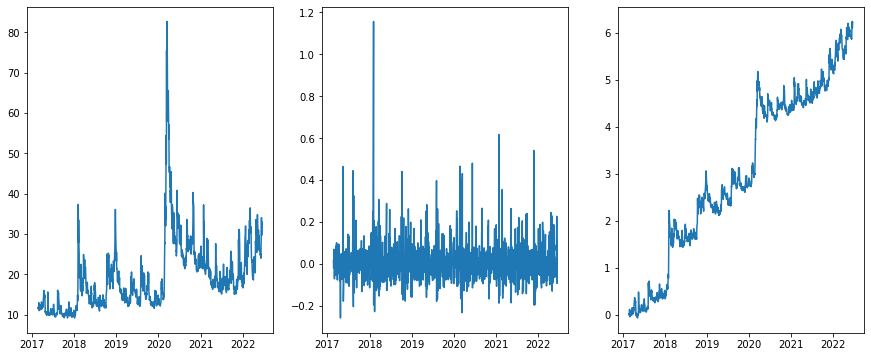

Consumer Confidence


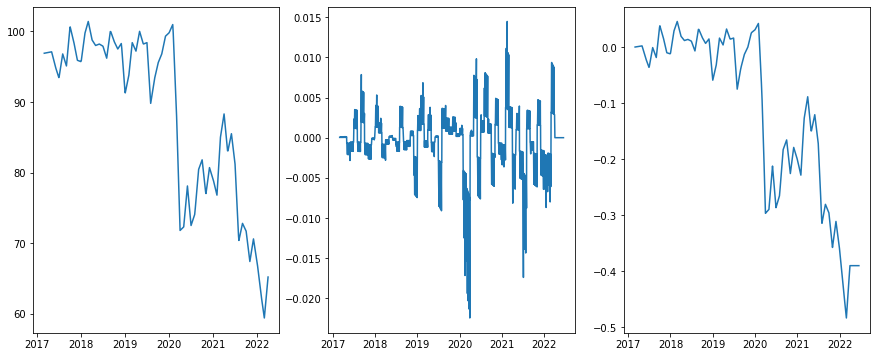

Unemployment


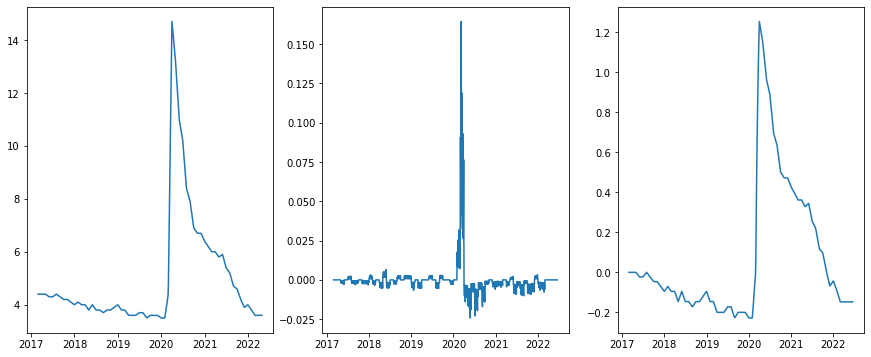

Inflation


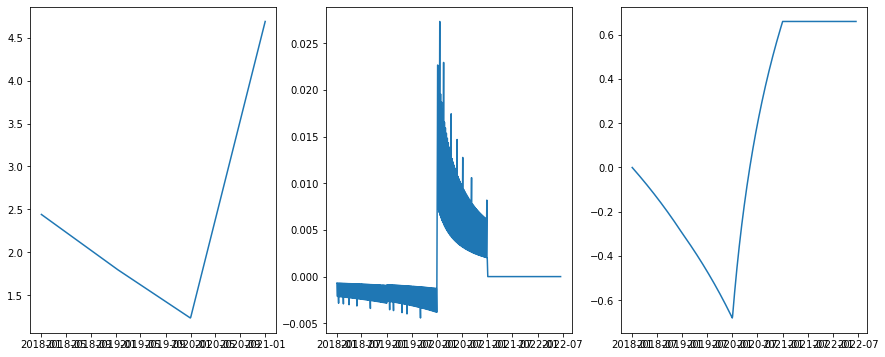

Interest Rates


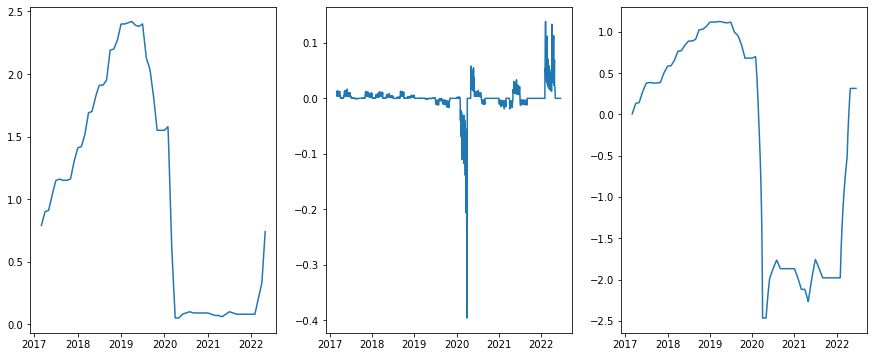

10 Year to 3 Month


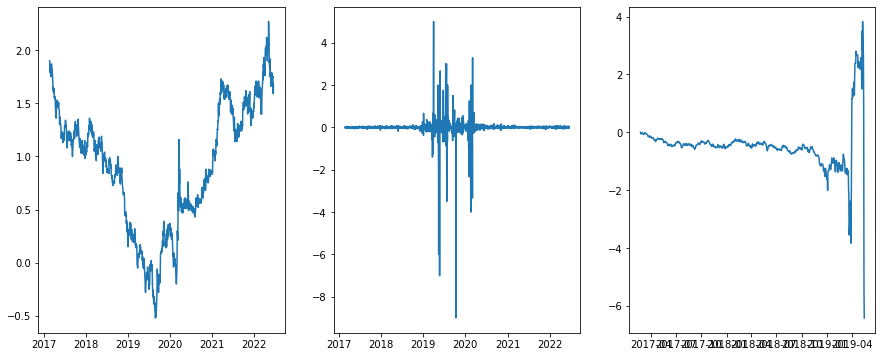

Recession Indicator


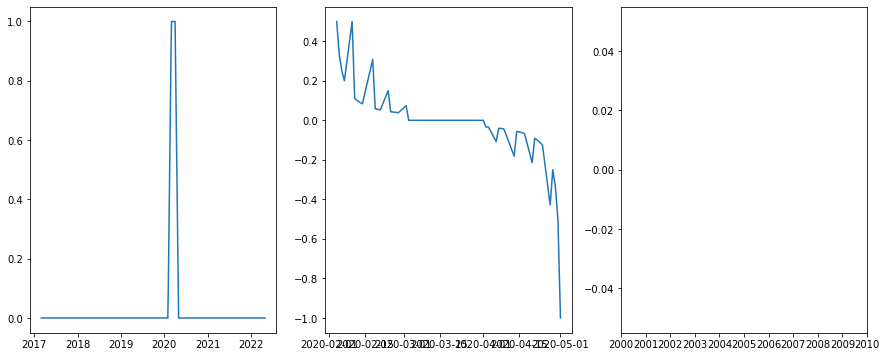

In [75]:
fred_friendly_names = ['Market volatility','Consumer Confidence','Unemployment','Inflation','Interest Rates','10 Year to 3 Month','Recession Indicator']
fred_names = ['VIXCLS','UMCSENT','UNRATE','FPCPITOTLZGUSA','FEDFUNDS','T10Y3M','USREC']
print('nominal,','pct_change,','pct_change().cumsum')
for pos in range(0,len(fred_names)):
    print(fred_friendly_names[pos])
    name = fred_names[pos]
    
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=False,figsize=(15,6))
    ax1.plot(completed_fred_pvt_df[name])
    ax2.plot(completed_fred_pvt_df[name].pct_change())
    ax3.plot(completed_fred_pvt_df[name].pct_change().cumsum())
    plt.show()

In [76]:
#screener['vol_30d_2yr']

In [77]:
#pd.DataFrame(np.mean(np.exp(final_model.get_prediction(start=end,end=(end + dt.timedelta(92)).strftime('%Y-%m-%d')).summary_frame())[['mean','pi_lower']],axis=1)).iloc[0].values[0]
#[s,e_return,s_date,stop_loss_price,days_delta,discounted_return,qtr_return,test_score_mean,test_score_std,mean_revert_flag,p_metrics['pi_lower'].values[0],p_metrics['pi_upper'].values[0]]
#screener['latest_p'].loc[decision_metrics_df.index]

In [78]:
list_ = []
for i in index_risk_sorted['Symbol'].values:
    list_.append(i)
for i in sectors_risk_sorted['Symbol'].values:
    list_.append(i)
#for i in screened_final_set['Symbol'].values:
for i in rick_screener_final.index:
    list_.append(i)
indexes = np.unique(list_, return_index=True)[1]
list__ = [list_[index] for index in sorted(indexes)]

#list__ = ['MCK','MPC','APA','LNTH','MUSA','CIVI','VAW','VGT','EQT','XOM','DVN','MRO','EOG','HES','CEIX','SM','RRC','MUR','MTDR','PXD','OXY','PDCE','NFG','FANG','TWI','PBF','MANT','HRB','VDC','ACC','GO','TVTY','FCN','VIVO']

adf < .05 or .01, mean reverting
Hurst
> .5 - The time series is mean reverting.
= .5 - The time series is a Geometric Brownian Motion.
< .5 - The time series is trending.
symbol: SPY
sector: error
sector: error
Index: SP500
vol_30d_2yr: 1719938470.5078125
Sector 1YMF: -287.8400573730469
1YMF: -287.8400573730469
risk trend factor: -3.791860877423899
      totalAssets  trailingPE
SPY  3.781762e+11    3.819317


,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,365.859985,364.518828,396.470318,428.421808,419.420001,25.514981,368.390039,470.449963


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
SPY,1.183517,365.859985,1719938470.507812,0.369677,0.658465,0.422658


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


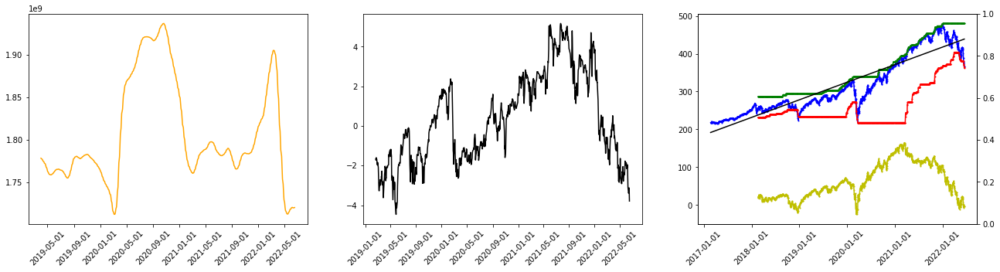

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: [None, 'add', False]
best inner cv score, sdev (11 folds): 1596.0716274191827 2394.562471851756
test cv mean error, stdev (10 folds): 1700.9872506465222 2487.2161986245947
sell date: 2022-09-23
expected return: 0.012609898116259509
discounted return: 0.00012919448362835873
quarter return: 1.011956033500666


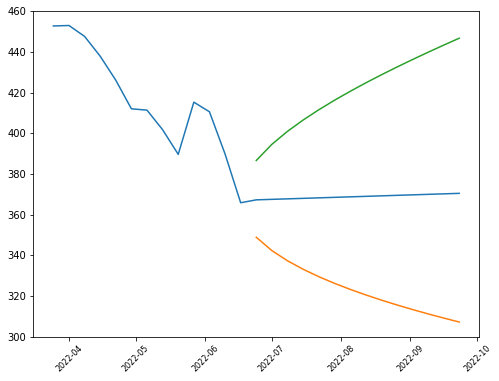

['options', ('2022-06-30', '2022-09-16', '2022-09-30', '2022-12-16', '2023-01-20', '2023-03-17', '2023-06-16', '2023-12-15', '2024-01-19', '2024-12-20')]
symbol: SPTM
sector: error
sector: error
Index: SP1500
vol_30d_2yr: 10189559.1796875
Sector 1YMF: -34.95000076293945
1YMF: -34.95000076293945
risk trend factor: -3.8790224724143685
       totalAssets
SPTM  5.538233e+09


,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,45.310001,44.984943,48.919841,52.854739,51.683968,3.088065,45.507837,57.860099


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
SPTM,1.653055,45.310001,10189559.179688,0.388272,0.658826,0.429487


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


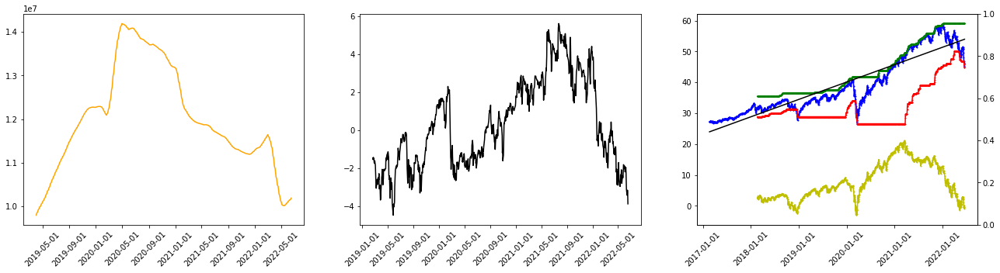

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: [None, 'add', False]
best inner cv score, sdev (11 folds): 26.39441594514144 42.33055953910225
test cv mean error, stdev (10 folds): 28.190454062363578 43.99523397061348
sell date: 2022-09-23
expected return: 0.010819797251917467
discounted return: 0.00011095133058369733
quarter return: 1.0102592248470592


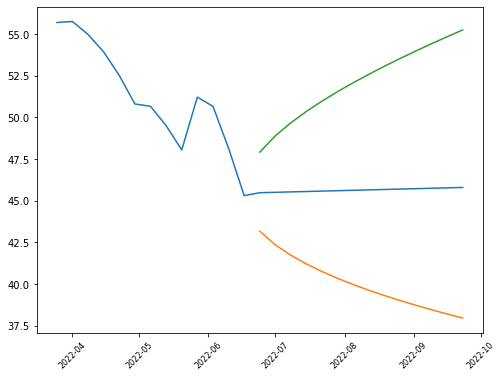

symbol: MDYG
sector: error
sector: error
Index: SP400
vol_30d_2yr: 4938966.40625
Sector 1YMF: -69.05999755859375
1YMF: -69.05999755859375
risk trend factor: -5.134573474205833
Empty DataFrame
Columns: []
Index: [MDYG]


,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,59.93,59.511554,65.413016,71.314478,69.046349,4.323319,60.399712,77.692987


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
MDYG,0.576598,59.93,4938966.40625,0.256027,0.494117,0.451147


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


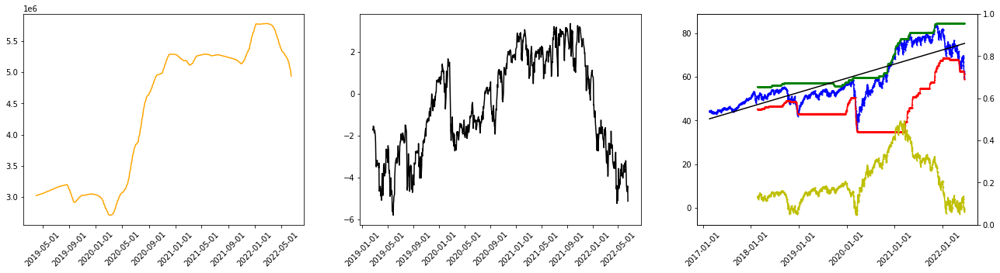

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', 'add', False]
best inner cv score, sdev (11 folds): 85.23639796405821 165.1931289207267
test cv mean error, stdev (10 folds): 92.56630045262767 171.54196178018105
sell date: 2022-08-26
expected return: 0.08365938612054122
discounted return: 0.0011650786730228457
quarter return: 1.1130732080891566


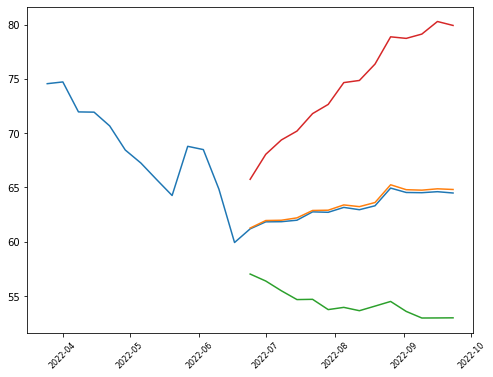

symbol: SLY
sector: error
sector: error
Index: SP600
vol_30d_2yr: 1808137.109375
Sector 1YMF: -77.27001953125
1YMF: -77.27001953125
risk trend factor: -5.242200185196592
Empty DataFrame
Columns: []
Index: [SLY]


,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,78.089996,78.068302,85.071269,92.074236,88.226349,4.474948,79.276452,97.176246


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
SLY,1.23276,78.089996,1808137.109375,0.449524,0.532018,0.51304


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


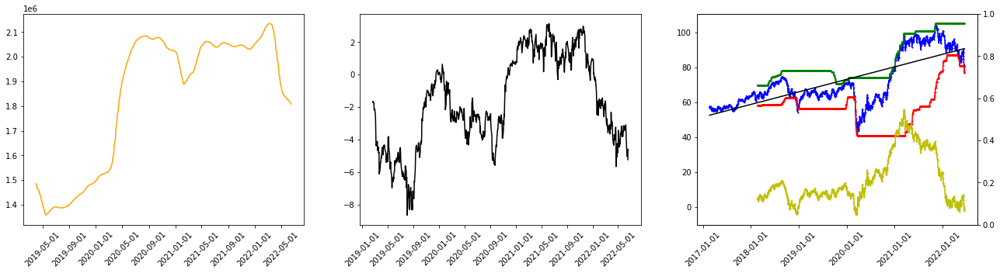

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: [None, 'add', False]
best inner cv score, sdev (11 folds): 128.19891410392745 187.56519320285497
test cv mean error, stdev (10 folds): 137.65292399200544 194.20507371501196
sell date: 2022-06-24
expected return: 0.0017720941375875762
discounted return: 0.0002951311811882906
quarter return: 1.0275199289237973


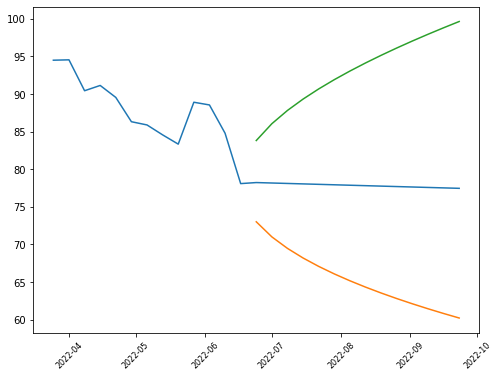

symbol: VDE
sector: error
sector: Energy
Index: nan
vol_30d_2yr: 25785341.015625
Sector 1YMF: -3.82000732421875
1YMF: -3.82000732421875
risk trend factor: -0.12330558135216596
      totalAssets  trailingPE
VDE  1.106882e+10    8.493072


,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,102.349998,106.909959,119.43381,131.957661,112.539048,6.727104,99.08484,125.993256


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
VDE,0.896641,102.349998,25785341.015625,0.70127,0.621023,0.512979


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


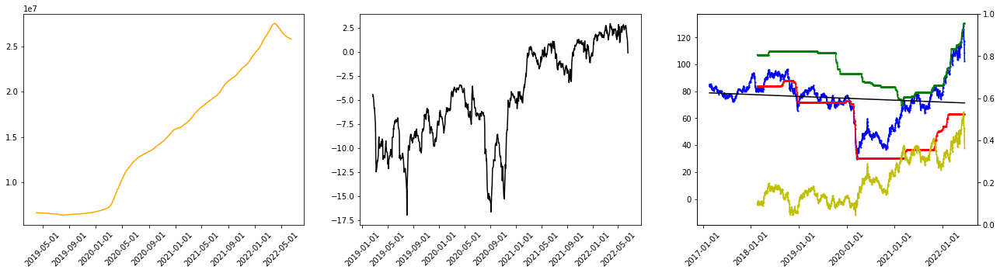

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: [None, None]
best inner cv score, sdev (11 folds): 193.7677791961435 221.58392963783731
test cv mean error, stdev (10 folds): 212.28899085676767 224.13387420460697
sell date: 2022-06-24
expected return: 1.90756226590671e-05
discounted return: 3.1792451740120242e-06
quarter return: 1.000292532870458


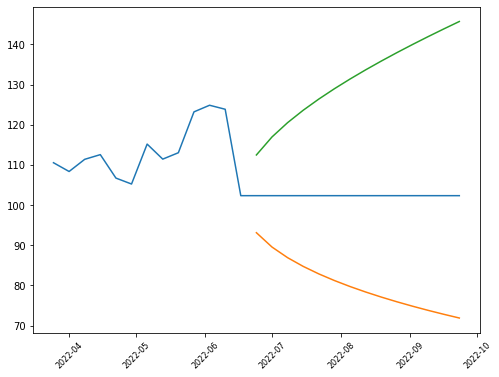

symbol: VDC
sector: error
sector: Consumer Defensive
Index: nan
vol_30d_2yr: 3264449.609375
Sector 1YMF: -74.80001831054688
1YMF: -74.80001831054688
risk trend factor: -2.283970024749523
      totalAssets
VDC  8.239956e+09


,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,177.059998,176.153403,185.845715,195.538026,194.674128,7.920194,178.833739,210.514517


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
VDC,1.413592,177.059998,3264449.609375,0.48903,0.752482,0.355797


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


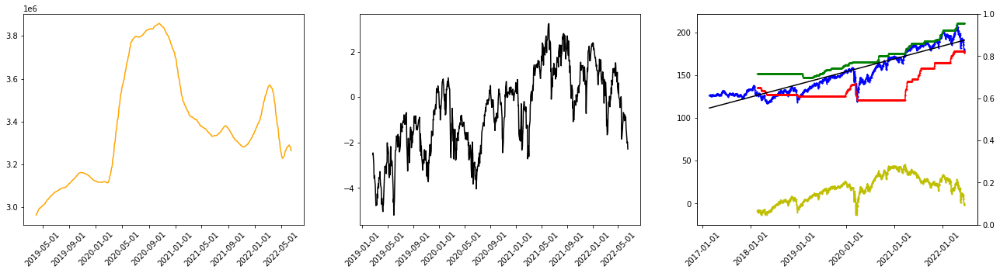

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'add', False]
best inner cv score, sdev (11 folds): 191.4979112634542 238.74580654353574
test cv mean error, stdev (10 folds): 195.94534280335694 249.96392830264483
sell date: 2022-08-12
expected return: 0.03173660560517127
discounted return: 0.0005682233296850914
quarter return: 1.0536514465752513


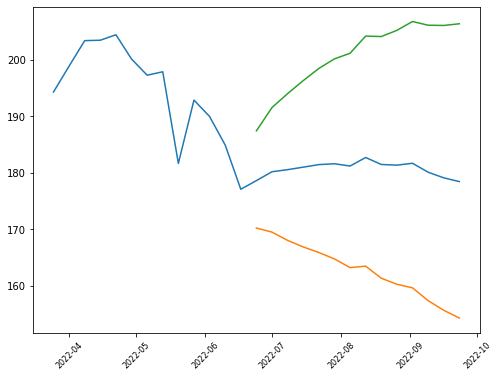

['options', ('2022-07-15',)]
symbol: VPU
sector: error
sector: Utilities
Index: nan
vol_30d_2yr: 5031661.71875
Sector 1YMF: -59.12998962402344
1YMF: -59.12998962402344
risk trend factor: -2.5204591944584465
      totalAssets
VPU  7.854255e+09


,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,141.440002,142.694749,156.469524,170.244299,158.564286,5.736683,147.09092,170.037651


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
VPU,1.250581,141.440002,5031661.71875,0.451674,0.569436,0.290073


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


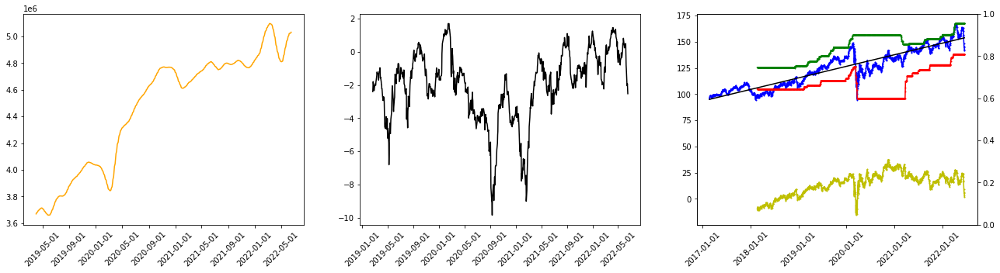

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', None]
best inner cv score, sdev (11 folds): 259.9034946148252 631.266718476635
test cv mean error, stdev (10 folds): 285.00332045950483 656.8252852895172
sell date: 2022-07-01
expected return: 0.026860038182346727
discounted return: 0.0020409753036201295
quarter return: 1.2063247872828784


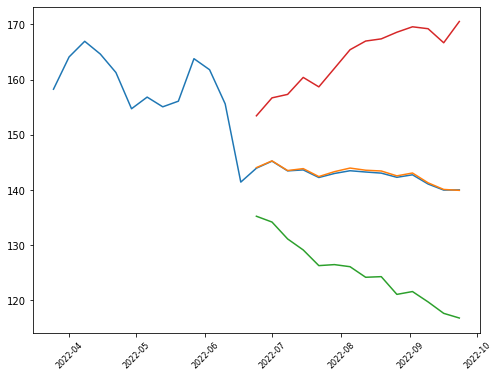

symbol: VNQ
sector: error
sector: Real Estate
Index: nan
vol_30d_2yr: 102932828.515625
Sector 1YMF: -76.09000396728516
1YMF: -76.09000396728516
risk trend factor: -3.053370235265123
      totalAssets
VNQ  7.839537e+10


,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,87.699997,86.580768,94.91381,103.246851,101.788572,7.189885,87.408801,116.168343


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
VNQ,1.231534,87.699997,102932828.515625,0.296727,0.445676,0.39584


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


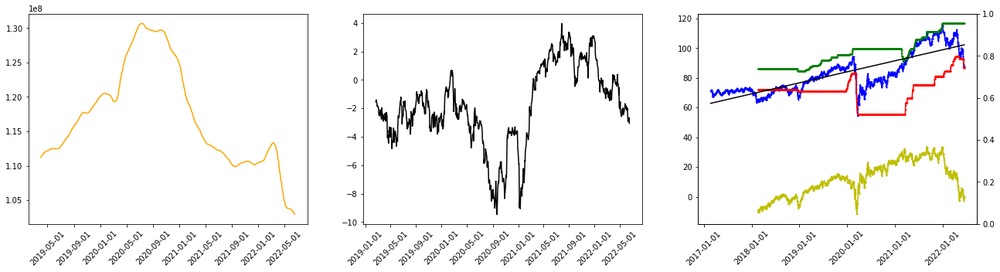

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'mul', False]
best inner cv score, sdev (11 folds): 153.28750939085472 322.62959820325
test cv mean error, stdev (10 folds): 167.1334773908058 335.24622008859063
sell date: 2022-09-02
expected return: 0.03485491172904534
discounted return: 0.0004509073516794082
quarter return: 1.0423461924237896


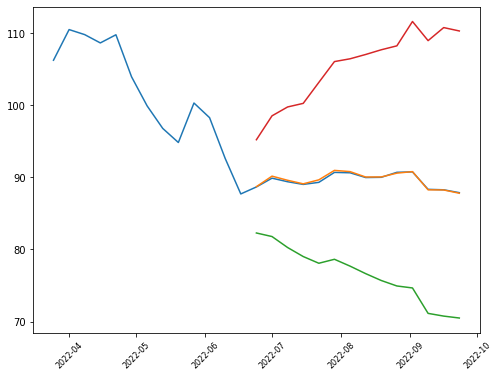

['options', ('2023-01-20', '2024-01-19')]
symbol: VAW
sector: error
sector: Basic Materials
Index: nan
vol_30d_2yr: 2683599.21875
Sector 1YMF: -109.739990234375
1YMF: -109.739990234375
risk trend factor: -3.165271062358118
      totalAssets
VAW  5.085875e+09


,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,162.800003,163.360294,181.546031,199.731768,187.277779,8.558355,170.161068,204.394489


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
VAW,1.040096,162.800003,2683599.21875,0.553392,0.650248,0.42433


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


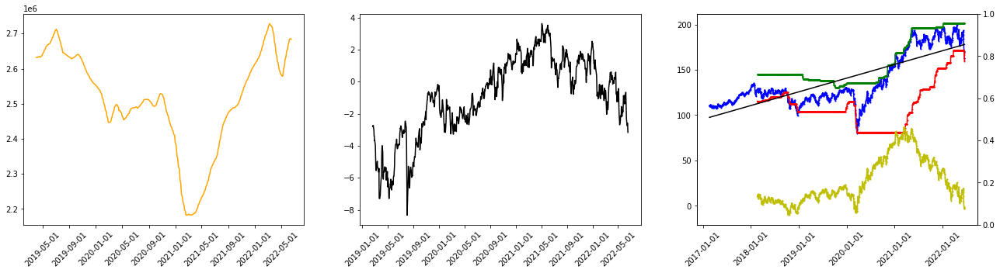

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'mul', True]
best inner cv score, sdev (11 folds): 287.23750917230495 405.6415038695585
test cv mean error, stdev (10 folds): 311.0194778798581 418.06474407205803
sell date: 2022-07-22
expected return: 0.062301865982123776
discounted return: 0.001779172775185911
quarter return: 1.1776706438001052


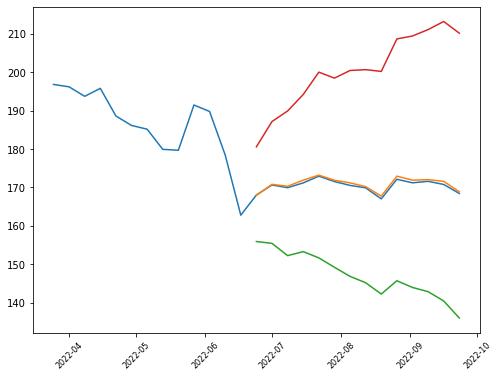

['options', ('2022-08-19',)]
symbol: VHT
sector: error
sector: Healthcare
Index: nan
vol_30d_2yr: 5367987.5
Sector 1YMF: -122.20997619628906
1YMF: -122.20997619628906
risk trend factor: -3.3236323632363236
      totalAssets  trailingPE
VHT  1.866525e+10    4.748669


,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,220.210007,218.770447,234.353333,249.93622,243.78492,11.544258,220.696404,266.873435


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
VHT,1.223885,220.210007,5367987.5,0.406751,0.629182,0.332826


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


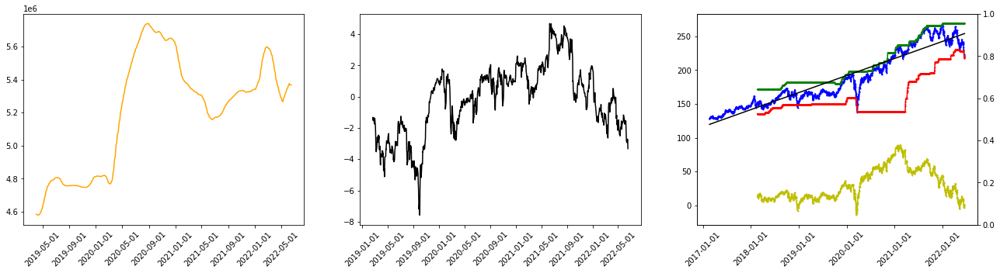

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'mul', False]
best inner cv score, sdev (11 folds): 387.95682447809116 524.4913714720713
test cv mean error, stdev (10 folds): 393.71372312447875 549.7597247376215
sell date: 2022-09-16
expected return: 0.05878535463964933
discounted return: 0.0006348943405740659
quarter return: 1.0601302150853982


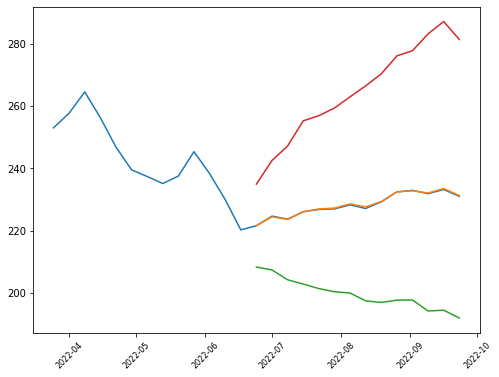

symbol: VIS
sector: error
sector: Industrials
Index: nan
vol_30d_2yr: 3372254.1015625
Sector 1YMF: -141.5800018310547
1YMF: -141.5800018310547
risk trend factor: -4.514668337867341
Empty DataFrame
Columns: []
Index: [VIS]


,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,159.809998,159.424409,172.598254,185.772099,181.362857,9.892736,161.577386,201.148329


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
VIS,0.869685,159.809998,3372254.101562,0.42518,0.484643,0.470479


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


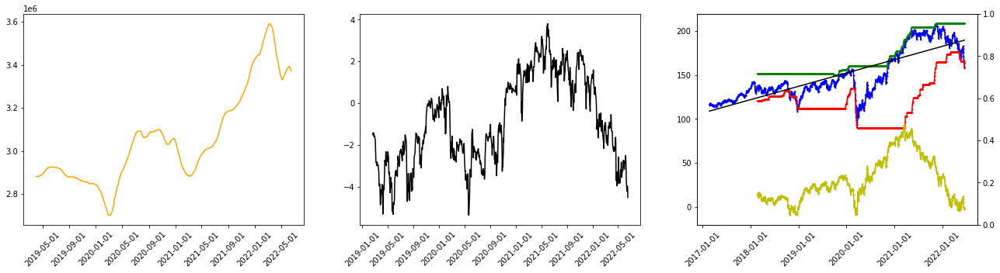

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'mul', False]
best inner cv score, sdev (11 folds): 486.58908964120036 806.4213625334521
test cv mean error, stdev (10 folds): 522.7693332022224 837.2262815693581
sell date: 2022-08-26
expected return: 0.07168349595243555
discounted return: 0.0010038480510021763
quarter return: 1.0967022221413307


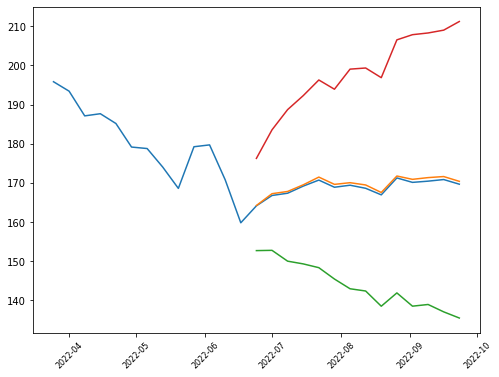

['options', ('2022-08-19',)]
symbol: VFH
sector: error
sector: Financial Services
Index: nan
vol_30d_2yr: 16520124.609375
Sector 1YMF: -72.2699966430664
1YMF: -72.2699966430664
risk trend factor: -4.617890709055871
      totalAssets
VFH  1.046217e+10


,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,75.849998,74.907534,82.472858,90.038182,86.832222,5.55532,75.721582,97.942862


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
VFH,1.270717,75.849998,16520124.609375,0.43829,0.480904,0.491635


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


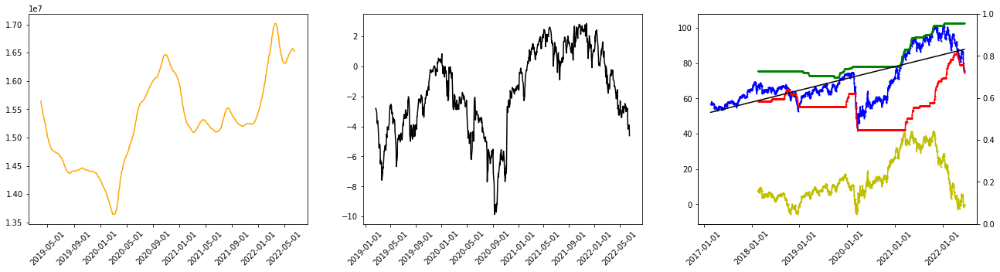

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: [None, 'mul', True]
best inner cv score, sdev (11 folds): 103.91258398370228 124.6246611164399
test cv mean error, stdev (10 folds): 110.84480948786195 128.6695386720602
sell date: 2022-06-24
expected return: 0.0036980731679567285
discounted return: 0.0006153979641310148
quarter return: 1.058231585076761


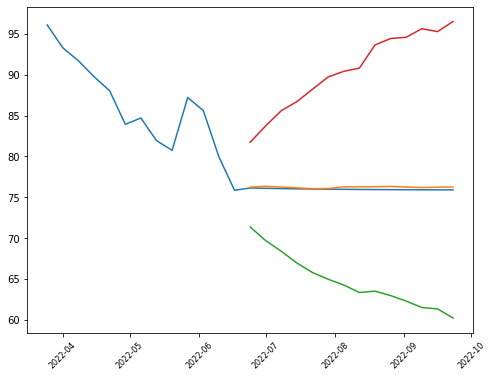

['options', ('2022-08-19',)]
symbol: VCR
sector: error
sector: Consumer Cyclical
Index: nan
vol_30d_2yr: 2596418.1640625
Sector 1YMF: -359.96002197265625
1YMF: -359.96002197265625
risk trend factor: -4.72140697901556
      totalAssets
VCR  6.015592e+09


,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,225.869995,218.39857,242.946031,267.493493,271.133333,28.125894,214.881544,327.385121


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
VCR,1.292819,225.869995,2596418.164062,0.205768,0.641228,0.473825


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


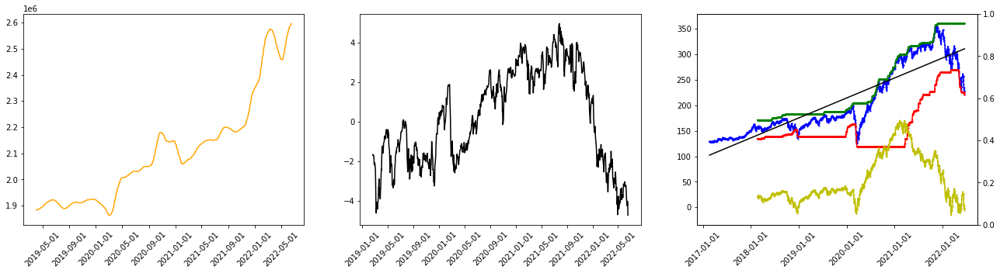

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'add', True]
best inner cv score, sdev (11 folds): 1227.26264257436 1850.6109716481537
test cv mean error, stdev (10 folds): 1337.1747831112584 1906.3986362227797
sell date: 2022-08-05
expected return: 0.022549355093616153
discounted return: 0.00046466785822185663
quarter return: 1.0436659989392758


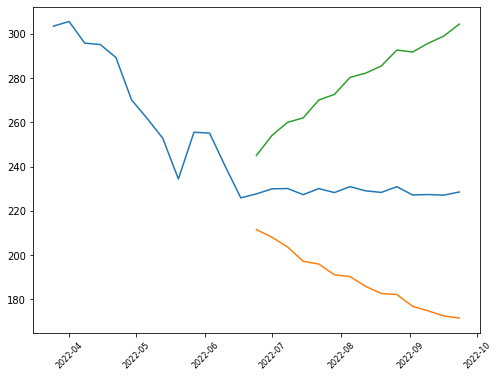

symbol: VGT
sector: error
sector: Technology
Index: nan
vol_30d_2yr: 14308852.5390625
Sector 1YMF: -363.4599914550781
1YMF: -363.4599914550781
risk trend factor: -4.954471974241429
      totalAssets
VGT  5.138536e+10


,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,319.809998,313.391914,345.179842,376.96777,371.755716,29.840347,312.075022,431.43641


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
VGT,1.152846,319.809998,14308852.539062,0.262275,0.685573,0.43018


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


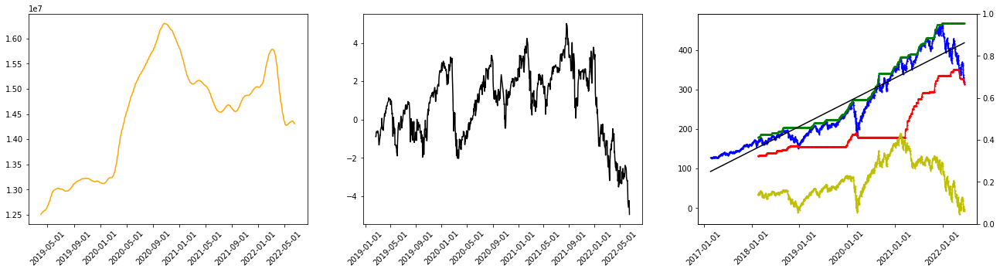

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', 'add', True]
best inner cv score, sdev (11 folds): 1350.1936609353836 1233.3594889668884
test cv mean error, stdev (10 folds): 1427.6804086206787 1267.7724547418923
sell date: 2022-08-26
expected return: 0.0327109593312599
discounted return: 0.00046659206584798163
quarter return: 1.0438506864569341


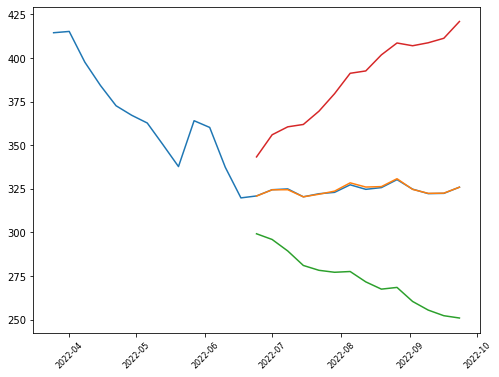

['options', ('2022-08-19',)]
symbol: VOX
sector: error
sector: Communication Services
Index: nan
vol_30d_2yr: 4644931.8359375
Sector 1YMF: -166.010009765625
1YMF: -166.010009765625
risk trend factor: -8.783597691159713
Empty DataFrame
Columns: []
Index: [VOX]


,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,92.860001,91.464788,99.415079,107.365371,107.439841,9.28909,88.861661,126.018022


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
VOX,1.840996,92.860001,4644931.835938,0.059723,0.708136,0.512969


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


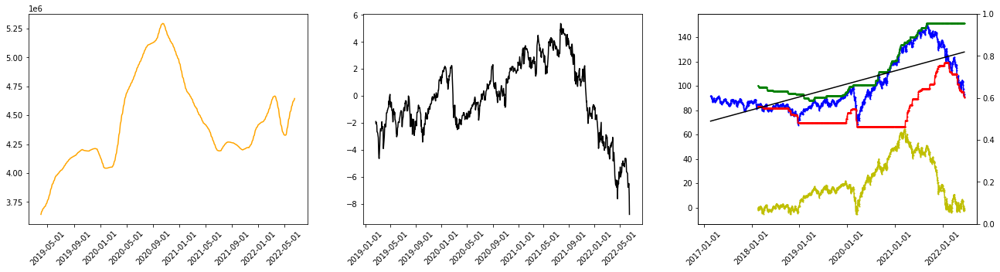

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', None]
best inner cv score, sdev (11 folds): 132.73255032829235 122.26444955631752
test cv mean error, stdev (10 folds): 142.340035105828 124.21072039962147
sell date: 2022-08-26
expected return: 0.052466544660606414
discounted return: 0.000741383377643956
quarter return: 1.070560132013161


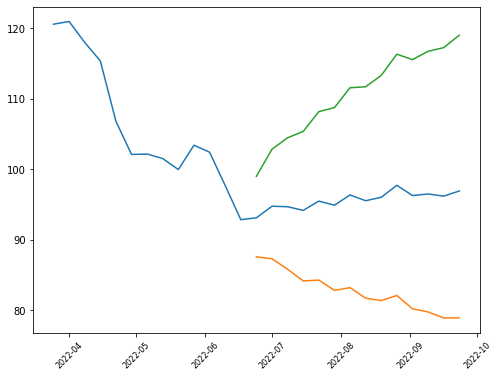

['options', ('2022-07-15',)]
symbol: ACC
sector: Real Estate
Index: SP400
vol_30d_2yr: 27009982.03125
Sector 1YMF: 13.440017700195312
1YMF: 13.440017700195312
risk trend factor: 10.926847725292072
        beta currentRatio debtToEquity dividendRate dividendYield  \
ACC  1.00147        2.184      122.276         1.88         0.029   

    earningsGrowth     ebitda ebitdaMargins forwardPE grossMargins  \
ACC          1.498  466354240       0.47421  98.81539       0.5349   

    grossProfits heldPercentInstitutions          industry   marketCap  \
ACC    498042000                 0.97986  REIT—Residential  8938053632   

    operatingMargins payoutRatio pegRatio priceToBook  \
ACC          0.19318         4.7     1.96    2.993987   

    priceToSalesTrailing12Months profitMargins quickRatio returnOnAssets  \
ACC                     9.088625       0.06005      1.888        0.01582   

    returnOnEquity revenueGrowth revenuePerShare       sector  \
ACC        0.01872         0.176         

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,64.230003,64.240713,64.712222,65.183731,62.082857,3.916774,54.249309,69.916406


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
ACC,2.134689,64.230003,27009982.03125,0.97101,0.978004,0.420279


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -76.09000396728516
Sector Volume Factor: 1.2315342134094496
Sector Risk Trend Factor: -3.053370235265123
Index 1YMF: -69.05999755859375
Index Volume Factor: 0.5765983741853883
Index Risk Trend Factor: -5.134573474205833


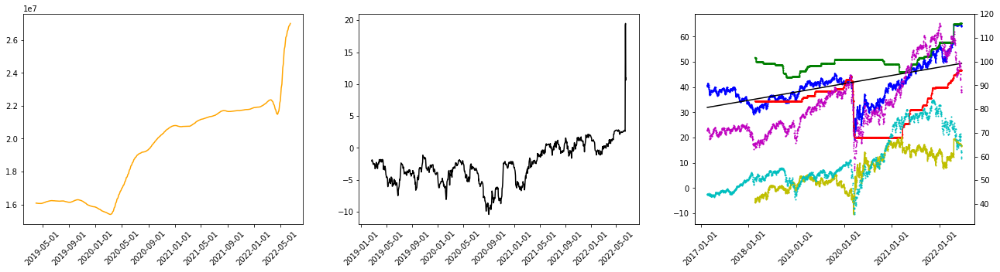

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'mul', False]
best inner cv score, sdev (11 folds): 60.642543509569535 138.4797986966537
test cv mean error, stdev (10 folds): 66.26512803918772 144.03706611000356
sell date: 2022-09-02
expected return: 0.03505054443547022
discounted return: 0.0004533956570731412
quarter return: 1.0425847300311661


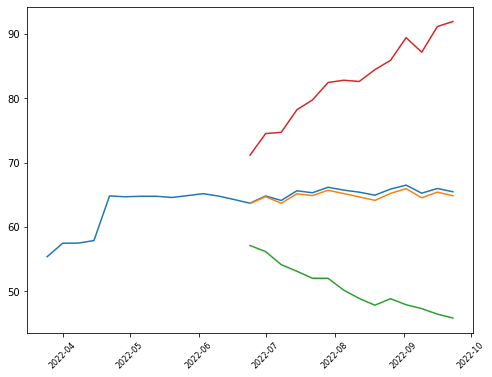

['quarterly_balance_sheet',                              2022-03-31    2021-12-31    2021-09-30  \
Capital Surplus            4.693018e+09  4.694242e+09  4.538210e+09   
Total Liab                 4.218002e+09  4.273301e+09  4.501487e+09   
Total Stockholder Equity   3.093994e+09  3.117378e+09  2.982993e+09   
Minority Interest          1.842520e+08  1.839070e+08  6.423900e+07   
Deferred Long Term Liab    7.300000e+06  3.450000e+07  2.750000e+07   
Total Assets               7.496248e+09  7.574586e+09  7.548719e+09   
Common Stock               1.393000e+06  1.391000e+06  1.390000e+06   
Other Current Assets       1.698800e+07  1.432600e+07  2.016300e+07   
Other Liab                 1.522020e+08  1.697290e+08  1.850330e+08   
Treasury Stock            -1.600417e+09 -1.578255e+09 -1.556607e+09   
Other Assets               2.143290e+08  1.773490e+08  2.318220e+08   
Cash                       8.765600e+07  1.203510e+08  4.207300e+07   
Total Current Liabilities  5.727700e+07  1.168230

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,35.939999,35.942037,36.098889,36.25574,35.883651,0.243988,35.395675,36.371626


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
MTOR,1.664475,35.939999,15456103.320312,0.980154,0.319063,0.43585


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


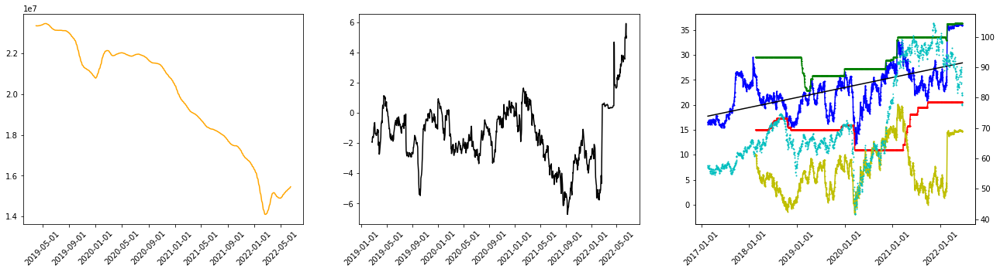

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', None]
best inner cv score, sdev (11 folds): 25.65779561194668 21.942882097397383
test cv mean error, stdev (10 folds): 25.484578190486864 23.006716636536158
sell date: 2022-07-22
expected return: 0.009446180653314162
discounted return: 0.00027656307402290636
quarter return: 1.0257666508377978


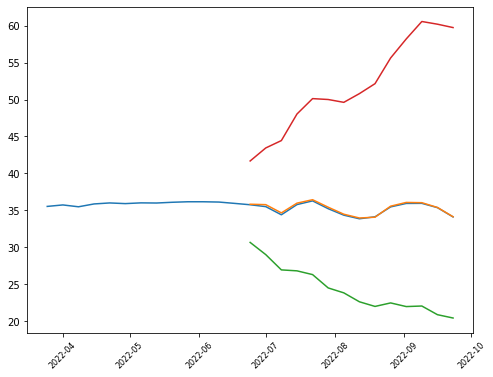

['options', ('2022-08-19',)]
symbol: TVTY
sector: error
sector: error
Index: SP600
vol_30d_2yr: 10900973.046875
Sector 1YMF: 2.7400035858154297
1YMF: 2.7400035858154297
risk trend factor: 2.3418794362082624
Empty DataFrame
Columns: []
Index: [TVTY]


,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,32.130001,31.878985,32.19127,32.503555,31.861111,0.826432,30.208246,33.513976


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
TVTY,1.643789,32.130001,10900973.046875,0.966327,0.518794,0.448871


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


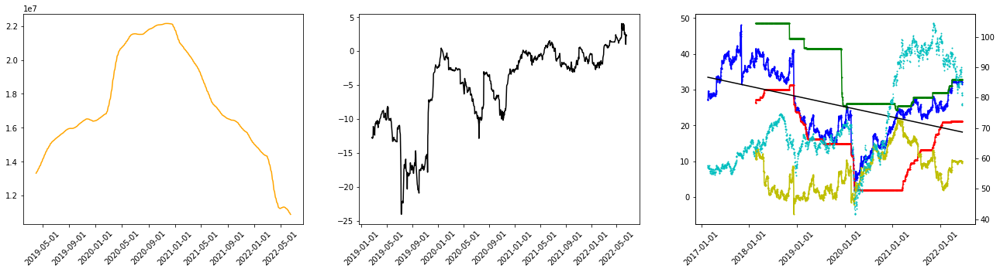

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'mul', True]
best inner cv score, sdev (11 folds): 18.83227344372547 14.827822276471226
test cv mean error, stdev (10 folds): 19.958987625493084 15.095907110456098
sell date: 2022-08-05
expected return: 0.05408821482336362
discounted return: 0.0010980220080683
quarter return: 1.1062352736529146


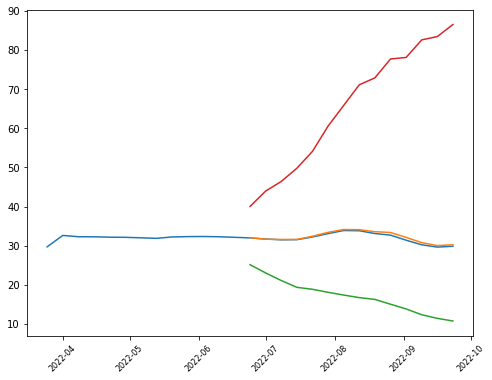

['options', ('2022-08-19',)]
symbol: BANF
sector: error
sector: error
Index: SP600
vol_30d_2yr: 2480755.6640625
Sector 1YMF: 33.56000518798828
1YMF: 33.56000518798828
risk trend factor: 2.0119906818931326
Empty DataFrame
Columns: []
Index: [BANF]


,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,94.860001,81.144325,89.856826,98.569327,85.566191,4.220089,77.126013,94.006368


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
BANF,1.135864,94.860001,2480755.664062,0.965783,0.955166,0.536352


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


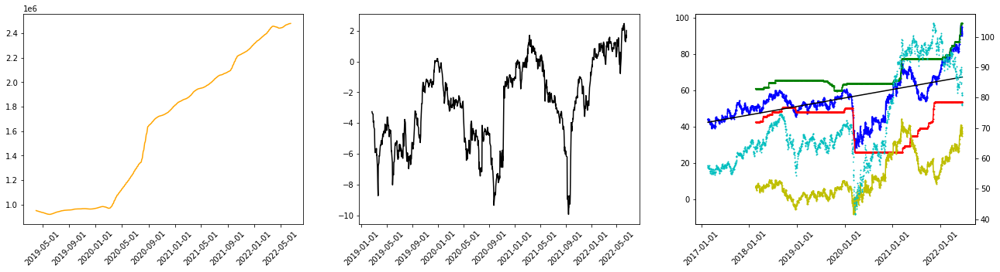

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', None]
best inner cv score, sdev (11 folds): 111.50549198081326 87.12427024896579
test cv mean error, stdev (10 folds): 118.63567504629381 88.26362601419291
sell date: 2022-07-15
expected return: 0.022973657467744026
discounted return: 0.000841603444492911
quarter return: 1.0804687270711635


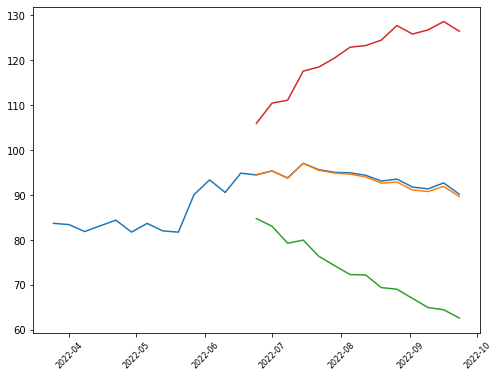

symbol: Y
sector: Financial Services
Index: SP400
vol_30d_2yr: 1623886.71875
Sector 1YMF: 27.8699951171875
1YMF: 27.8699951171875
risk trend factor: 1.771775570386466
       beta currentRatio debtToEquity earningsGrowth      ebitda  \
Y  0.663839        1.597         31.5         -0.433  1620000000   

  ebitdaMargins forwardPE freeCashflow grossMargins grossProfits  \
Y       0.13423  9.936376     90016496      0.44211   5101669000   

  heldPercentInstitutions                       industry    marketCap  \
Y                 0.86723  Insurance—Property & Casualty  11220848640   

  operatingCashflow operatingMargins payoutRatio pegRatio priceToBook  \
Y        1928840960          0.11935           0     0.15    1.305451   

  priceToSalesTrailing12Months profitMargins quickRatio returnOnAssets  \
Y                     0.929715        0.0771      1.004        0.02938   

  returnOnEquity revenueGrowth revenuePerShare              sector  \
Y        0.11868         0.025         878.577

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,830.5,830.573879,833.250157,835.926435,838.613332,7.460501,823.69233,853.534333


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
Y,1.56538,830.5,1623886.71875,0.919536,0.382688,0.459685


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -72.2699966430664
Sector Volume Factor: 1.2707168073107045
Sector Risk Trend Factor: -4.617890709055871
Index 1YMF: -69.05999755859375
Index Volume Factor: 0.5765983741853883
Index Risk Trend Factor: -5.134573474205833


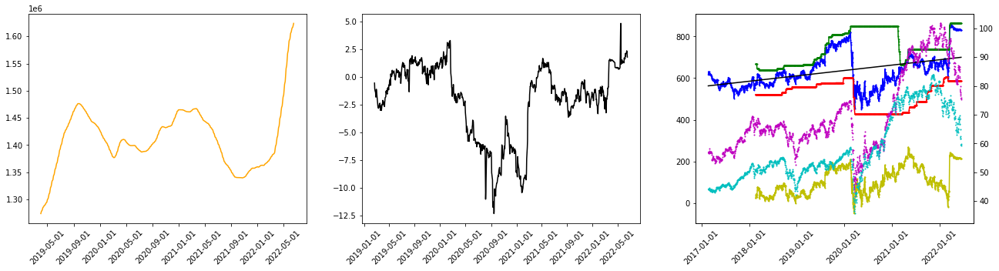

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'mul', False]
best inner cv score, sdev (11 folds): 7631.685635736606 8525.188460803654
test cv mean error, stdev (10 folds): 8115.113080337962 8822.79372246698
sell date: 2022-08-05
expected return: 0.04148541188041907
discounted return: 0.0008471914721568385
quarter return: 1.0810238683982902


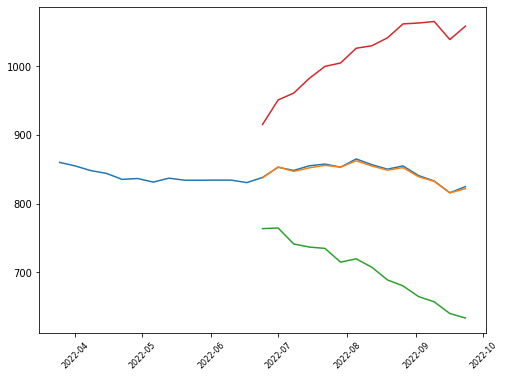

['options', ('2022-07-15',)]
['sustainability',                            Value
2022-5                          
palmOil                    False
controversialWeapons       False
gambling                   False
socialScore                 8.71
nuclear                    False
furLeather                 False
alcoholic                  False
gmo                        False
catholic                   False
socialPercentile            None
peerCount                     96
governanceScore            11.77
environmentPercentile       None
animalTesting              False
tobacco                    False
totalEsg                   21.71
highestControversy             1
esgPerformance          AVG_PERF
coal                       False
pesticides                 False
adult                      False
percentile                 30.32
peerGroup              Insurance
smallArms                  False
environmentScore            1.23
governancePercentile        None
militaryContract           F

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,208.309998,186.953267,199.289207,211.625148,191.30127,7.50937,176.282531,206.320009


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
SAFM,1.334104,208.309998,5061001.171875,0.98121,0.675913,0.476629


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -74.80001831054688
Sector Volume Factor: 1.4135920452708397
Sector Risk Trend Factor: -2.283970024749523
Index 1YMF: -69.05999755859375
Index Volume Factor: 0.5765983741853883
Index Risk Trend Factor: -5.134573474205833


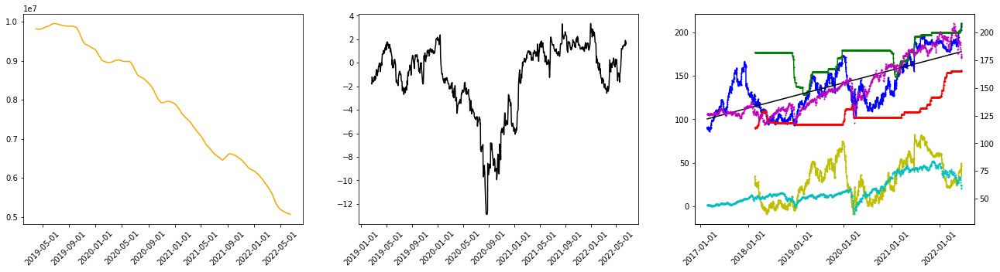

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: [None, None]
best inner cv score, sdev (11 folds): 435.2291108176721 593.833764340624
test cv mean error, stdev (10 folds): 459.8899865755935 617.424203375141
sell date: 2022-06-24
expected return: -0.0012086240294819552
discounted return: -0.00020153885574014652
quarter return: 0.9816274284294342


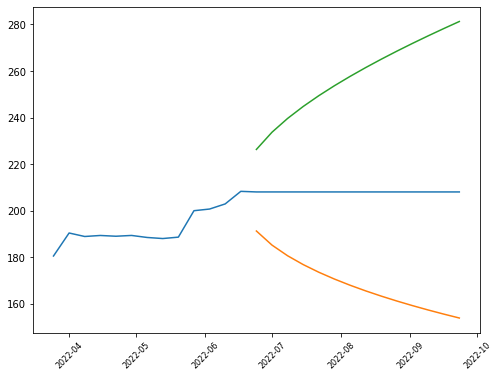

['options', ('2022-08-19', '2022-12-16')]
symbol: SJI
sector: error
sector: error
Index: SP600
vol_30d_2yr: 26850614.0625
Sector 1YMF: 2.720003128051758
1YMF: 2.720003128051758
risk trend factor: 1.295238173088975
Empty DataFrame
Columns: []
Index: [SJI]


,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,34.200001,33.571564,34.29746,35.023356,34.252857,0.376732,33.499393,35.006321


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
SJI,0.791297,34.200001,26850614.0625,0.934426,0.172286,0.415691


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


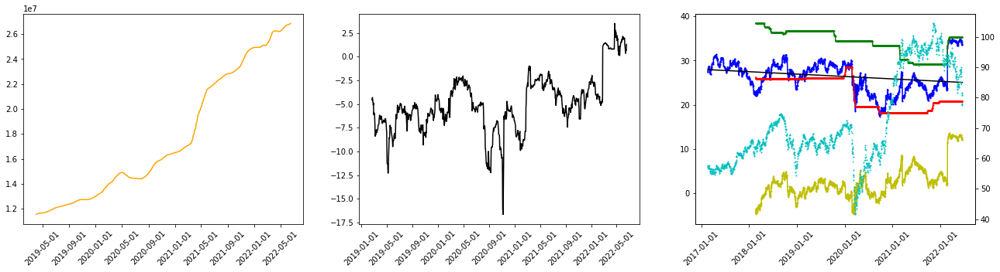

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', 'add', True]
best inner cv score, sdev (11 folds): 8.124417003418456 7.859126305360561
test cv mean error, stdev (10 folds): 8.673775444676817 8.038839881457797
sell date: 2022-09-02
expected return: 0.062094459769236734
discounted return: 0.0007929835089000026
quarter return: 1.075650475691347


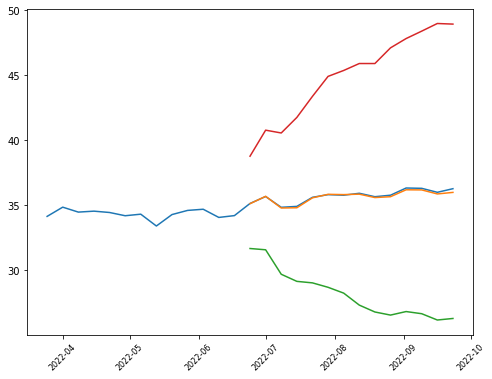

['options', ('2022-07-15',)]
symbol: LNTH
sector: Healthcare
Index: SP600
vol_30d_2yr: 14149384.1796875
Sector 1YMF: 22.491004943847656
1YMF: 22.491004943847656
risk trend factor: 1.1787739665678139
          beta currentRatio debtToEquity earningsGrowth     ebitda  \
LNTH  0.750453        1.828       36.846          3.692  108329000   

     ebitdaMargins  forwardPE freeCashflow grossMargins grossProfits  \
LNTH       0.20002  18.234236     77142872      0.50913    187695000   

     heldPercentInstitutions                industry   marketCap  \
LNTH                 1.01237  Diagnostics & Research  4167462400   

     operatingCashflow operatingMargins payoutRatio pegRatio priceToBook  \
LNTH          54362000          0.11518           0     0.55    8.071249   

     priceToSalesTrailing12Months profitMargins quickRatio returnOnAssets  \
LNTH                     7.695022      -0.06892      1.563        0.04389   

     returnOnEquity revenueGrowth revenuePerShare      sector  \
LNTH 

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,60.720001,58.693247,66.262412,73.831578,61.742857,5.236883,51.269091,72.216623


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
LNTH,1.823238,60.720001,14149384.179688,0.79355,0.965336,0.533209


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -122.20997619628906
Sector Volume Factor: 1.2238851152317325
Sector Risk Trend Factor: -3.3236323632363236
Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


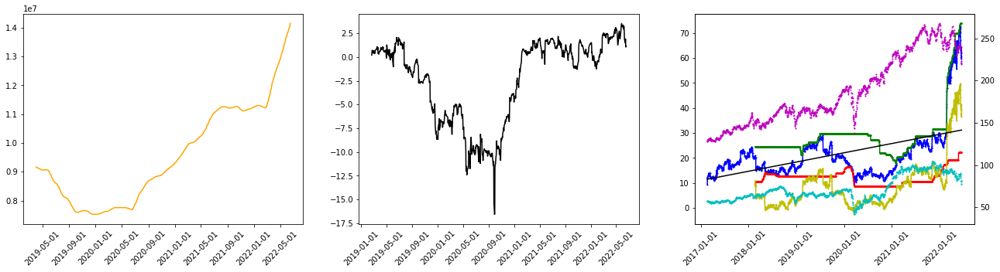

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'add', False]
best inner cv score, sdev (11 folds): 44.12135433697958 56.91591689823112
test cv mean error, stdev (10 folds): 42.361417550444955 59.40784968218662
sell date: 2022-09-23
expected return: 0.26388207127562513
discounted return: 0.0024172260009476254
quarter return: 1.2487167790741427


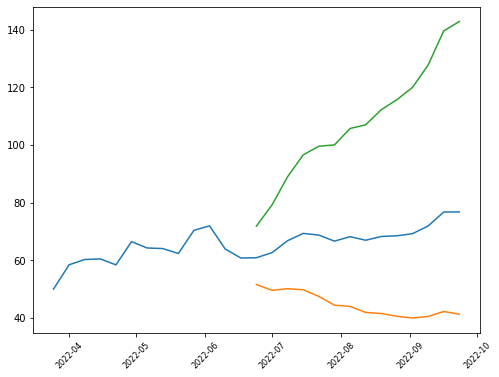

['quarterly_balance_sheet',                                    2022-03-31   2021-12-31   2021-09-30  \
Intangible Assets                 340204000.0  348510000.0  356883000.0   
Capital Surplus                   691516000.0  685472000.0  680819000.0   
Total Liab                        417316000.0  399345000.0  348472000.0   
Total Stockholder Equity          515850000.0  464439000.0  499344000.0   
Other Current Liab                 89178000.0          NaN          NaN   
Total Assets                      933166000.0  863784000.0  847816000.0   
Common Stock                         686000.0     677000.0     677000.0   
Other Current Assets               12860000.0    2705000.0   12043000.0   
Retained Earnings                -178263000.0 -221225000.0 -181010000.0   
Other Liab                         64083000.0  129181000.0   88437000.0   
Good Will                          61189000.0   61189000.0   61189000.0   
Treasury Stock                      1911000.0    -485000.0   -1142000.0 

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,259.380005,254.172765,260.19492,266.217074,267.576983,6.298768,254.979447,280.17452


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
ROG,0.980653,259.380005,3248345.898438,0.91539,0.71811,0.478768


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


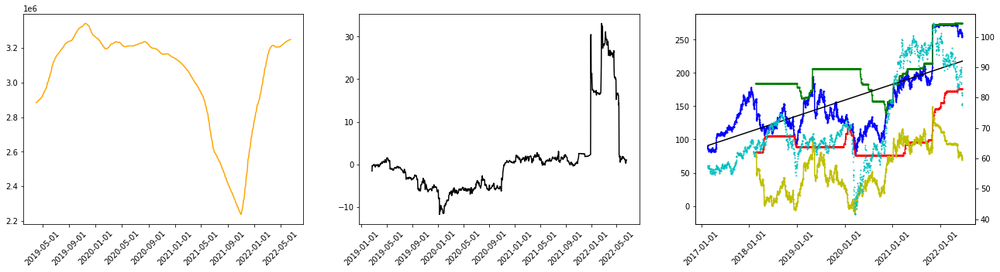

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'add', False]
best inner cv score, sdev (11 folds): 1011.9720205311853 1503.6247098356484
test cv mean error, stdev (10 folds): 1106.8167127613508 1545.32393368847
sell date: 2022-09-23
expected return: 0.1391103510623887
discounted return: 0.0013436602947727305
quarter return: 1.131488216494553


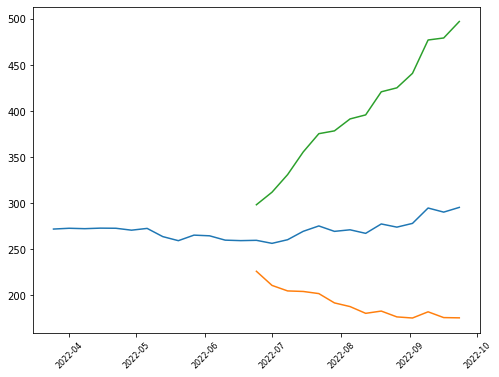

symbol: TWI
sector: Industrials
Index: SP600
vol_30d_2yr: 10530212.5
Sector 1YMF: 6.0800018310546875
1YMF: 6.0800018310546875
risk trend factor: 0.9310876079145333
         beta currentRatio debtToEquity earningsGrowth     ebitda  \
TWI  2.412885        1.853      219.119          0.682  163579008   

    ebitdaMargins forwardPE freeCashflow grossMargins grossProfits  \
TWI       0.08464   8.09589    -24455124      0.13457    227051000   

    heldPercentInstitutions                             industry   marketCap  \
TWI                 0.77816  Farm & Heavy Construction Machinery  1110906752   

    operatingCashflow operatingMargins payoutRatio pegRatio priceToBook  \
TWI           8171000          0.06043           0     0.38    4.470499   

    priceToSalesTrailing12Months profitMargins quickRatio returnOnAssets  \
TWI                     0.574797       0.03101      0.829        0.06237   

    returnOnEquity revenueGrowth revenuePerShare       sector  \
TWI        0.28169        

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,17.52,16.247353,18.072381,19.897408,15.954921,1.924943,12.105034,19.804807


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
TWI,1.389288,17.52,10530212.5,0.876816,0.791457,0.500704


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -141.5800018310547
Sector Volume Factor: 0.8696853533786545
Sector Risk Trend Factor: -4.514668337867341
Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


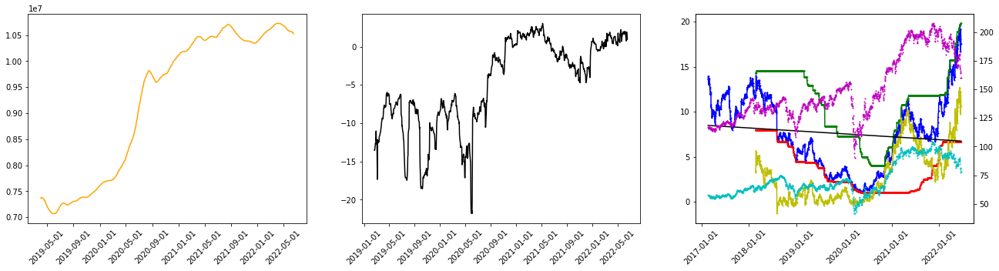

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: [None, 'mul', False]
best inner cv score, sdev (11 folds): 4.4397757974774485 6.24831348618501
test cv mean error, stdev (10 folds): 4.868334990724327 6.397286244207556
sell date: 2022-09-23
expected return: 0.40453744844593575
discounted return: 0.0035082843170333167
quarter return: 1.3801570639888343


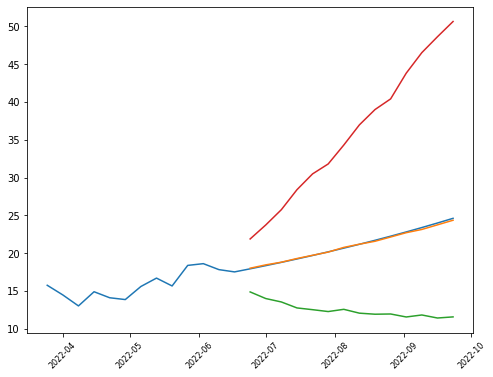

['options', ('2022-07-15',)]
symbol: PBF
sector: Energy
Index: SP600
vol_30d_2yr: 92668774.0234375
Sector 1YMF: 17.619998931884766
1YMF: 17.619998931884766
risk trend factor: 0.8876574451557954
         beta currentRatio debtToEquity     ebitda ebitdaMargins  forwardPE  \
PBF  2.259981        1.254      197.914  690400000       0.02194  11.930909   

    freeCashflow grossMargins grossProfits heldPercentInstitutions  \
PBF    284750016       0.0362    671100000                 0.80139   

                           industry   marketCap operatingCashflow  \
PBF  Oil & Gas Refining & Marketing  3964366848         803299968   

    operatingMargins payoutRatio pegRatio priceToBook  \
PBF           0.0135           0    -0.18    2.070946   

    priceToSalesTrailing12Months profitMargins quickRatio returnOnAssets  \
PBF                     0.125972       0.00798      0.629        0.02192   

    returnOnEquity revenueGrowth revenuePerShare  sector sharesOutstanding  \
PBF        0.14223   

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,32.98,27.175062,35.668889,44.162716,29.964286,5.34115,19.281986,40.646585


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
PBF,0.835417,32.98,92668774.023438,0.721917,0.581704,0.554972


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


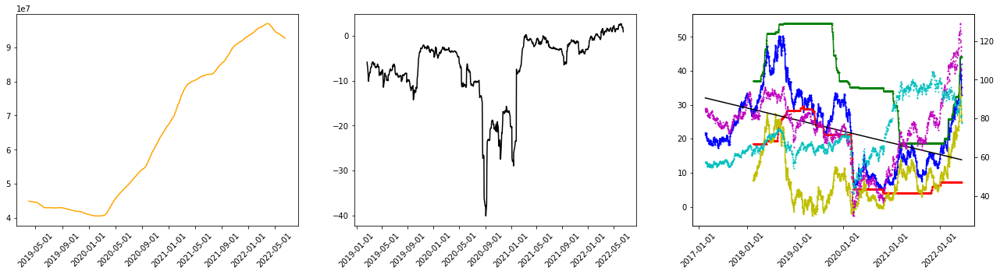

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: [None, 'add', True]
best inner cv score, sdev (11 folds): 32.03876276506622 24.823205586847095
test cv mean error, stdev (10 folds): 30.71500796571063 25.661938537196313
sell date: 2022-06-24
expected return: -0.0025007517238123207
discounted return: -0.00041722690767520554
quarter return: 0.962334779386255


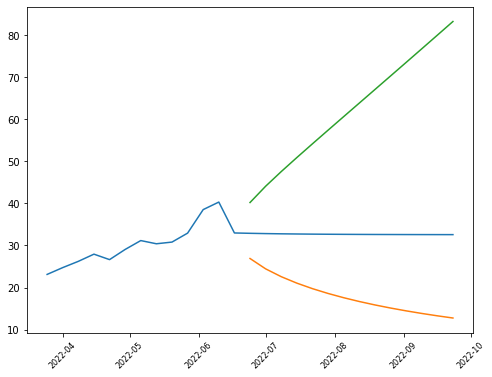

['options', ('2022-07-15', '2022-12-16', '2023-01-20', '2024-01-19')]
symbol: GO
sector: Consumer Defensive
Index: SP400
vol_30d_2yr: 21744971.2890625
Sector 1YMF: 9.090003967285156
1YMF: 9.090003967285156
risk trend factor: 0.8421349867224205
        beta currentRatio debtToEquity earningsGrowth     ebitda  \
GO -0.204778        1.904      144.187         -0.368  158646000   

   ebitdaMargins  forwardPE freeCashflow grossMargins grossProfits  \
GO       0.05023  34.782608    -14480875      0.30639    948786000   

   heldPercentInstitutions        industry   marketCap operatingCashflow  \
GO                  1.0557  Grocery Stores  3854695936         175503008   

   operatingMargins payoutRatio pegRatio priceToBook  \
GO          0.02681           0      3.5    3.760813   

   priceToSalesTrailing12Months profitMargins quickRatio returnOnAssets  \
GO                     1.220403       0.01741      0.611        0.02033   

   returnOnEquity revenueGrowth revenuePerShare              

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,40.150002,35.915072,38.024936,40.134801,35.226667,2.439389,30.347888,40.105445


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
GO,1.191531,40.150002,21744971.289062,0.687007,0.173605,0.403873


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -74.80001831054688
Sector Volume Factor: 1.4135920452708397
Sector Risk Trend Factor: -2.283970024749523
Index 1YMF: -69.05999755859375
Index Volume Factor: 0.5765983741853883
Index Risk Trend Factor: -5.134573474205833


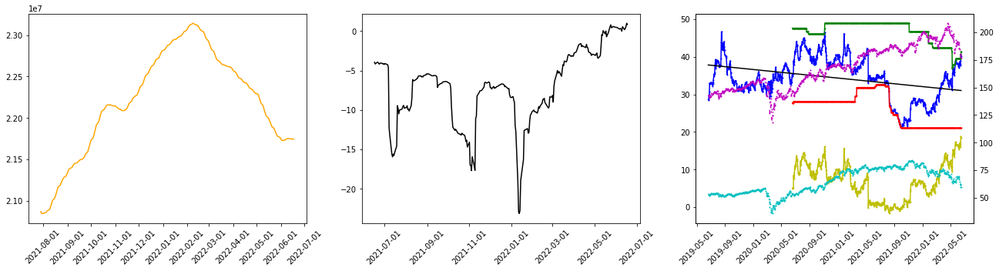

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'add', True]
best inner cv score, sdev (11 folds): 23.788531080664846 17.286788357766444
test cv mean error, stdev (10 folds): 23.78853331644342 17.286791788688287
sell date: 2022-07-22
expected return: 0.12744091149424003
discounted return: 0.0035341830305344324
quarter return: 1.38343789336099


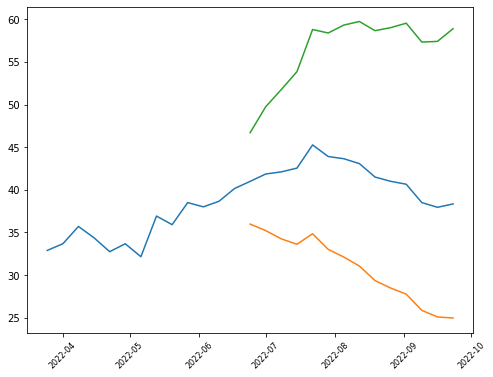

['options', ('2022-07-15', '2023-01-20', '2024-01-19')]
symbol: HRB
sector: Consumer Cyclical
Index: SP400
vol_30d_2yr: 54249330.46875
Sector 1YMF: 9.64000129699707
1YMF: 9.64000129699707
risk trend factor: 0.73141120475963
         beta currentRatio debtToEquity dividendRate dividendYield  \
HRB  0.695099        1.103     5314.905         1.08        0.0327   

    earningsGrowth     ebitda ebitdaMargins forwardPE grossMargins  \
HRB         -0.008  806428032       0.30238  8.967391        0.472   

    grossProfits heldPercentInstitutions           industry   marketCap  \
HRB   1400058000                 0.93136  Personal Services  5266601984   

    operatingCashflow operatingMargins payoutRatio pegRatio priceToBook  \
HRB          80728000          0.25066      0.3344     0.99   117.43773   

    priceToSalesTrailing12Months profitMargins quickRatio revenueGrowth  \
HRB                      1.97476       0.16063      0.971         0.039   

    revenuePerShare             sector sh

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,33.0,32.411108,34.624444,36.837781,29.692222,4.042801,21.60662,37.777824


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
HRB,0.963511,33.0,54249330.46875,0.83894,0.727369,0.435637


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -359.96002197265625
Sector Volume Factor: 1.2928194874233667
Sector Risk Trend Factor: -4.72140697901556
Index 1YMF: -69.05999755859375
Index Volume Factor: 0.5765983741853883
Index Risk Trend Factor: -5.134573474205833


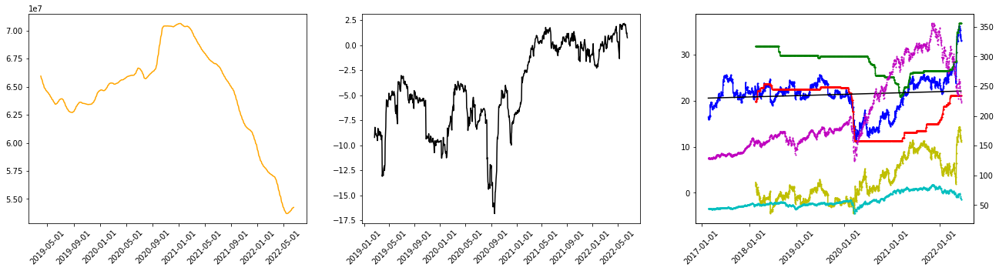

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'mul', False]
best inner cv score, sdev (11 folds): 6.864336558336649 6.361525597489048
test cv mean error, stdev (10 folds): 7.2923108715859275 6.519291756252031
sell date: 2022-08-26
expected return: 0.06514875311312678
discounted return: 0.0009151208401509958
quarter return: 1.0877948985018


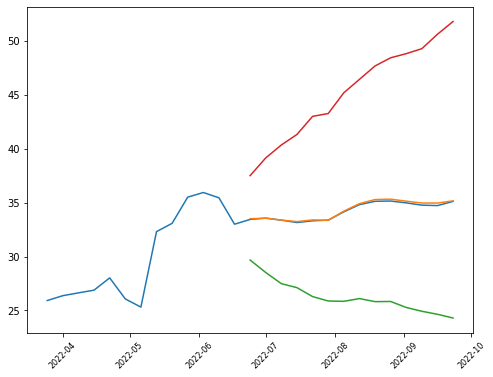

['options', ('2022-07-15', '2023-01-20', '2024-01-19')]
symbol: AZPN
sector: Technology
Index: SP400
vol_30d_2yr: 9413646.875
Sector 1YMF: 44.3599853515625
1YMF: 44.3599853515625
risk trend factor: 0.7193120754472356
     currentRatio debtToEquity earningsGrowth    ebitda ebitdaMargins  \
AZPN        1.176       40.561          0.231  27337000       0.08523   

      forwardPE grossMargins grossProfits heldPercentInstitutions  \
AZPN  34.490196      0.46746    137630000                 1.03086   

                  industry    marketCap operatingCashflow operatingMargins  \
AZPN  Software—Application  12029022208          45755000         -0.08421   

     payoutRatio pegRatio priceToBook priceToSalesTrailing12Months  \
AZPN           0     4.59   16.632854                    37.503967   

     profitMargins quickRatio revenueGrowth revenuePerShare      sector  \
AZPN      -0.07406      1.116         0.154           4.811  Technology   

     sharesOutstanding shortRatio  totalCash tot

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,189.199997,179.517829,194.02619,208.534551,172.712063,17.04983,138.612402,206.811723


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
AZPN,0.677612,189.199997,9413646.875,0.817172,0.799656,0.381343


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -363.4599914550781
Sector Volume Factor: 1.1528457613891094
Sector Risk Trend Factor: -4.954471974241429
Index 1YMF: -69.05999755859375
Index Volume Factor: 0.5765983741853883
Index Risk Trend Factor: -5.134573474205833


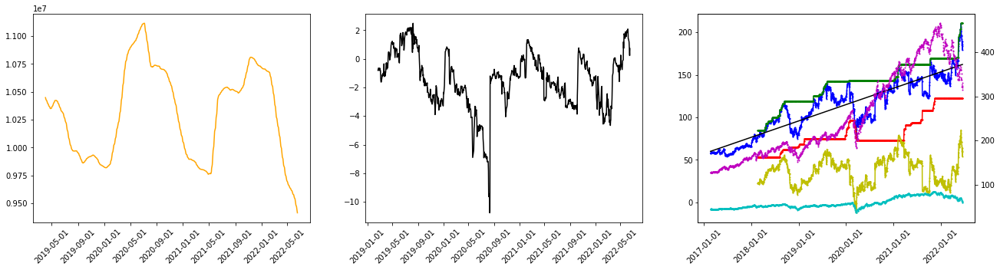

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: [None, 'mul', False]
best inner cv score, sdev (11 folds): 489.454013865896 509.74593432044645
test cv mean error, stdev (10 folds): 536.2813274769147 511.57059288027745
sell date: 2022-09-23
expected return: 0.06468623197866812
discounted return: 0.000646395812373024
quarter return: 1.0612518511466449


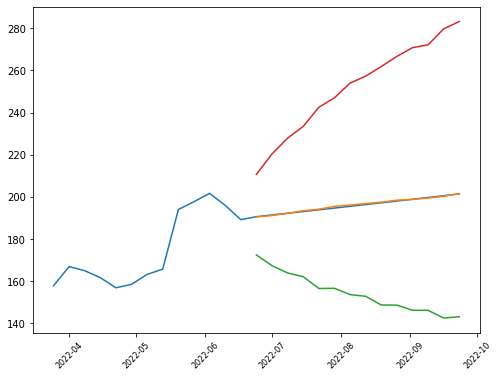

['options', ('2022-07-15', '2022-12-16')]
symbol: CEIX
sector: Energy
Index: SP600
vol_30d_2yr: 10292389.84375
Sector 1YMF: 13.870006561279297
1YMF: 13.870006561279297
risk trend factor: 0.677246429262603
          beta currentRatio debtToEquity     ebitda ebitdaMargins forwardPE  \
CEIX  2.034072        0.842       95.981  241890000       0.16404  2.585434   

     freeCashflow grossMargins grossProfits heldPercentInstitutions  \
CEIX    252373632       0.3951    422536000                 0.82577   

          industry   marketCap operatingCashflow operatingMargins payoutRatio  \
CEIX  Thermal Coal  1606689280         375780000          0.01441           0   

     priceToBook priceToSalesTrailing12Months profitMargins quickRatio  \
CEIX    2.403771                     1.089613       0.00221      0.658   

     returnOnAssets returnOnEquity revenueGrowth revenuePerShare  sector  \
CEIX        0.00507         0.0052         0.616          42.718  Energy   

     sharesOutstanding short

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,46.150002,47.268535,52.341873,57.415211,46.69127,6.413974,33.863321,59.519218


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
CEIX,1.548727,46.150002,10292389.84375,0.762563,0.855686,0.521917


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


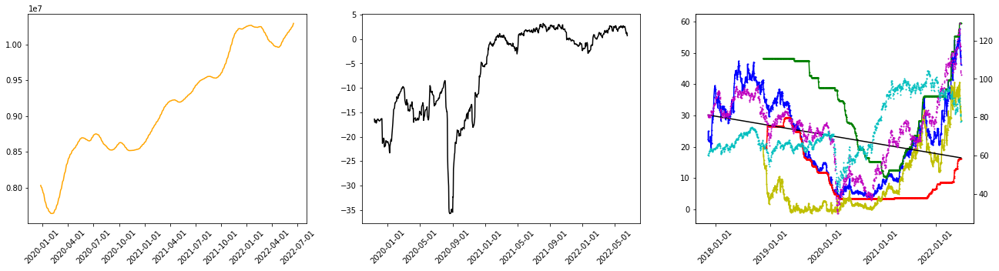

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', 'add', False]
best inner cv score, sdev (11 folds): 36.22631654903543 60.302806177252826
test cv mean error, stdev (10 folds): 36.22631680755455 60.30280614072491
sell date: 2022-09-16
expected return: 0.7036936565173771
discounted return: 0.005937542553579478
quarter return: 1.7239852264024262


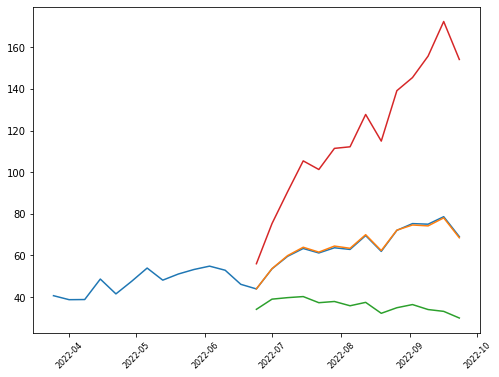

['options', ('2022-08-19',)]
symbol: PSB
sector: error
sector: error
Index: SP400
vol_30d_2yr: 2723370.8984375
Sector 1YMF: 12.849990844726562
1YMF: 12.849990844726562
risk trend factor: 0.576750069513787
Empty DataFrame
Columns: []
Index: [PSB]


,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,185.919998,185.696223,186.664367,187.632511,178.031091,10.476157,157.078776,198.983405


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
PSB,2.540601,185.919998,2723370.898438,0.951471,0.840486,0.47672


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Index 1YMF: -69.05999755859375
Index Volume Factor: 0.5765983741853883
Index Risk Trend Factor: -5.134573474205833


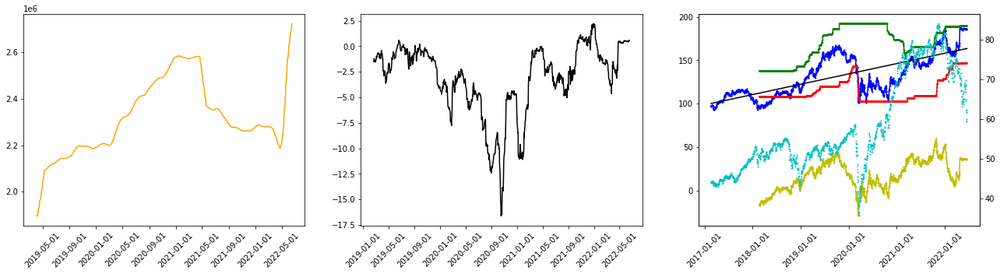

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: [None, None]
best inner cv score, sdev (11 folds): 369.7292384773061 494.7603840645874
test cv mean error, stdev (10 folds): 405.85316500636833 504.8884061424503
sell date: 2022-06-24
expected return: 0.0002559406349787676
discounted return: 4.265222420718473e-05
quarter return: 1.0039316296028944


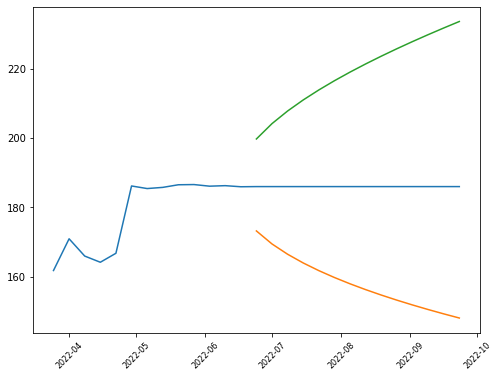

symbol: MCK
sector: Healthcare
Index: SP500
vol_30d_2yr: 22868822.0703125
Sector 1YMF: 23.670013427734375
1YMF: 23.670013427734375
risk trend factor: 0.5738185073390152
         beta currentRatio dividendRate dividendYield      ebitda  \
MCK  0.716666         0.98         1.88        0.0058  3516999936   

    ebitdaMargins  forwardPE freeCashflow grossMargins grossProfits  \
MCK       0.01368  13.643667   2778374912       0.0503  11967000000   

    heldPercentInstitutions              industry    marketCap  \
MCK                   0.898  Medical Distribution  45891629056   

    operatingCashflow operatingMargins payoutRatio pegRatio  \
MCK        4917000192           0.0105      0.2521     1.05   

    priceToSalesTrailing12Months profitMargins quickRatio returnOnAssets  \
MCK                     0.178562       0.00549      0.445        0.02686   

    returnOnEquity revenueGrowth revenuePerShare      sector  \
MCK       14.01754         0.096        1655.966  Healthcare   

    sha

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,300.570007,299.443248,318.421081,337.398913,317.445859,10.066372,297.313115,337.578604


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
MCK,1.048139,300.570007,22868822.070312,0.803327,0.997242,0.461301


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -122.20997619628906
Sector Volume Factor: 1.2238851152317325
Sector Risk Trend Factor: -3.3236323632363236
Index 1YMF: -287.8400573730469
Index Volume Factor: 1.1835166983613057
Index Risk Trend Factor: -3.791860877423899


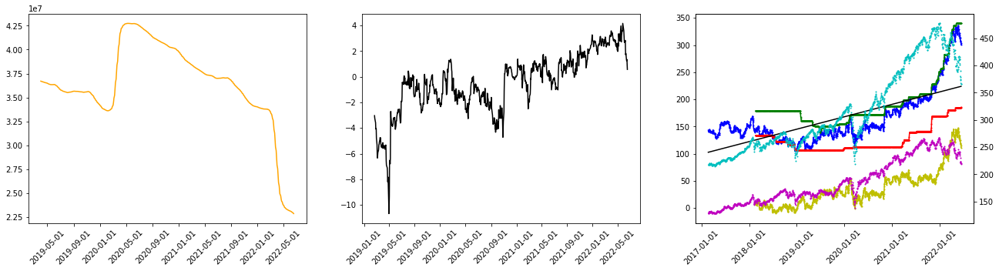

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', 'add', False]
best inner cv score, sdev (11 folds): 416.29612841155847 356.83690726109813
test cv mean error, stdev (10 folds): 436.74556789463134 368.05695025775367
sell date: 2022-09-16
expected return: 0.07985210210346133
discounted return: 0.000853965412807689
quarter return: 1.081697202285379


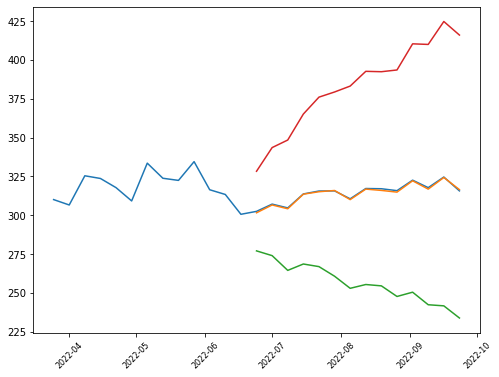

['quarterly_balance_sheet',                              2021-12-31    2021-09-30    2021-06-30  \
Intangible Assets          2.130000e+09  2.385000e+09  2.797000e+09   
Capital Surplus            7.411000e+09  7.311000e+09  7.057000e+09   
Total Liab                 6.449500e+10  6.368800e+10  6.293200e+10   
Total Stockholder Equity  -1.274000e+09 -5.710000e+08 -5.290000e+08   
Minority Interest          4.870000e+08  4.840000e+08  4.910000e+08   
Other Current Liab         5.975000e+09  3.504000e+09  6.850000e+08   
Total Assets               6.370800e+10  6.360100e+10  6.289400e+10   
Common Stock               2.000000e+06  2.000000e+06  2.000000e+06   
Other Current Assets       5.940000e+09  3.470000e+09  1.230000e+08   
Retained Earnings          8.734000e+09  8.812000e+09  8.618000e+09   
Other Liab                 1.007600e+10  9.988000e+09  1.065700e+10   
Good Will                  9.462000e+09  9.473000e+09  9.520000e+09   
Treasury Stock            -1.742100e+10 -1.669600

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,30.93,30.835356,31.038381,31.241406,31.187778,0.232375,30.723027,31.652528


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
GCP,1.87078,30.93,8243886.328125,0.913628,0.155232,0.442804


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


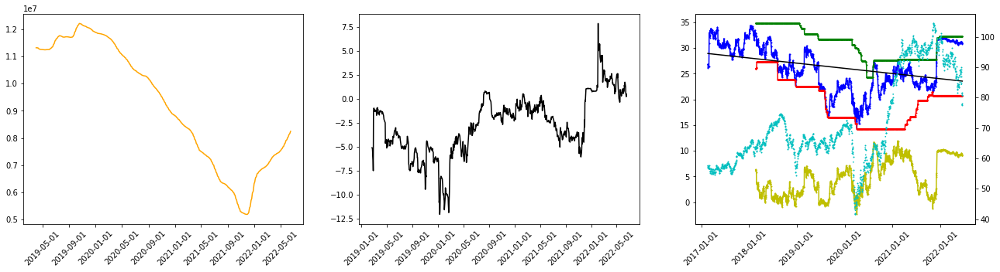

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', 'mul', False]
best inner cv score, sdev (11 folds): 8.24007593643425 9.316800374474898
test cv mean error, stdev (10 folds): 8.753590751571059 9.621973498794299
sell date: 2022-09-09
expected return: 0.03288150330289676
discounted return: 0.00038986480080027697
quarter return: 1.0365113174464204


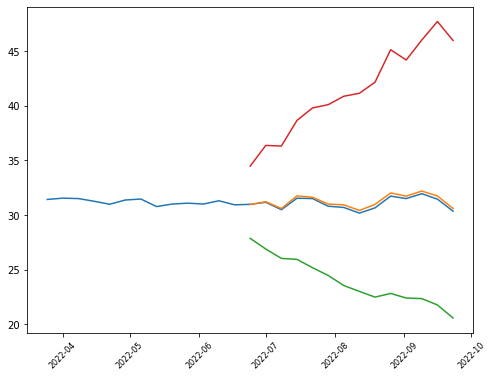

['options', ('2022-08-19', '2022-12-16')]
symbol: WRB
sector: Financial Services
Index: SP500
vol_30d_2yr: 24741280.6640625
Sector 1YMF: 2.7066688537597656
1YMF: 2.7066688537597656
risk trend factor: 0.37488481940951457
         beta currentRatio debtToEquity dividendRate dividendYield  \
WRB  0.741517        0.453       44.413         0.35        0.0049   

    earningsGrowth      ebitda ebitdaMargins  forwardPE freeCashflow  \
WRB          1.585  1969144064       0.19279  15.017057   2491864832   

    grossMargins grossProfits heldPercentInstitutions  \
WRB      0.44661   4029355000                 0.69611   

                          industry    marketCap operatingCashflow  \
WRB  Insurance—Property & Casualty  18677542912        2350679040   

    operatingMargins payoutRatio pegRatio priceToBook  \
WRB          0.18096        0.07     1.94    2.720776   

    priceToSalesTrailing12Months profitMargins quickRatio returnOnAssets  \
WRB                     1.828621       0.13546   

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,66.82,65.019435,68.896032,72.772628,67.946191,1.725853,64.494485,71.397896


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
WRB,1.220256,66.82,24741280.664062,0.845794,0.942554,0.452599


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -72.2699966430664
Sector Volume Factor: 1.2707168073107045
Sector Risk Trend Factor: -4.617890709055871
Index 1YMF: -287.8400573730469
Index Volume Factor: 1.1835166983613057
Index Risk Trend Factor: -3.791860877423899


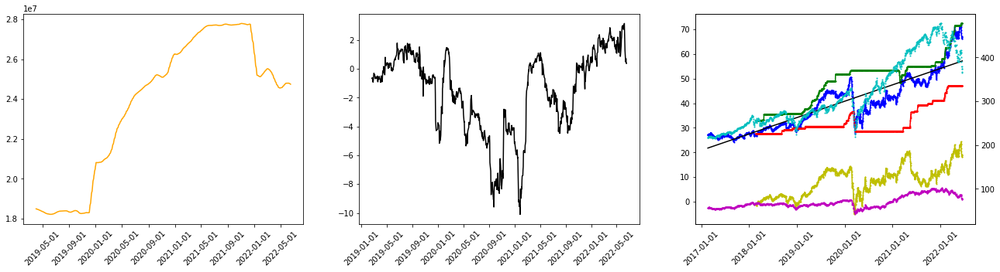

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', 'add', True]
best inner cv score, sdev (11 folds): 34.12905588548999 62.70947455214477
test cv mean error, stdev (10 folds): 37.07787258818386 65.03903145015686
sell date: 2022-07-15
expected return: 0.049542609100456374
discounted return: 0.001792510514275314
quarter return: 1.1791140381877312


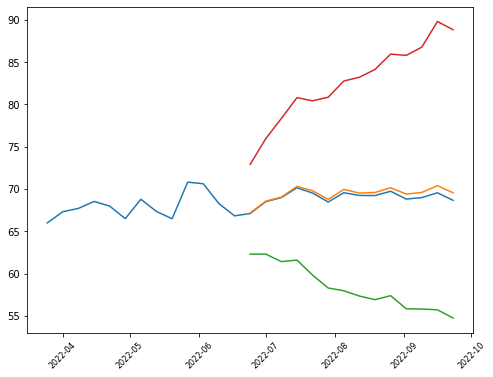

['options', ('2022-07-15',)]
['sustainability',                            Value
2022-5                          
palmOil                    False
controversialWeapons       False
gambling                   False
socialScore                 7.83
nuclear                    False
furLeather                 False
alcoholic                  False
gmo                        False
catholic                   False
socialPercentile            None
peerCount                     96
governanceScore            12.16
environmentPercentile       None
animalTesting              False
tobacco                    False
totalEsg                   21.95
highestControversy             1
esgPerformance          AVG_PERF
coal                       False
pesticides                 False
adult                      False
percentile                 31.22
peerGroup              Insurance
smallArms                  False
environmentScore            1.95
governancePercentile        None
militaryContract           F

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,164.020004,159.077845,165.278412,171.47898,162.282857,5.027495,152.227867,172.337847


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
FCN,0.694756,164.020004,6853053.320312,0.888589,0.922824,0.404937


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Index 1YMF: -69.05999755859375
Index Volume Factor: 0.5765983741853883
Index Risk Trend Factor: -5.134573474205833


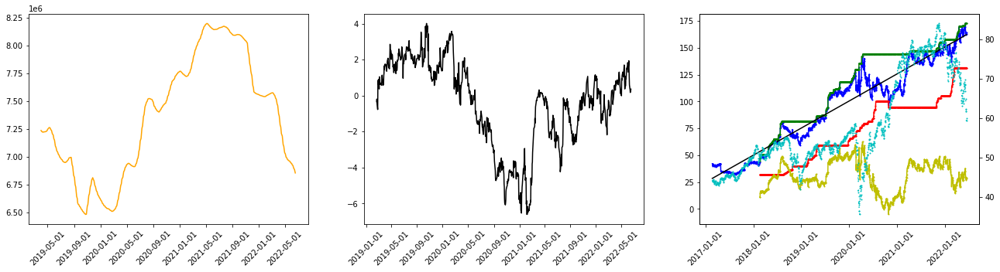

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', 'add', True]
best inner cv score, sdev (11 folds): 113.70674145487628 46.52872208500513
test cv mean error, stdev (10 folds): 109.63912895990282 46.89790816448097
sell date: 2022-09-02
expected return: 0.1364131271629469
discounted return: 0.001684007435712731
quarter return: 1.1674225614352378


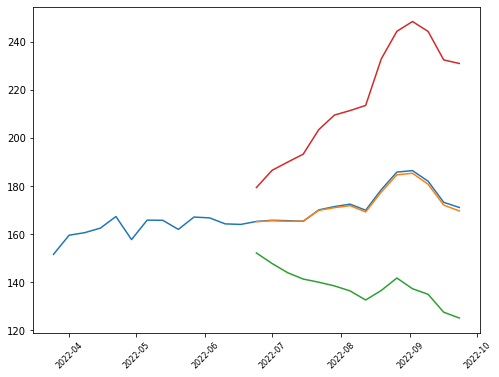

symbol: XOM
sector: Energy
Index: SP500
vol_30d_2yr: 552640281.25
Sector 1YMF: 9.1300048828125
1YMF: 9.1300048828125
risk trend factor: 0.34741268291096833
         beta currentRatio debtToEquity dividendRate dividendYield  \
XOM  1.040834        1.072       26.929         3.52        0.0409   

    earningsGrowth       ebitda ebitdaMargins forwardPE freeCashflow  \
XOM          1.003  53895000064       0.17427  9.558269  31484874752   

    grossMargins grossProfits heldPercentInstitutions              industry  \
XOM      0.31806  90045000000                 0.56863  Oil & Gas Integrated   

        marketCap operatingCashflow operatingMargins payoutRatio pegRatio  \
XOM  362840784896       53653000192          0.10859      0.5804     0.32   

    priceToBook priceToSalesTrailing12Months profitMargins quickRatio  \
XOM    2.143942                     1.173221       0.08339      0.739   

    returnOnAssets returnOnEquity revenueGrowth revenuePerShare  sector  \
XOM        0.06097    

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,86.120003,88.433461,96.553809,104.674158,88.917204,6.448671,76.019861,101.814547


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
XOM,1.153813,86.120003,552640281.25,0.738786,0.784328,0.530974


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -287.8400573730469
Index Volume Factor: 1.1835166983613057
Index Risk Trend Factor: -3.791860877423899


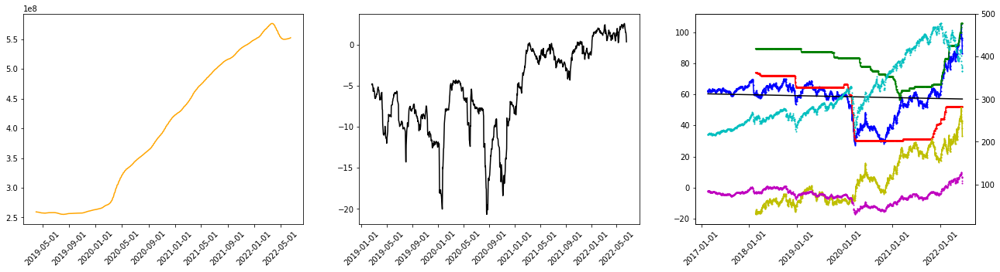

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', 'mul', True]
best inner cv score, sdev (11 folds): 135.34503845255395 164.1915316416947
test cv mean error, stdev (10 folds): 148.3675395927328 166.70199015093507
sell date: 2022-09-23
expected return: 0.10644560071069155
discounted return: 0.0010433554212150309
quarter return: 1.1006915437325049


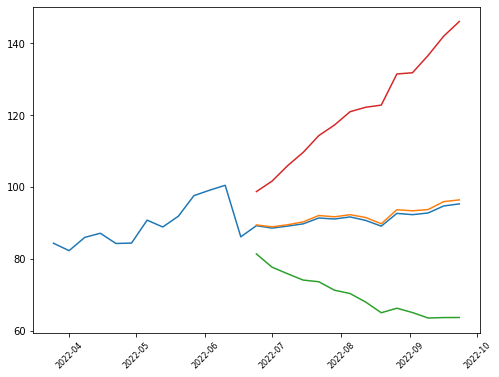

['options', ('2022-07-15', '2023-01-20', '2024-01-19', '2026-02-21')]
['sustainability',                                      Value
2022-5                                    
palmOil                              False
controversialWeapons                 False
gambling                             False
socialScore                           9.82
nuclear                              False
furLeather                           False
alcoholic                            False
gmo                                  False
catholic                             False
socialPercentile                      None
peerCount                               66
governanceScore                       8.14
environmentPercentile                 None
animalTesting                         True
tobacco                              False
totalEsg                             36.46
highestControversy                       3
esgPerformance                    OUT_PERF
coal                                 False
pesticid

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,94.790001,94.21236,94.956032,95.699705,88.233333,5.546632,77.140069,99.326598


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
MANT,2.782348,94.790001,4428022.265625,0.833671,0.571232,0.363702


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -363.4599914550781
Sector Volume Factor: 1.1528457613891094
Sector Risk Trend Factor: -4.954471974241429
Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


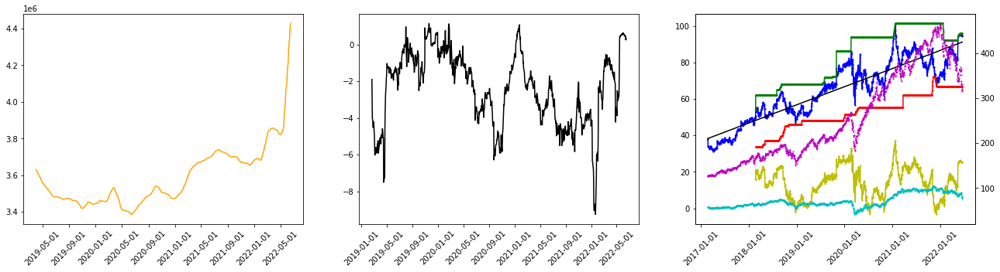

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: [None, None]
best inner cv score, sdev (11 folds): 79.08238413212514 56.43302789094877
test cv mean error, stdev (10 folds): 75.67081892433727 58.09585830158451
sell date: 2022-06-24
expected return: -0.0001107076330911617
discounted return: -1.8452123363044137e-05
quarter return: 0.9983038291148213


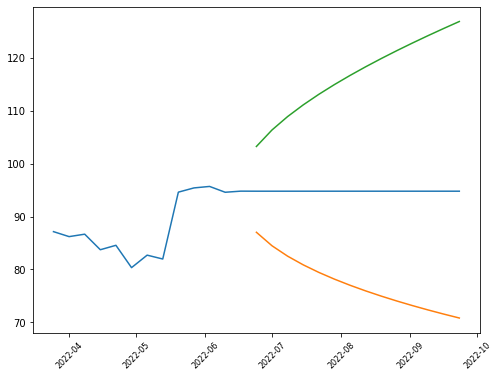

['options', ('2022-08-19',)]
symbol: SM
sector: Energy
Index: SP600
vol_30d_2yr: 85332599.609375
Sector 1YMF: 6.969999313354492
1YMF: 6.969999313354492
risk trend factor: 0.3050327621527311
        beta currentRatio debtToEquity dividendRate dividendYield      ebitda  \
SM  5.488235        0.717       93.916         0.02        0.0006  1315937024   

   ebitdaMargins forwardPE freeCashflow grossMargins grossProfits  \
SM       0.45427  8.413136    570353344       0.8671   2136878000   

   heldPercentInstitutions       industry   marketCap operatingCashflow  \
SM                 0.88028  Oil & Gas E&P  4823732224        1396240000   

   operatingMargins payoutRatio pegRatio priceToBook  \
SM          0.18012       0.007     0.12    2.946938   

   priceToSalesTrailing12Months profitMargins quickRatio returnOnAssets  \
SM                      1.66518       0.11608        0.7        0.06264   

   returnOnEquity revenueGrowth revenuePerShare  sector sharesOutstanding  \
SM        0.1731

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,39.709999,36.543497,46.618254,56.693011,41.080159,5.405133,30.269893,51.890424


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
SM,0.640686,39.709999,85332599.609375,0.715458,0.803847,0.471215


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


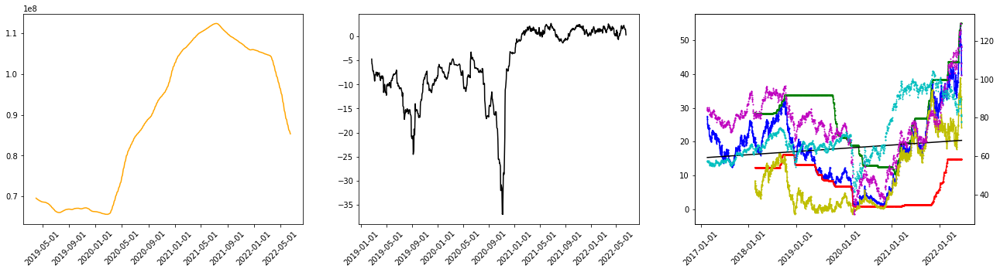

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', 'mul', True]
best inner cv score, sdev (11 folds): 38.188574153717546 45.77804828171256
test cv mean error, stdev (10 folds): 41.84793318398103 46.45312350427326
sell date: 2022-09-16
expected return: 1.833752341458087
discounted return: 0.011640583124967963
quarter return: 2.9001093832715084


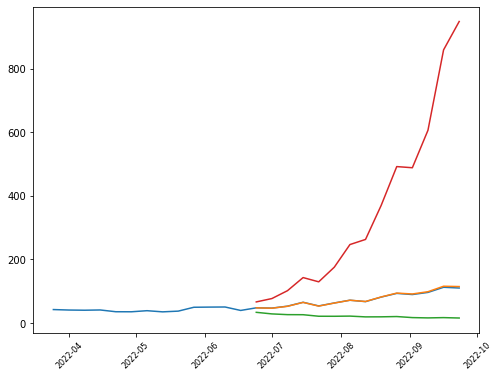

['quarterly_balance_sheet',                              2022-03-31    2021-12-31    2021-09-30  \
Capital Surplus            1.844478e+09  1.840228e+09  1.838620e+09   
Total Liab                 3.280672e+09  3.170846e+09  3.425061e+09   
Total Stockholder Equity   2.115109e+09  2.063131e+09  1.636899e+09   
Deferred Long Term Liab    2.300000e+06  2.700000e+06  3.100000e+06   
Other Current Liab         5.381270e+08  4.047460e+08  5.520440e+08   
Total Assets               5.395781e+09  5.233977e+09  5.061960e+09   
Common Stock               1.219000e+06  1.219000e+06  1.215000e+06   
Other Current Assets       9.649000e+06  2.409500e+07  2.451400e+07   
Retained Earnings          2.820790e+08  2.345330e+08 -1.903670e+08   
Other Liab                 2.415590e+08  1.809150e+08  2.438640e+08   
Treasury Stock            -1.266700e+07 -1.284900e+07 -1.256900e+07   
Other Assets               5.397300e+07  2.576600e+07  6.020700e+07   
Cash                       4.198870e+08  3.327160

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,45.0,43.432974,51.035714,58.638454,43.785397,6.19363,31.398138,56.172656


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
DINO,1.094012,45.0,51433534.179688,0.676181,0.488602,0.560442


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -69.05999755859375
Index Volume Factor: 0.5765983741853883
Index Risk Trend Factor: -5.134573474205833


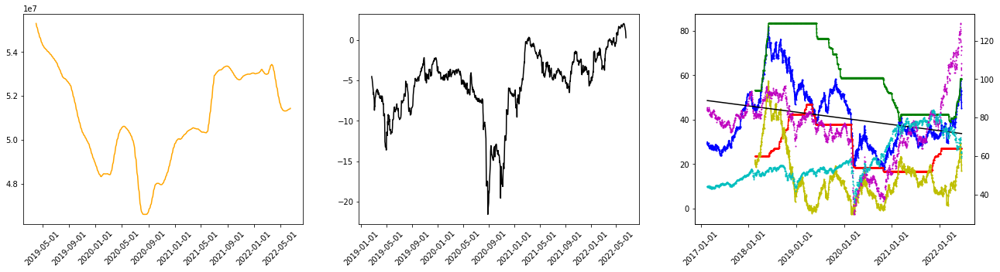

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'add', False]
best inner cv score, sdev (11 folds): 70.25982731235483 77.80841854652951
test cv mean error, stdev (10 folds): 75.88424312064323 79.44551851019251
sell date: 2022-09-23
expected return: 0.08411619645637987
discounted return: 0.0008329765218499929
quarter return: 1.0796122410781488


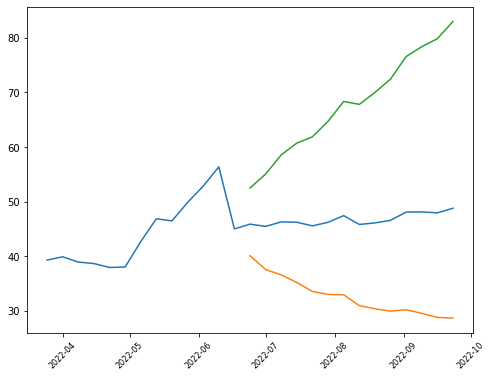

symbol: PLAB
sector: Technology
Index: SP600
vol_30d_2yr: 10786618.9453125
Sector 1YMF: 2.2899999618530273
1YMF: 2.2899999618530273
risk trend factor: 0.26412914530661946
          beta currentRatio debtToEquity earningsGrowth     ebitda  \
PLAB  0.980357        3.417        7.842          1.889  233440992   

     ebitdaMargins  forwardPE freeCashflow grossMargins grossProfits  \
PLAB       0.31281  10.108109     90646496      0.30828    167044000   

     heldPercentInstitutions                             industry   marketCap  \
PLAB                 0.90554  Semiconductor Equipment & Materials  1385207808   

     operatingCashflow operatingMargins payoutRatio pegRatio priceToBook  \
PLAB         195842000          0.19934           0     1.19     1.62538   

     priceToSalesTrailing12Months profitMargins quickRatio returnOnAssets  \
PLAB                     1.856183       0.12032      2.814        0.07156   

     returnOnEquity revenueGrowth revenuePerShare      sector  \
PLAB   

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,19.15,14.678059,19.802381,24.926703,17.249841,2.549321,12.151199,22.348483


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
PLAB,2.163783,19.15,10786618.945312,0.729861,0.736899,0.332818


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -363.4599914550781
Sector Volume Factor: 1.1528457613891094
Sector Risk Trend Factor: -4.954471974241429
Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


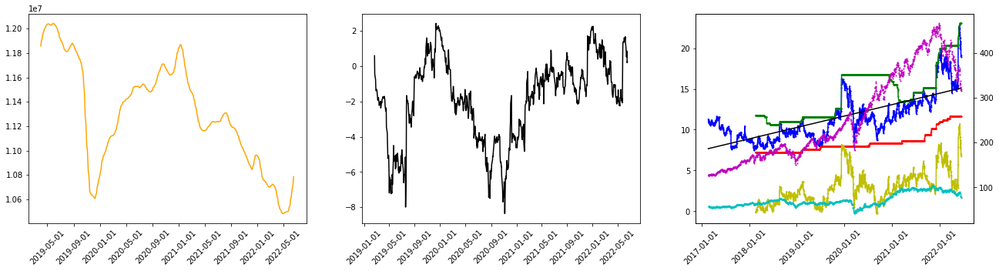

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'add', False]
best inner cv score, sdev (11 folds): 4.5674735160682465 5.146782235909608
test cv mean error, stdev (10 folds): 4.2931597086211815 5.320767742517799
sell date: 2022-08-26
expected return: 0.020160538588419565
discounted return: 0.000289317288879154
quarter return: 1.0269706384550663


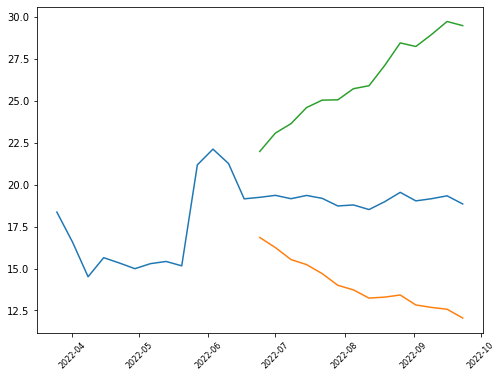

['options', ('2022-12-16',)]
symbol: MPC
sector: Energy
Index: SP500
vol_30d_2yr: 141817662.109375
Sector 1YMF: 6.860008239746094
1YMF: 6.860008239746094
risk trend factor: 0.20927420668724137
        beta currentRatio debtToEquity dividendRate dividendYield      ebitda  \
MPC  1.75499        1.449       89.568         2.32        0.0266  8572000256   

    ebitdaMargins  forwardPE freeCashflow grossMargins grossProfits  \
MPC       0.06306  11.191026  18097874944      0.08778  10443000000   

    heldPercentInstitutions                        industry    marketCap  \
MPC                 0.79745  Oil & Gas Refining & Marketing  47223455744   

    operatingCashflow operatingMargins payoutRatio pegRatio priceToBook  \
MPC        6418999808           0.0386      0.5472     0.35     1.98454   

    priceToSalesTrailing12Months profitMargins quickRatio returnOnAssets  \
MPC                     0.347428       0.07964      1.045        0.03693   

    returnOnEquity revenueGrowth revenuePerS

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,87.290001,89.493723,102.090159,114.686595,92.392331,8.807067,74.778196,110.006465


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
MPC,1.221452,87.290001,141817662.109375,0.691764,0.549549,0.514371


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -287.8400573730469
Index Volume Factor: 1.1835166983613057
Index Risk Trend Factor: -3.791860877423899


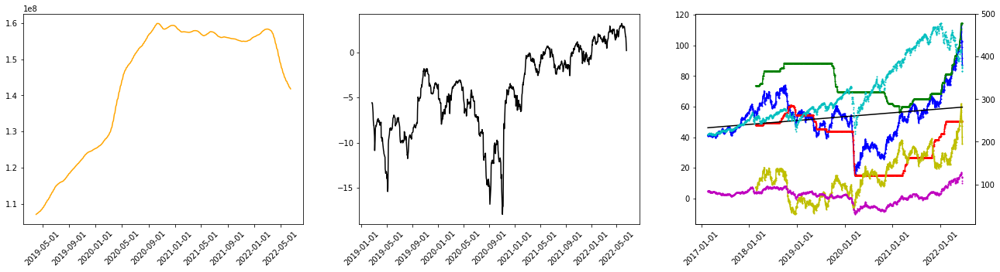

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', 'mul', True]
best inner cv score, sdev (11 folds): 143.4033886365892 157.92853524383602
test cv mean error, stdev (10 folds): 150.6730426711074 163.87263656740802
sell date: 2022-06-24
expected return: 0.012946334184793143
discounted return: 0.0021461742004171835
quarter return: 1.2180320105399547


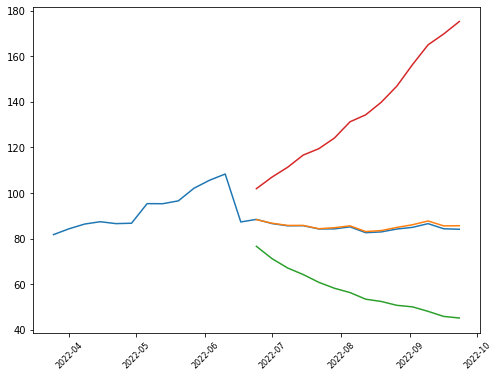

['options', ('2022-07-15', '2022-09-16', '2023-01-20', '2024-01-19')]
['sustainability',                                       Value
2022-5                                     
palmOil                               False
controversialWeapons                  False
gambling                              False
socialScore                            7.01
nuclear                               False
furLeather                            False
alcoholic                             False
gmo                                   False
catholic                              False
socialPercentile                       None
peerCount                                39
governanceScore                        5.87
environmentPercentile                  None
animalTesting                         False
tobacco                               False
totalEsg                              28.78
highestControversy                        3
esgPerformance                     AVG_PERF
coal                           

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,290.899994,284.096885,302.232381,320.367877,296.315556,9.524706,277.266144,315.364968


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
LLY,0.967658,290.899994,70977344.335938,0.829733,0.979741,0.407173


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -122.20997619628906
Sector Volume Factor: 1.2238851152317325
Sector Risk Trend Factor: -3.3236323632363236
Index 1YMF: -287.8400573730469
Index Volume Factor: 1.1835166983613057
Index Risk Trend Factor: -3.791860877423899


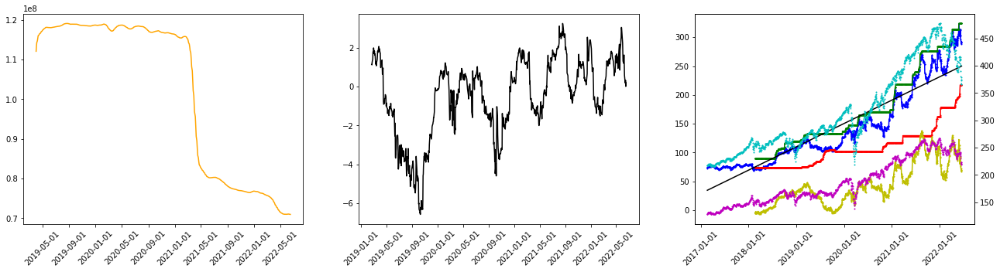

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'add', False]
best inner cv score, sdev (11 folds): 404.300468795574 288.1892634819623
test cv mean error, stdev (10 folds): 433.70233236467357 286.09339973931145
sell date: 2022-09-02
expected return: 0.13279535875519005
discounted return: 0.0016419827219595895
quarter return: 1.1629251651523083


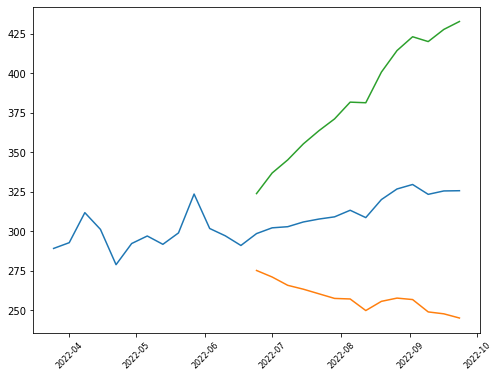

['quarterly_balance_sheet',                                     2022-03-31    2021-12-31    2021-09-30  \
Intangible Assets                 7.482400e+09  7.691900e+09  7.887700e+09   
Capital Surplus                   6.656300e+09  6.833400e+09  6.758000e+09   
Total Liab                        3.745730e+10  3.965120e+10  4.023290e+10   
Total Stockholder Equity          9.330800e+09  8.979200e+09  7.757000e+09   
Minority Interest                 1.312000e+08  1.756000e+08  1.971000e+08   
Other Current Liab                3.135000e+09  3.814100e+09  2.513000e+09   
Total Assets                      4.691930e+10  4.880600e+10  4.818700e+10   
Common Stock                      5.941000e+08  5.963000e+08  5.982000e+08   
Other Current Assets              3.880000e+07  9.900000e+06  5.500000e+06   
Retained Earnings                 9.369400e+09  8.958500e+09  9.639400e+09   
Other Liab                        8.875200e+09  8.674200e+09  1.099380e+10   
Good Will                         3.

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,112.440002,114.972524,130.979841,146.987158,116.34127,14.566462,87.208346,145.474193


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
VLO,1.3872,112.440002,90552079.101562,0.691389,0.569718,0.530999


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -287.8400573730469
Index Volume Factor: 1.1835166983613057
Index Risk Trend Factor: -3.791860877423899


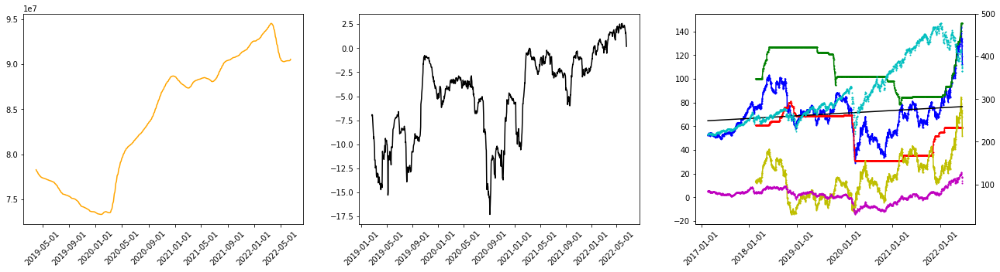

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'add', False]
best inner cv score, sdev (11 folds): 317.1519136674356 364.5895840215621
test cv mean error, stdev (10 folds): 348.46648405824834 368.0112236822125
sell date: 2022-09-23
expected return: 0.1830403392601269
discounted return: 0.001734364991082149
quarter return: 1.1728343844214058


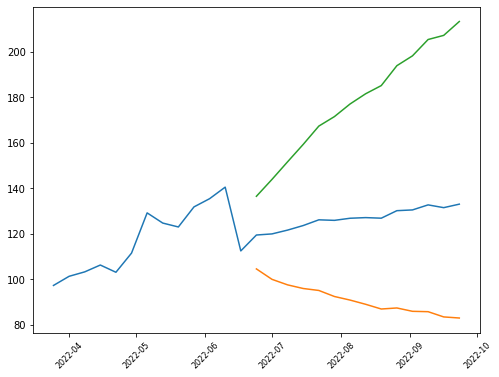

['options', ('2023-01-20', '2024-01-19')]
['sustainability',                                       Value
2022-5                                     
palmOil                               False
controversialWeapons                  False
gambling                              False
socialScore                            7.23
nuclear                               False
furLeather                            False
alcoholic                             False
gmo                                   False
catholic                              False
socialPercentile                       None
peerCount                                39
governanceScore                        4.98
environmentPercentile                  None
animalTesting                         False
tobacco                               False
totalEsg                              30.94
highestControversy                        3
esgPerformance                     OUT_PERF
coal                                  False
pesticides     

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,39.220001,39.703868,46.051746,52.399625,42.946032,3.294685,36.356662,49.535402


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
APA,0.999608,39.220001,204531248.4375,0.713933,0.302651,0.445144


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -287.8400573730469
Index Volume Factor: 1.1835166983613057
Index Risk Trend Factor: -3.791860877423899


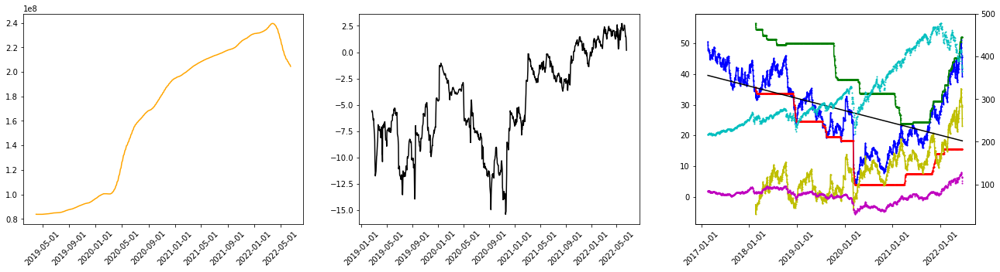

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'mul', True]
best inner cv score, sdev (11 folds): 47.195178427734554 46.896895021789376
test cv mean error, stdev (10 folds): 51.47031681916078 47.09783220586969
sell date: 2022-07-15
expected return: 0.07803719469902784
discounted return: 0.002786912363174965
quarter return: 1.2918035249477826


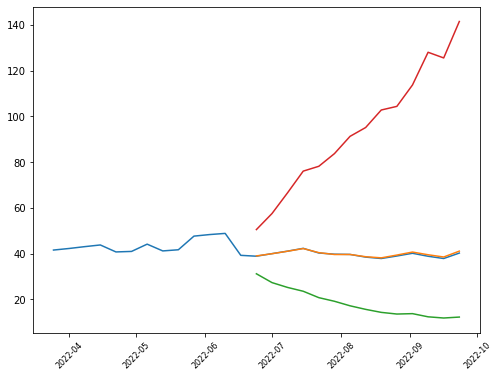

['quarterly_balance_sheet',                                     2021-12-31    2021-09-30    2021-06-30  \
Capital Surplus                   1.164500e+10  1.168600e+10  1.170400e+10   
Total Liab                        1.330800e+10  1.270500e+10  1.281900e+10   
Total Stockholder Equity         -1.595000e+09 -1.095000e+09 -9.640000e+08   
Minority Interest                 1.590000e+09  1.580000e+09  1.657000e+09   
Deferred Long Term Liab           5.700000e+08  5.150000e+08  5.120000e+08   
Other Current Liab                3.370000e+08  2.760000e+08  2.990000e+08   
Total Assets                      1.330300e+10  1.331000e+10  1.351200e+10   
Common Stock                      2.620000e+08  2.620000e+08  2.620000e+08   
Other Current Assets              1.550000e+08  1.020000e+08  7.600000e+07   
Retained Earnings                -9.488000e+09 -9.870000e+09 -9.757000e+09   
Other Liab                        3.744000e+09  3.673000e+09  2.626000e+09   
Treasury Stock                   -4.

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,29.34,28.165931,31.419048,34.672164,28.426667,2.86898,22.688707,34.164626


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
PPC,1.275425,29.34,17241312.5,0.741748,0.282386,0.556574


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -74.80001831054688
Sector Volume Factor: 1.4135920452708397
Sector Risk Trend Factor: -2.283970024749523
Index 1YMF: -69.05999755859375
Index Volume Factor: 0.5765983741853883
Index Risk Trend Factor: -5.134573474205833


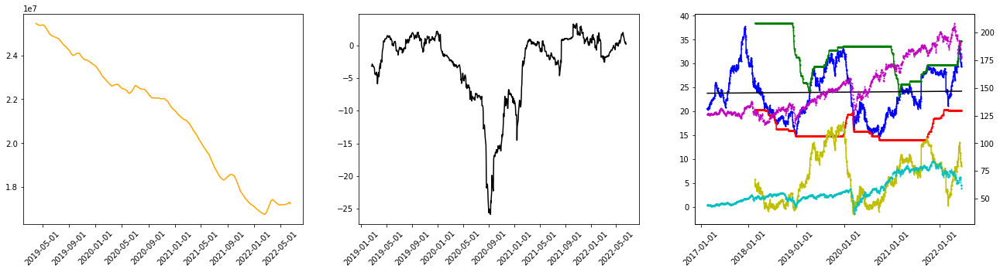

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'add', False]
best inner cv score, sdev (11 folds): 26.767895755767032 40.45510267955412
test cv mean error, stdev (10 folds): 28.55364084597685 42.01427297956826
sell date: 2022-08-12
expected return: 0.07198653654402982
discounted return: 0.0012646809148548765
quarter return: 1.1233071343863057


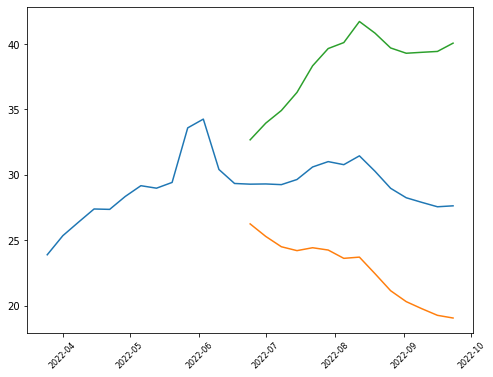

['quarterly_balance_sheet',                                     2022-03-27    2021-12-26    2021-09-26  \
Intangible Assets                 9.385640e+08  9.632430e+08  1.028664e+09   
Capital Surplus                   1.966066e+09  1.964028e+09  1.962750e+09   
Total Liab                        6.524261e+09  6.324271e+09  6.216460e+09   
Total Stockholder Equity          2.781630e+09  2.577080e+09  2.604243e+09   
Minority Interest                 1.197600e+07  1.185400e+07  1.214000e+07   
Other Current Liab                3.009220e+08  3.085060e+08  4.109530e+08   
Total Assets                      9.317867e+09  8.913205e+09  8.832843e+09   
Common Stock                      2.616000e+06  2.614000e+06  2.614000e+06   
Other Current Assets              6.858900e+07  4.054500e+07  6.656900e+07   
Retained Earnings                 1.284007e+09  1.003569e+09  9.668150e+08   
Other Liab                        4.077630e+08  4.709210e+08  5.265940e+08   
Good Will                         1.

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,24.15,25.128986,29.471905,33.814823,26.957624,2.372893,22.211838,31.70341


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
MRO,1.000459,24.15,490057840.234375,0.691969,0.80545,0.53536


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -287.8400573730469
Index Volume Factor: 1.1835166983613057
Index Risk Trend Factor: -3.791860877423899


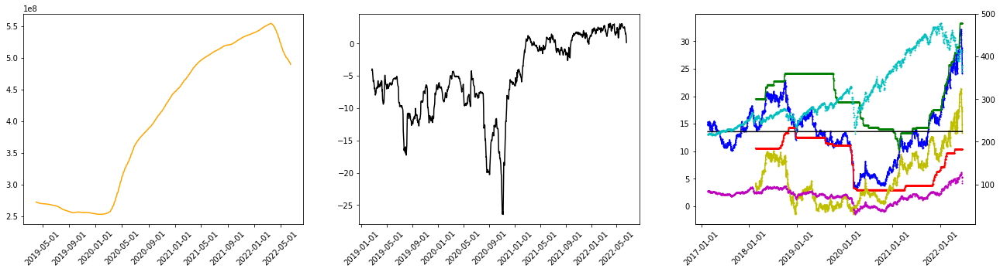

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: [None, 'add', True]
best inner cv score, sdev (11 folds): 12.692432470075477 12.658305740019543
test cv mean error, stdev (10 folds): 13.81643891808431 12.742004519767413
sell date: 2022-06-24
expected return: -0.030545518513457035
discounted return: -0.005156949693432056
quarter return: 0.6214704447404967


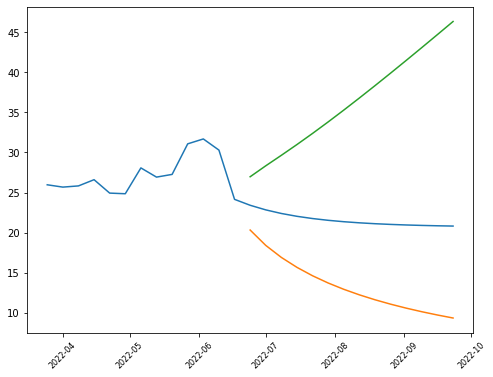

['quarterly_balance_sheet',                              2021-12-31    2021-09-30    2021-06-30  \
Capital Surplus            7.221000e+09  7.213000e+09  7.201000e+09   
Total Liab                 6.308000e+09  6.365000e+09  7.166000e+09   
Total Stockholder Equity   1.068600e+10  1.079600e+10  1.063400e+10   
Other Current Liab         3.680000e+08  4.960000e+08  5.020000e+08   
Total Assets               1.699400e+10  1.716100e+10  1.780000e+10   
Common Stock               9.370000e+08  9.370000e+08  9.370000e+08   
Other Current Assets       2.200000e+07  2.500000e+07  1.900000e+07   
Retained Earnings          7.271000e+09  6.669000e+09  6.524000e+09   
Other Liab                 6.440000e+08  6.420000e+08  6.650000e+08   
Treasury Stock            -4.743000e+09 -4.023000e+09 -4.028000e+09   
Other Assets               1.100000e+08  1.040000e+08  9.300000e+07   
Cash                       5.800000e+08  4.850000e+08  9.700000e+08   
Total Current Liabilities  1.637000e+09  1.676000

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,58.02,63.067854,72.56,82.052146,65.759365,6.444488,52.870389,78.648341


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
DVN,1.104104,58.02,237878397.65625,0.701688,0.885466,0.540317


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -287.8400573730469
Index Volume Factor: 1.1835166983613057
Index Risk Trend Factor: -3.791860877423899


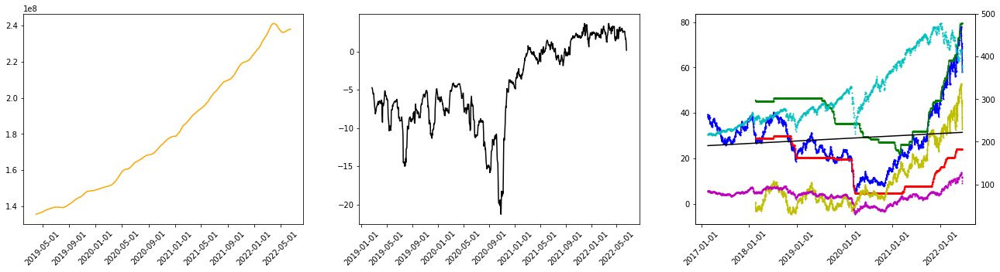

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: [None, 'mul', False]
best inner cv score, sdev (11 folds): 68.71417548477189 62.1797578559326
test cv mean error, stdev (10 folds): 74.83647438011172 61.97295578707844
sell date: 2022-09-23
expected return: 0.1808220391019067
discounted return: 0.0017149827102662663
quarter return: 1.1707484793447243


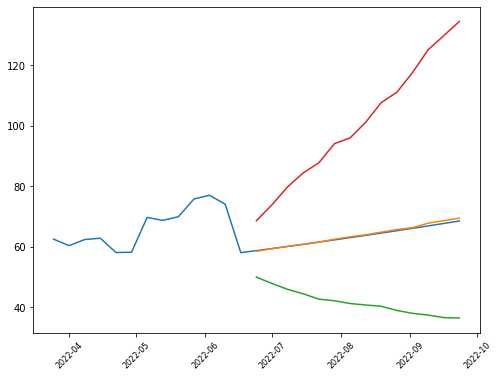

['quarterly_balance_sheet',                                     2021-12-31    2021-09-30    2021-06-30  \
Capital Surplus                   7.636000e+09  8.206000e+09  8.189000e+09   
Total Liab                        1.162600e+10  1.199600e+10  1.153000e+10   
Total Stockholder Equity          9.262000e+09  8.924000e+09  8.399000e+09   
Minority Interest                 1.370000e+08  1.370000e+08  1.360000e+08   
Other Current Liab                2.545000e+09  2.940000e+09  2.554000e+09   
Total Assets                      2.102500e+10  2.105700e+10  2.006500e+10   
Common Stock                      6.600000e+07  6.800000e+07  6.800000e+07   
Other Current Assets              5.240000e+08  4.860000e+08  5.030000e+08   
Retained Earnings                 1.692000e+09  7.500000e+08  2.430000e+08   
Other Liab                        1.805000e+09  1.743000e+09  1.698000e+09   
Good Will                         7.530000e+08  7.530000e+08  7.530000e+08   
Treasury Stock                   -1.

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,219.380005,194.589531,219.462223,244.334915,195.494921,19.533079,156.428764,234.561078


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
UTHR,1.481235,219.380005,8360250.78125,0.878858,0.826178,0.414478


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -122.20997619628906
Sector Volume Factor: 1.2238851152317325
Sector Risk Trend Factor: -3.3236323632363236
Index 1YMF: -69.05999755859375
Index Volume Factor: 0.5765983741853883
Index Risk Trend Factor: -5.134573474205833


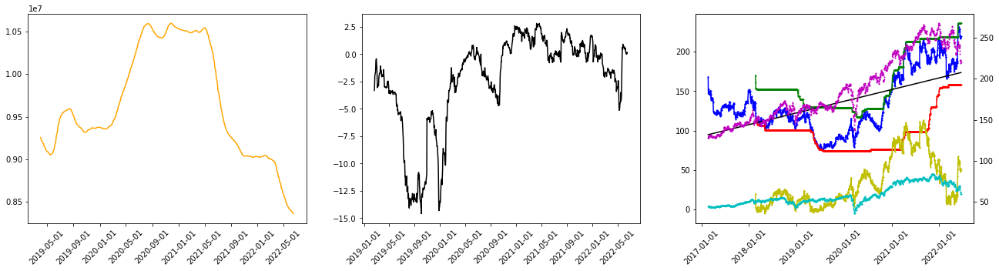

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'add', False]
best inner cv score, sdev (11 folds): 531.9682941978095 452.0653837271293
test cv mean error, stdev (10 folds): 561.166735867955 464.135091498849
sell date: 2022-08-26
expected return: 0.08353942336232305
discounted return: 0.0011634723460982599
quarter return: 1.1129089192358042


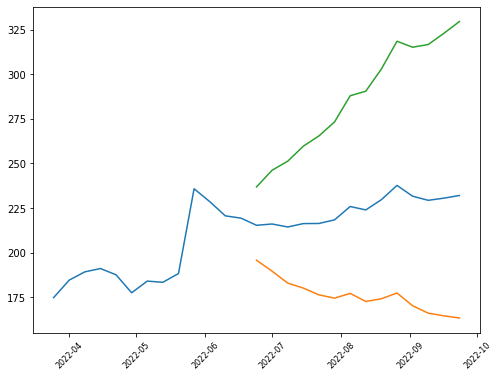

['options', ('2022-08-19',)]
['sustainability',                                  Value
2022-5                                
palmOil                          False
controversialWeapons             False
gambling                         False
socialScore                      16.62
nuclear                          False
furLeather                       False
alcoholic                        False
gmo                              False
catholic                         False
socialPercentile                  None
peerCount                           83
governanceScore                   7.41
environmentPercentile             None
animalTesting                     True
tobacco                          False
totalEsg                         25.71
highestControversy                   1
esgPerformance                AVG_PERF
coal                             False
pesticides                       False
adult                            False
percentile                       45.83
peerGroup       

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,28.5,25.427799,27.012222,28.596646,26.44746,1.162243,24.122974,28.771947


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
VIVO,0.591657,28.5,11730103.320312,0.878325,0.565494,0.431737


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


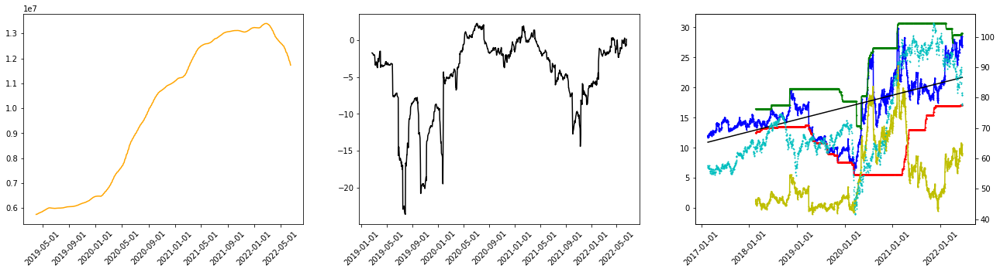

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', 'mul', True]
best inner cv score, sdev (11 folds): 13.788280356464544 13.738014778596314
test cv mean error, stdev (10 folds): 15.089252087061718 13.747310761770128
sell date: 2022-09-23
expected return: 0.14727365429632056
discounted return: 0.0014173787118039183
quarter return: 1.1391775064546943


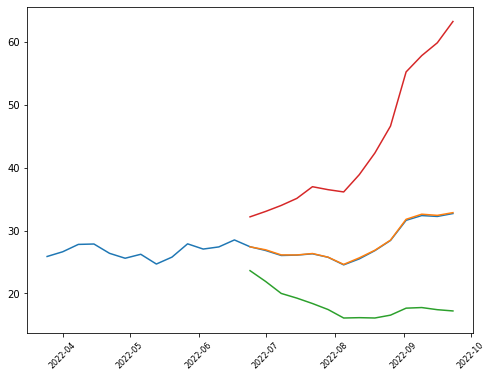

['options', ('2022-07-15',)]
symbol: ROCC
sector: Energy
Index: SP600
vol_30d_2yr: 11962556.0546875
Sector 1YMF: 2.549999237060547
1YMF: 2.549999237060547
risk trend factor: 0.10821588524114191
          beta currentRatio debtToEquity     ebitda ebitdaMargins forwardPE  \
ROCC  2.866152        0.497       80.978  323780000       0.45632  3.112757   

     freeCashflow grossMargins grossProfits heldPercentInstitutions  \
ROCC    111158752       0.9232    508729000                 0.83062   

           industry  marketCap operatingCashflow operatingMargins payoutRatio  \
ROCC  Oil & Gas E&P  800399808         390172992          0.23271           0   

     pegRatio priceToBook priceToSalesTrailing12Months profitMargins  \
ROCC     0.13    2.546801                     1.128053       0.06175   

     quickRatio returnOnAssets returnOnEquity revenueGrowth revenuePerShare  \
ROCC      0.404        0.08139        0.19205         1.903           39.08   

      sector sharesOutstanding shortR

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,37.82,32.048974,43.306825,54.564677,37.893968,5.380754,27.132461,48.655476


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
ROCC,1.213679,37.82,11962556.054688,0.666102,0.594188,0.577777


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


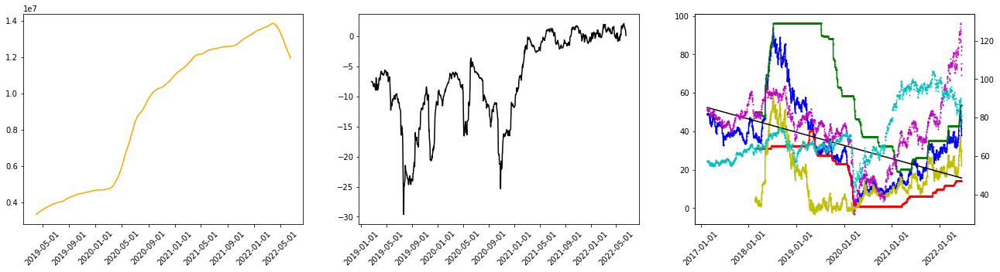

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'mul', True]
best inner cv score, sdev (11 folds): 73.681655909482 104.52540953783401
test cv mean error, stdev (10 folds): 78.01204468659131 108.68230111797764
sell date: 2022-07-01
expected return: 0.046128351250736964
discounted return: 0.003474951760013667
quarter return: 1.3759458452054782


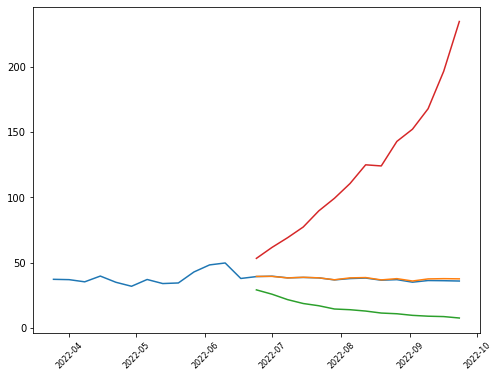

['options', ('2022-07-15', '2022-12-16')]
symbol: COP
sector: Energy
Index: SP500
vol_30d_2yr: 189274208.203125
Sector 1YMF: 3.6199951171875
1YMF: 3.6199951171875
risk trend factor: 0.1025203790799483
         beta currentRatio debtToEquity dividendRate dividendYield  \
COP  1.350272        1.513       38.088         1.92        0.0176   

    earningsGrowth       ebitda ebitdaMargins forwardPE freeCashflow  \
COP          4.853  25497999360       0.46444  7.529317  10752749568   

    grossMargins grossProfits heldPercentInstitutions       industry  \
COP      0.52295  22936000000                 0.81349  Oil & Gas E&P   

        marketCap operatingCashflow operatingMargins payoutRatio pegRatio  \
COP  121247997952       19983998976          0.33401      0.2348     0.48   

    priceToBook priceToSalesTrailing12Months profitMargins quickRatio  \
COP    2.463471                     2.208525       0.23417      1.287   

    returnOnAssets returnOnEquity revenueGrowth revenuePerShare  s

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,93.739998,99.652102,112.199365,124.746628,104.355397,7.447422,89.460553,119.250241


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
COP,0.95084,93.739998,189274208.203125,0.685759,0.80033,0.48084


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -287.8400573730469
Index Volume Factor: 1.1835166983613057
Index Risk Trend Factor: -3.791860877423899


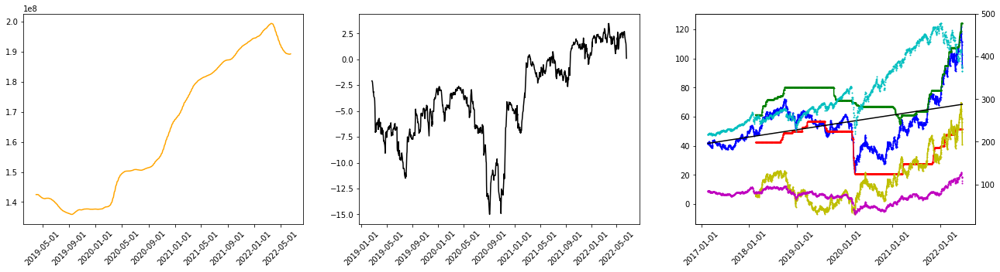

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: [None, 'mul', True]
best inner cv score, sdev (11 folds): 146.57805508986883 144.15463593296505
test cv mean error, stdev (10 folds): 160.23674169113747 144.24443854330687
sell date: 2022-06-24
expected return: -0.005859008557960844
discounted return: -0.0009788938850212592
quarter return: 0.9138376538273771


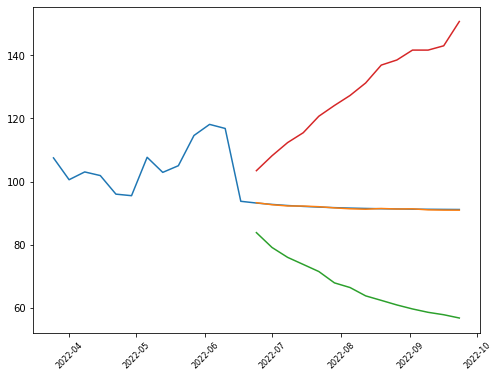

['options', ('2022-08-19', '2023-01-20', '2024-01-19')]
['sustainability',                                      Value
2022-5                                    
palmOil                              False
controversialWeapons                 False
gambling                             False
socialScore                           9.71
nuclear                              False
furLeather                           False
alcoholic                            False
gmo                                  False
catholic                             False
socialPercentile                      None
peerCount                               66
governanceScore                       7.68
environmentPercentile                 None
animalTesting                        False
tobacco                              False
totalEsg                             34.92
highestControversy                       2
esgPerformance                    OUT_PERF
coal                                 False
pesticides            

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,55.68,56.839295,65.607143,74.374991,61.382222,4.693201,51.995819,70.768625


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
OXY,1.190976,55.68,498984476.953125,0.71978,0.690434,0.542013


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -287.8400573730469
Index Volume Factor: 1.1835166983613057
Index Risk Trend Factor: -3.791860877423899


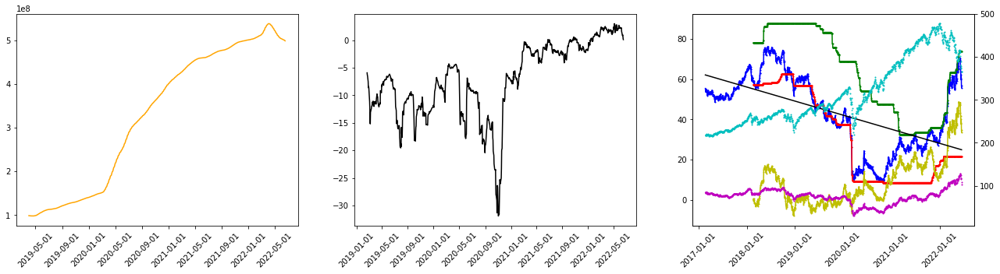

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', None]
best inner cv score, sdev (11 folds): 67.2199336556931 59.73887056699645
test cv mean error, stdev (10 folds): 72.47517021468275 60.18150296369074
sell date: 2022-09-16
expected return: 0.26756470126000104
discounted return: 0.0026378898086187874
quarter return: 1.2742609135760552


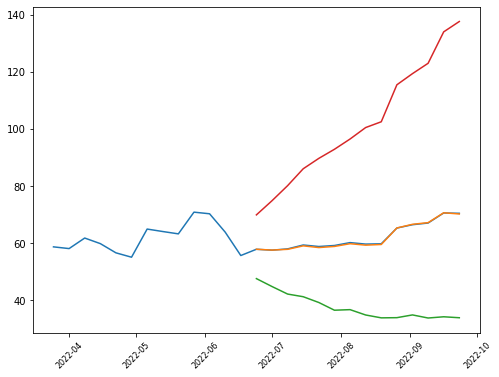

['options', ('2022-08-19', '2023-01-20', '2024-01-19')]
['sustainability',                                      Value
2022-5                                    
palmOil                              False
controversialWeapons                 False
gambling                             False
socialScore                          12.04
nuclear                              False
furLeather                           False
alcoholic                            False
gmo                                  False
catholic                             False
socialPercentile                      None
peerCount                               66
governanceScore                       6.88
environmentPercentile                 None
animalTesting                        False
tobacco                              False
totalEsg                             43.53
highestControversy                       2
esgPerformance                   LEAD_PERF
coal                                 False
pesticides            

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,93.139999,89.504506,94.30381,99.103114,92.664127,3.996399,84.671329,100.656925


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
MGPI,1.204144,93.139999,2319158.789062,0.847493,0.649088,0.471114


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


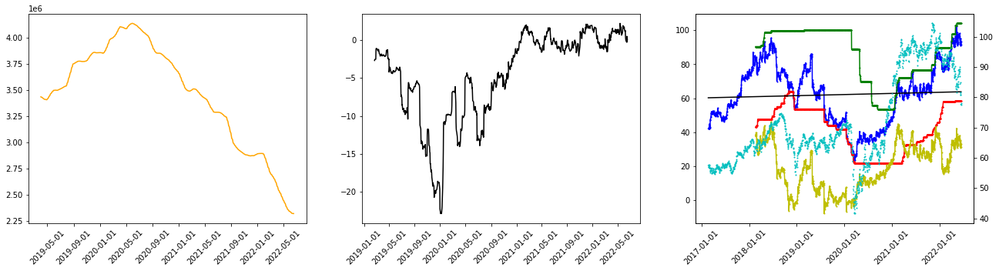

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'add', False]
best inner cv score, sdev (11 folds): 108.84844376995493 108.33051212540643
test cv mean error, stdev (10 folds): 117.69850195448052 109.76106514492068
sell date: 2022-09-23
expected return: 0.1823336205591928
discounted return: 0.0017281939806363944
quarter return: 1.172169866801382


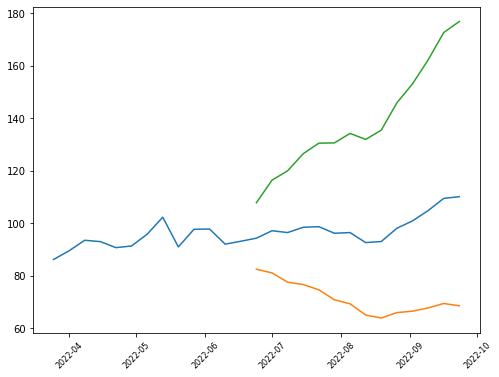

symbol: MTDR
sector: Energy
Index: SP400
vol_30d_2yr: 48684538.4765625
Sector 1YMF: 0.3000030517578125
1YMF: 0.3000030517578125
risk trend factor: 0.01246895603489608
          beta currentRatio debtToEquity dividendRate dividendYield  \
MTDR  3.830762        0.997       64.833          0.2        0.0036   

     earningsGrowth      ebitda ebitdaMargins forwardPE freeCashflow  \
MTDR          2.392  1377725952       0.67726   5.21385     29532376   

     grossMargins grossProfits heldPercentInstitutions       industry  \
MTDR      0.85318   1462239000                 0.94358  Oil & Gas E&P   

       marketCap operatingCashflow operatingMargins payoutRatio pegRatio  \
MTDR  6048000000        1212914048          0.49636      0.0245     0.52   

     priceToBook priceToSalesTrailing12Months profitMargins quickRatio  \
MTDR    2.853322                      2.97308       0.35956      0.801   

     returnOnAssets returnOnEquity revenueGrowth revenuePerShare  sector  \
MTDR        0.15195 

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,51.200001,48.705794,59.342064,69.978334,55.003573,5.257912,44.487749,65.519397


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
MTDR,0.702256,51.200001,48684538.476562,0.730363,0.889052,0.461003


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -69.05999755859375
Index Volume Factor: 0.5765983741853883
Index Risk Trend Factor: -5.134573474205833


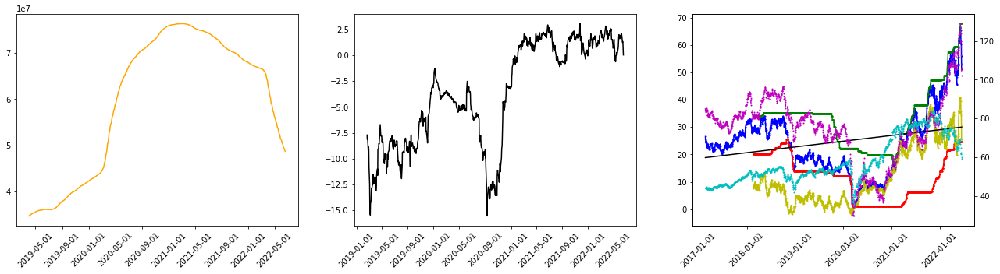

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: [None, None]
best inner cv score, sdev (11 folds): 50.80379825693239 41.064777707204016
test cv mean error, stdev (10 folds): 55.70621239599544 39.882041781440286
sell date: 2022-06-24
expected return: 2.4217904656762308e-05
discounted return: 4.036276713748066e-06
quarter return: 1.0003714056622668


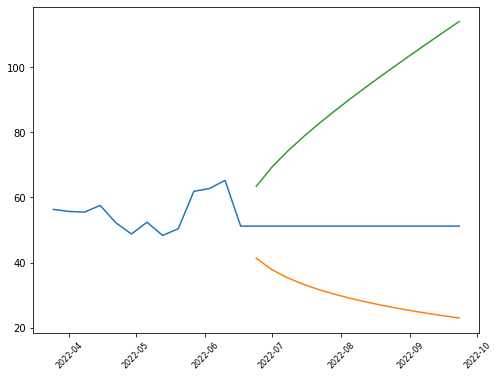

['options', ('2022-07-15', '2023-01-20')]
symbol: CIVI
sector: Energy
Index: SP600
vol_30d_2yr: 11280458.3984375
Sector 1YMF: -4.769992828369141
1YMF: -4.769992828369141
risk trend factor: -0.16120284517848887
         beta currentRatio debtToEquity dividendRate dividendYield     ebitda  \
CIVI  1.69646        0.505       11.399         1.85        0.0308  910931008   

     ebitdaMargins forwardPE freeCashflow grossMargins grossProfits  \
CIVI       0.54408  4.123542    855249152      0.79951    731177000   

     heldPercentInstitutions       industry   marketCap operatingCashflow  \
CIVI                 1.04414  Oil & Gas E&P  5104847872         764176000   

     operatingMargins payoutRatio pegRatio priceToBook  \
CIVI          0.26443      0.2792     0.33    1.100427   

     priceToSalesTrailing12Months profitMargins quickRatio returnOnAssets  \
CIVI                     3.049008       0.16167      0.477        0.06714   

     returnOnEquity revenueGrowth revenuePerShare  sector

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,60.080002,60.574303,74.092381,87.610459,65.567778,7.658155,50.251469,80.884087


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
CIVI,1.757641,60.080002,11280458.398438,0.651117,0.000393,0.470352


ADFuller H0 rejected @ .05, Mean Reverting TS
Month Mean Reverting buy signal


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


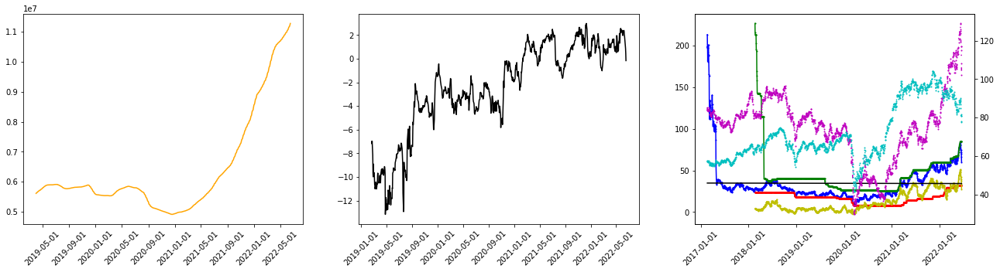

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'add', False]
best inner cv score, sdev (11 folds): 57.07527951568502 43.09794828343172
test cv mean error, stdev (10 folds): 61.65999107957166 42.56713606078584
sell date: 2022-09-09
expected return: 0.08288132183729856
discounted return: 0.0009598022339978307
quarter return: 1.0922714821898638


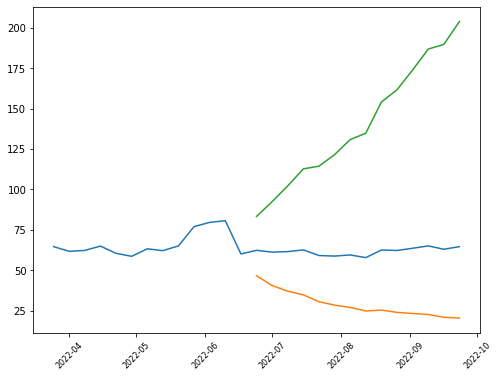

['options', ('2022-07-15', '2022-12-16')]
symbol: AZO
sector: Consumer Cyclical
Index: SP500
vol_30d_2yr: 4250866.015625
Sector 1YMF: -99.27978515625
1YMF: -99.27978515625
risk trend factor: -0.18868743102283064
         beta currentRatio earningsGrowth      ebitda ebitdaMargins forwardPE  \
AZO  0.901339        0.776          0.096  3682660096       0.23282  16.41704   

    grossMargins grossProfits heldPercentInstitutions          industry  \
AZO      0.52377   7717785000                 0.96976  Specialty Retail   

       marketCap operatingMargins payoutRatio pegRatio  \
AZO  40288190464          0.20572           0     1.97   

    priceToSalesTrailing12Months profitMargins quickRatio returnOnAssets  \
AZO                     2.547087       0.15207      0.033        0.14193   

    revenueGrowth revenuePerShare             sector sharesOutstanding  \
AZO         0.059         767.647  Consumer Cyclical          19576000   

    shortRatio  totalCash totalCashPerShare   totalDebt

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,1992.550049,1816.773252,2002.902222,2189.031191,2042.225716,100.990553,1840.24461,2244.206822


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
AZO,1.078463,1992.550049,4250866.015625,0.768227,0.970995,0.404903


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -359.96002197265625
Sector Volume Factor: 1.2928194874233667
Sector Risk Trend Factor: -4.72140697901556
Index 1YMF: -287.8400573730469
Index Volume Factor: 1.1835166983613057
Index Risk Trend Factor: -3.791860877423899


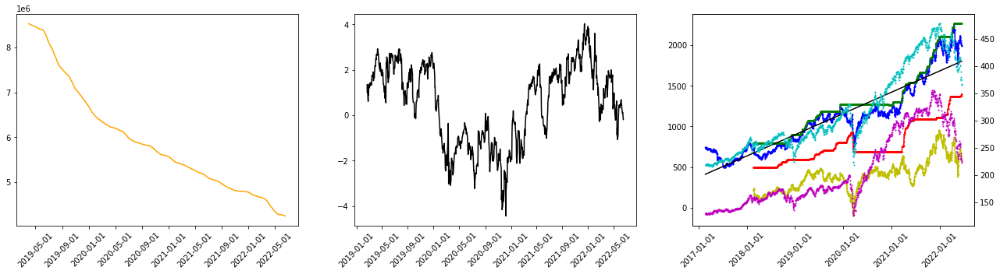

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', None]
best inner cv score, sdev (11 folds): 63137.31188390248 88854.74003212538
test cv mean error, stdev (10 folds): 68455.14549345404 91507.58934823258
sell date: 2022-09-16
expected return: 0.07133760961127086
discounted return: 0.0007659372934596398
quarter return: 1.072979392980291


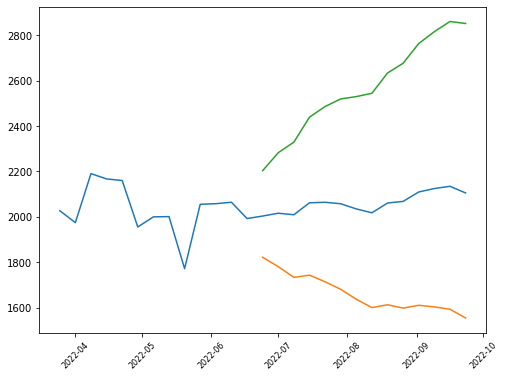

['options', ('2022-09-16', '2022-12-16')]
['sustainability',                             Value
2022-5                           
palmOil                     False
controversialWeapons        False
gambling                    False
socialScore                  7.17
nuclear                     False
furLeather                  False
alcoholic                   False
gmo                         False
catholic                    False
socialPercentile             None
peerCount                      57
governanceScore              4.12
environmentPercentile        None
animalTesting               False
tobacco                     False
totalEsg                    11.34
highestControversy              2
esgPerformance         UNDER_PERF
coal                        False
pesticides                  False
adult                       False
percentile                   3.53
peerGroup               Retailing
smallArms                   False
environmentScore             0.05
governancePercentile 

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,219.949997,223.738215,240.378096,257.017977,230.259682,18.979918,192.299846,268.219518


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
MUSA,1.334565,219.949997,5753261.328125,0.722226,0.983263,0.407464


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -359.96002197265625
Sector Volume Factor: 1.2928194874233667
Sector Risk Trend Factor: -4.72140697901556
Index 1YMF: -69.05999755859375
Index Volume Factor: 0.5765983741853883
Index Risk Trend Factor: -5.134573474205833


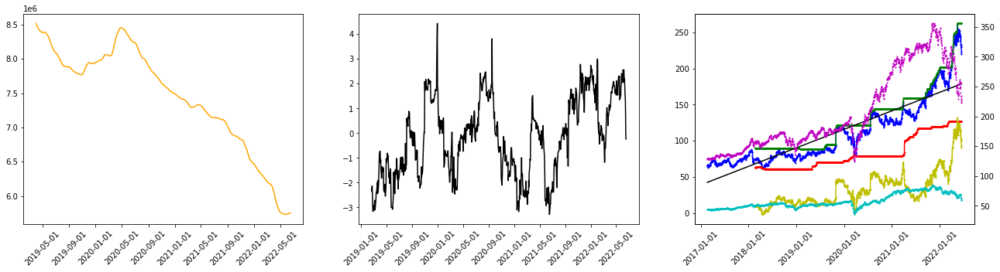

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', 'add', True]
best inner cv score, sdev (11 folds): 715.3257830805561 661.0824765975951
test cv mean error, stdev (10 folds): 648.0064679024345 656.4161816818842
sell date: 2022-08-26
expected return: 0.06149875115961356
discounted return: 0.0008653281758577158
quarter return: 1.0828275996323262


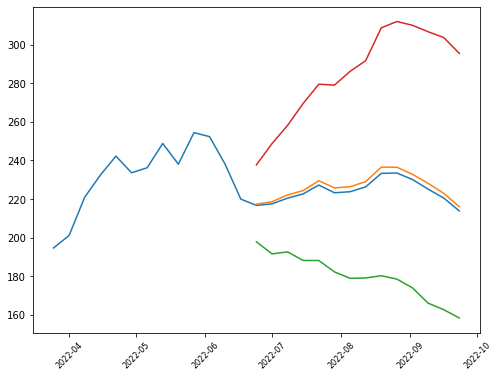

['options', ('2022-07-15', '2022-11-18')]
symbol: UFCS
sector: error
sector: error
Index: SP600
vol_30d_2yr: 1723938.8671875
Sector 1YMF: -1.0800018310546875
1YMF: -1.0800018310546875
risk trend factor: -0.24161108190588027
Empty DataFrame
Columns: []
Index: [UFCS]


,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,32.57,29.682972,31.6,33.517028,30.725873,1.016477,28.69292,32.758826


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
UFCS,1.187165,32.57,1723938.867188,0.782015,0.585692,0.498098


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


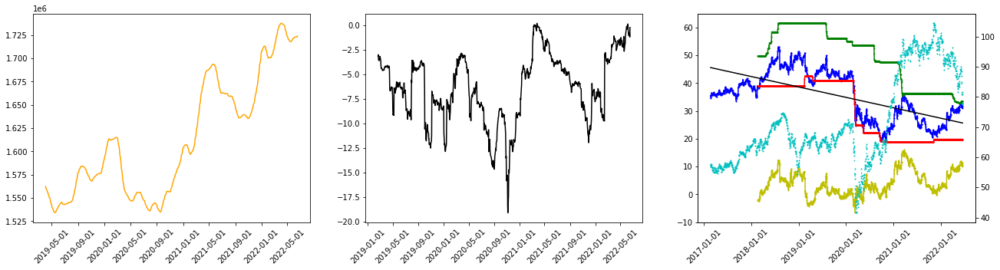

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', 'add', False]
best inner cv score, sdev (11 folds): 13.34140757695232 9.2016866490542
test cv mean error, stdev (10 folds): 14.540631099273885 8.79345756381533
sell date: 2022-09-16
expected return: 0.08518140898826108
discounted return: 0.0009087145226485127
quarter return: 1.0871545453020353


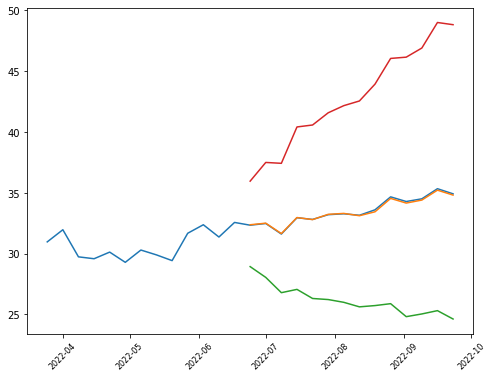

['options', ('2022-08-19',)]
symbol: CVBF
sector: Financial Services
Index: SP600
vol_30d_2yr: 12635628.7109375
Sector 1YMF: -0.7200050354003906
1YMF: -0.7200050354003906
risk trend factor: -0.30769443950852354
          beta dividendRate dividendYield earningsGrowth ebitdaMargins  \
CVBF  0.377941         0.72        0.0305          -0.34             0   

      forwardPE grossMargins grossProfits heldPercentInstitutions  \
CVBF  16.874126            0    483535000                 0.72487   

            industry   marketCap operatingMargins payoutRatio pegRatio  \
CVBF  Banks—Regional  3270145792          0.60509      0.5143     1.53   

     priceToBook priceToSalesTrailing12Months profitMargins returnOnAssets  \
CVBF    1.584373                     6.935887       0.41187        0.01199   

     returnOnEquity revenueGrowth revenuePerShare              sector  \
CVBF        0.09482        -0.091           3.428  Financial Services   

     sharesOutstanding shortRatio   totalCash to

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,24.129999,23.52193,24.381429,25.240927,23.704776,0.67123,22.362315,25.047236


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
CVBF,1.598852,24.129999,12635628.710938,0.887047,0.445451,0.318304


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -72.2699966430664
Sector Volume Factor: 1.2707168073107045
Sector Risk Trend Factor: -4.617890709055871
Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


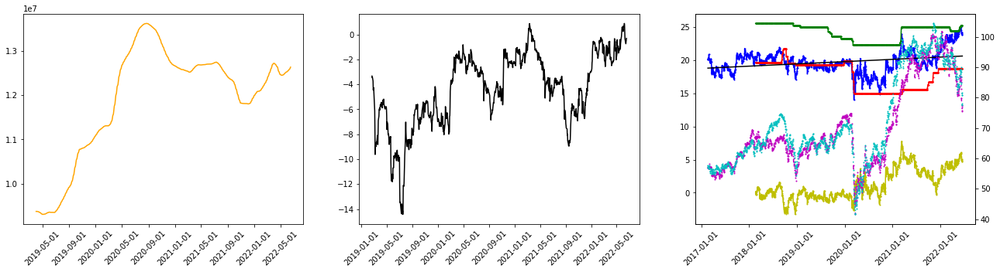

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'mul', False]
best inner cv score, sdev (11 folds): 3.115250571845985 2.0162683413279776
test cv mean error, stdev (10 folds): 3.3206175302063086 2.001984259093406
sell date: 2022-08-26
expected return: 0.028650177231196176
discounted return: 0.0004094669280247931
quarter return: 1.0383814958869377


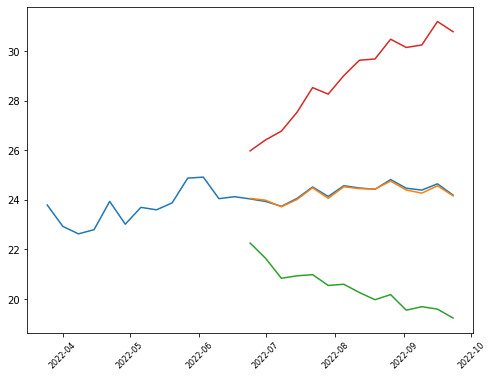

['quarterly_balance_sheet',                                     2022-03-31    2021-12-31    2021-09-30  \
Intangible Assets                 2.731000e+07  2.539400e+07  2.728600e+07   
Total Liab                        1.546409e+10  1.380219e+10  1.413768e+10   
Total Stockholder Equity          2.075043e+09  2.081503e+09  2.063920e+09   
Total Assets                      1.753914e+10  1.588370e+10  1.620160e+10   
Common Stock                      2.221305e+09  1.209903e+09  1.208569e+09   
Other Liab                        1.194280e+08  9.571600e+07  8.888300e+07   
Good Will                         7.658220e+08  6.637070e+08  6.637070e+08   
Treasury Stock                   -1.462620e+08 -3.968000e+06  3.078000e+06   
Other Assets                      9.004589e+09  8.111415e+09  8.115782e+09   
Cash                              1.653039e+09  1.732548e+09  2.561363e+09   
Total Current Liabilities         1.534467e+10  1.369213e+10  1.402944e+10   
Other Stockholder Equity         -1.

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,111.669998,116.00035,133.675556,151.350762,125.214127,8.653608,107.906911,142.521343


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
EOG,0.966433,111.669998,97142371.875,0.688961,0.584303,0.478009


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -287.8400573730469
Index Volume Factor: 1.1835166983613057
Index Risk Trend Factor: -3.791860877423899


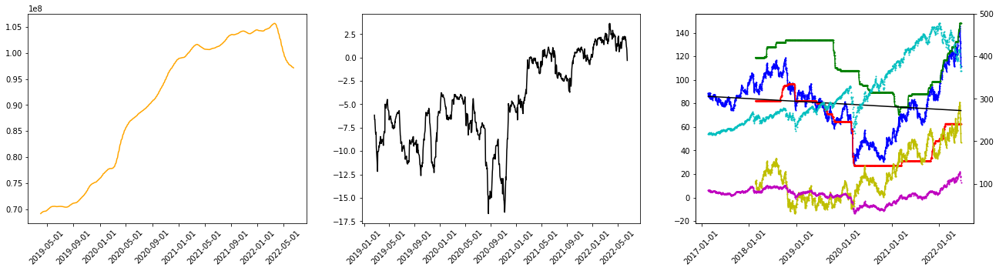

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', 'add', False]
best inner cv score, sdev (11 folds): 263.50765728004404 194.33682292950965
test cv mean error, stdev (10 folds): 286.67242832517366 188.78777840262532
sell date: 2022-09-16
expected return: 0.22256139976037265
discounted return: 0.0022352518573900415
quarter return: 1.2280329733852624


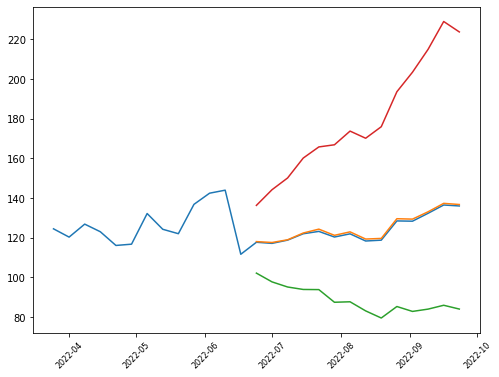

['options', ('2022-07-15', '2023-01-20', '2024-01-19', '2026-03-20')]
['sustainability',                                      Value
2022-5                                    
palmOil                              False
controversialWeapons                 False
gambling                             False
socialScore                           8.13
nuclear                              False
furLeather                           False
alcoholic                            False
gmo                                  False
catholic                             False
socialPercentile                      None
peerCount                               66
governanceScore                       7.73
environmentPercentile                 None
animalTesting                        False
tobacco                              False
totalEsg                             36.25
highestControversy                       1
esgPerformance                    OUT_PERF
coal                                 False
pesticid

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,40.580002,37.816359,39.913492,42.010626,39.092064,2.21228,34.667503,43.516624


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
CYTK,0.618546,40.580002,23676993.75,0.779452,0.984005,0.353422


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -122.20997619628906
Sector Volume Factor: 1.2238851152317325
Sector Risk Trend Factor: -3.3236323632363236
Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


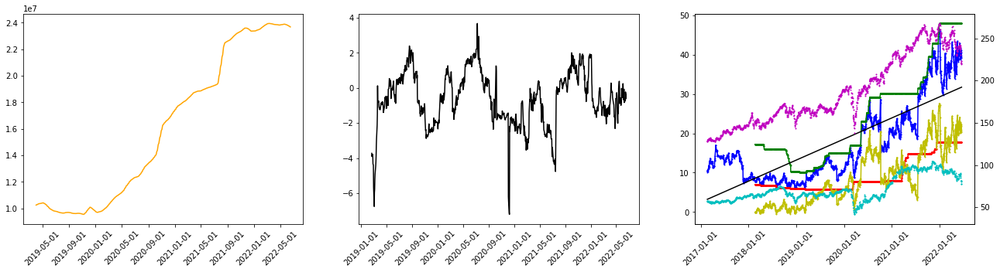

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: [None, 'mul', False]
best inner cv score, sdev (11 folds): 24.198114077612242 21.543997143388985
test cv mean error, stdev (10 folds): 25.43219886436263 22.221736587069383
sell date: 2022-09-23
expected return: 0.1641286618363941
discounted return: 0.0015679586588457362
quarter return: 1.1550449072443965


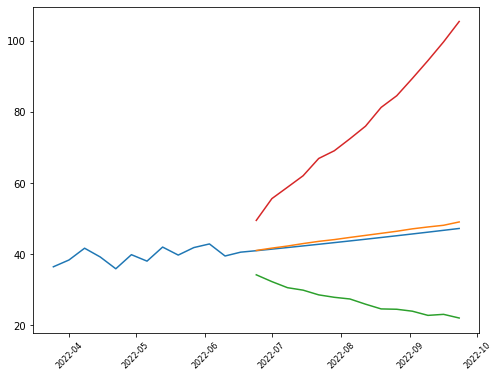

['options', ('2022-08-19', '2023-01-20', '2024-01-19')]
symbol: ULTA
sector: Consumer Cyclical
Index: SP500
vol_30d_2yr: 17968125.78125
Sector 1YMF: -40.080047607421875
1YMF: -40.080047607421875
risk trend factor: -0.40616171652986643
         beta currentRatio debtToEquity earningsGrowth      ebitda  \
ULTA  1.65196        1.464      120.281          0.789  1561005056   

     ebitdaMargins  forwardPE freeCashflow grossMargins grossProfits  \
ULTA       0.18086  22.113407    763609024      0.43536   3757531000   

     heldPercentInstitutions          industry    marketCap operatingCashflow  \
ULTA                 0.92322  Specialty Retail  21422397440        1059265024   

     operatingMargins payoutRatio pegRatio priceToBook  \
ULTA          0.14987           0     0.46   10.792322   

     priceToSalesTrailing12Months profitMargins quickRatio returnOnAssets  \
ULTA                     2.482061       0.11422      0.427        0.16407   

     returnOnEquity revenueGrowth revenuePer

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,395.829987,334.79461,392.247617,449.700624,397.276032,20.780001,355.716031,438.836034


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
ULTA,1.308411,395.829987,17968125.78125,0.830576,0.517356,0.398236


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -359.96002197265625
Sector Volume Factor: 1.2928194874233667
Sector Risk Trend Factor: -4.72140697901556
Index 1YMF: -287.8400573730469
Index Volume Factor: 1.1835166983613057
Index Risk Trend Factor: -3.791860877423899


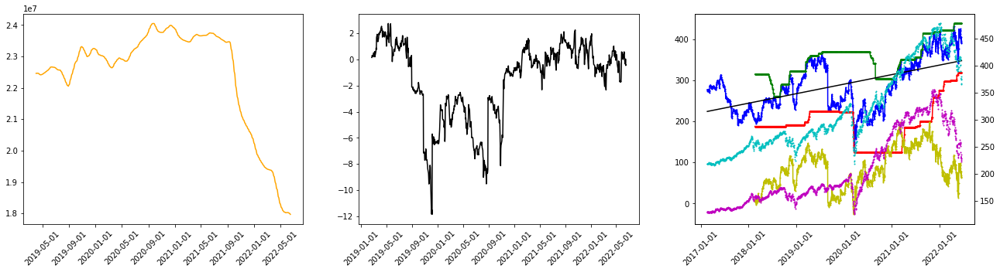

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', None]
best inner cv score, sdev (11 folds): 2384.3378017500263 3651.6916988205103
test cv mean error, stdev (10 folds): 2511.063421259521 3806.79780264185
sell date: 2022-09-23
expected return: 0.13502035319233277
discounted return: 0.0013065288806024533
quarter return: 1.1276346429644923


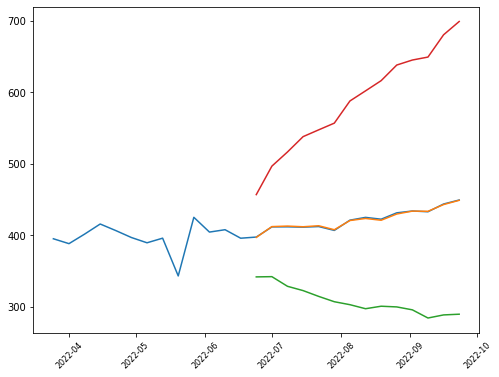

['quarterly_balance_sheet',                              2022-01-29    2021-10-30    2021-07-31  \
Intangible Assets          1.538000e+06  1.770000e+06  2.001000e+06   
Capital Surplus            9.349450e+08  9.158140e+08  8.892060e+08   
Total Liab                 3.229006e+09  3.300967e+09  3.074772e+09   
Total Stockholder Equity   1.535373e+09  1.986800e+09  1.879813e+09   
Deferred Long Term Liab    2.259600e+07           NaN           NaN   
Other Current Liab         3.663650e+08  2.726280e+08  3.093070e+08   
Total Assets               4.764379e+09  5.287767e+09  4.954585e+09   
Common Stock               5.300000e+05  5.490000e+05  5.510000e+05   
Other Current Assets       5.909000e+06  3.750100e+07  1.854400e+07   
Retained Earnings          6.533760e+08  1.123749e+09  1.034831e+09   
Other Liab                 9.835800e+07  1.109300e+08  1.077000e+08   
Good Will                  1.087000e+07  1.087000e+07  1.087000e+07   
Treasury Stock            -5.347800e+07 -5.331200

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,35.939999,37.757538,45.406984,53.05643,40.584762,5.367299,29.850164,51.31936


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
EQT,1.286201,35.939999,138427084.179688,0.637252,0.584446,0.494719


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -69.05999755859375
Index Volume Factor: 0.5765983741853883
Index Risk Trend Factor: -5.134573474205833


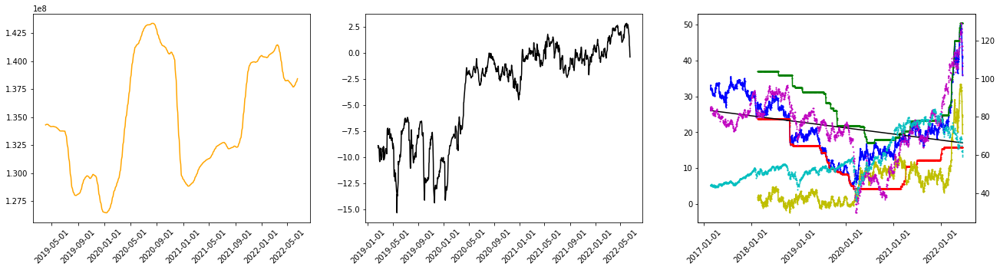

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'mul', False]
best inner cv score, sdev (11 folds): 30.031748475549897 49.88330860000595
test cv mean error, stdev (10 folds): 32.88875319441041 51.45281031290238
sell date: 2022-09-23
expected return: 0.33571990522681505
discounted return: 0.002988688191711386
quarter return: 1.3159373779794563


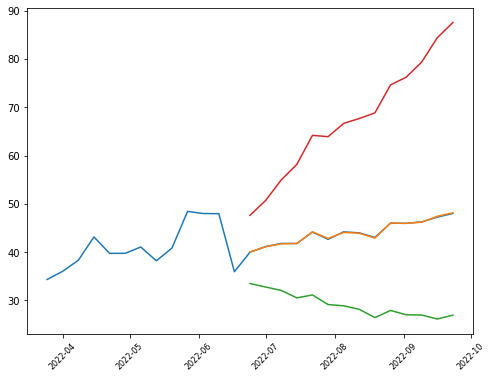

['options', ('2023-01-20', '2024-01-19')]
['sustainability',                                      Value
2022-5                                    
palmOil                              False
controversialWeapons                 False
gambling                             False
socialScore                          10.21
nuclear                              False
furLeather                           False
alcoholic                            False
gmo                                  False
catholic                             False
socialPercentile                      None
peerCount                               66
governanceScore                       7.64
environmentPercentile                 None
animalTesting                        False
tobacco                              False
totalEsg                             37.38
highestControversy                       1
esgPerformance                    OUT_PERF
coal                                 False
pesticides                          

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,15.24,15.042063,17.914127,20.786191,16.707143,1.496207,13.714728,19.699558


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
PTEN,1.071603,15.24,69871969.140625,0.70854,0.193969,0.465514


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


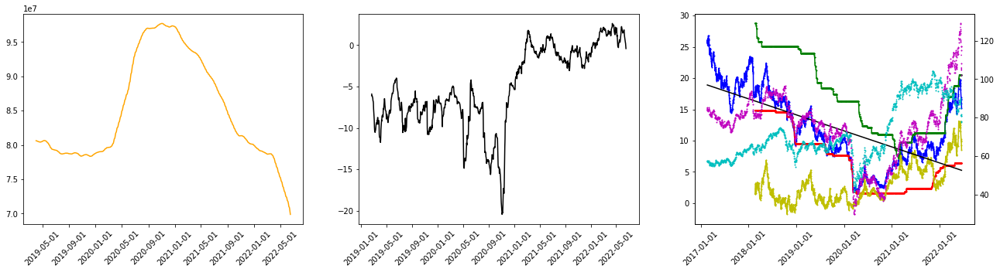

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'mul', False]
best inner cv score, sdev (11 folds): 5.190537105976883 4.645520582620731
test cv mean error, stdev (10 folds): 5.602469605227471 4.676791144425836
sell date: 2022-09-23
expected return: 0.3739947243693804
discounted return: 0.0032808584606571767
quarter return: 1.351675471914011


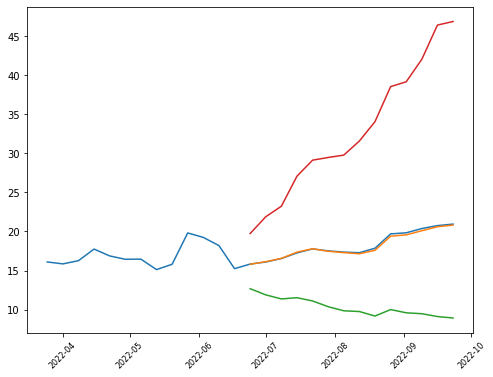

['options', ('2022-08-19', '2023-01-20')]
symbol: LPI
sector: Energy
Index: SP600
vol_30d_2yr: 14333690.68359375
Sector 1YMF: -29.169998168945312
1YMF: -29.169998168945312
risk trend factor: -0.4368728166685758
        beta currentRatio debtToEquity     ebitda ebitdaMargins forwardPE  \
LPI  3.87549        0.448      280.154  404096000       0.28987  3.592152   

    freeCashflow grossMargins grossProfits heldPercentInstitutions  \
LPI   -657876864      0.65925    919042000                 0.65067   

          industry   marketCap operatingCashflow operatingMargins payoutRatio  \
LPI  Oil & Gas E&P  1390741760         496671008          0.13235           0   

    pegRatio priceToBook priceToSalesTrailing12Months profitMargins  \
LPI    -0.22    5.735708                     0.997609       0.10402   

    quickRatio returnOnAssets returnOnEquity revenueGrowth revenuePerShare  \
LPI      0.396        0.05774        0.58906           1.5          97.899   

     sector sharesOutstanding 

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,81.470001,55.385982,91.38381,127.381638,80.369841,15.040964,50.287912,110.45177


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
LPI,1.480449,81.470001,14333690.683594,0.651878,0.115073,0.409738


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


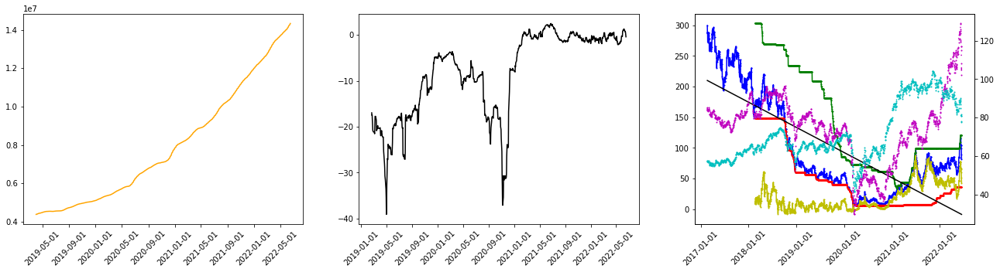

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: [None, 'mul', True]
best inner cv score, sdev (11 folds): 231.248257243034 166.92299271305848
test cv mean error, stdev (10 folds): 246.78009461880447 167.32004507129605
sell date: 2022-06-24
expected return: -0.0029769430921259606
discounted return: -0.0004967737338769096
quarter return: 0.9553146280075225


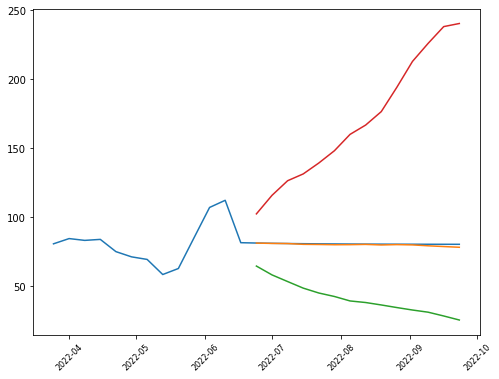

['quarterly_balance_sheet',                                     2021-12-31    2021-09-30    2021-06-30  \
Capital Surplus                   2.788628e+09  2.715196e+09  2.473709e+09   
Total Liab                        2.038044e+09  2.034910e+09  1.941088e+09   
Total Stockholder Equity          5.137800e+08  2.240620e+08 -1.542820e+08   
Deferred Long Term Liab           8.100000e+06  3.630000e+07  3.200000e+06   
Other Current Liab                3.529620e+08  4.316830e+08  4.279700e+08   
Total Assets                      2.551824e+09  2.258972e+09  1.786806e+09   
Common Stock                      1.710000e+05  1.610000e+05  1.360000e+05   
Other Current Assets              4.346000e+06  2.049400e+07  1.866500e+07   
Retained Earnings                -2.275019e+09 -2.491295e+09 -2.628127e+09   
Other Liab                        7.954700e+07  1.041390e+08  1.387280e+08   
Other Assets                      5.430400e+07  8.209600e+07  9.670500e+07   
Cash                              5.

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,32.93,32.684032,35.016032,37.348031,33.294127,1.677396,29.939335,36.648919


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
NTCT,1.227115,32.93,9623952.148438,0.734933,0.034064,0.345791


ADFuller H0 rejected @ .05, Mean Reverting TS
Month Mean Reverting buy signal


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -363.4599914550781
Sector Volume Factor: 1.1528457613891094
Sector Risk Trend Factor: -4.954471974241429
Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


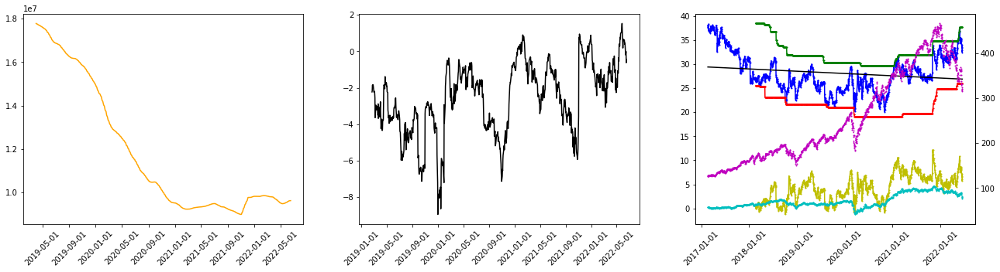

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', None]
best inner cv score, sdev (11 folds): 10.19920331942748 5.86648363530566
test cv mean error, stdev (10 folds): 10.486504110255629 6.078588173761055
sell date: 2022-09-23
expected return: 0.14994166035568707
discounted return: 0.0014413595240705401
quarter return: 1.141689978715372


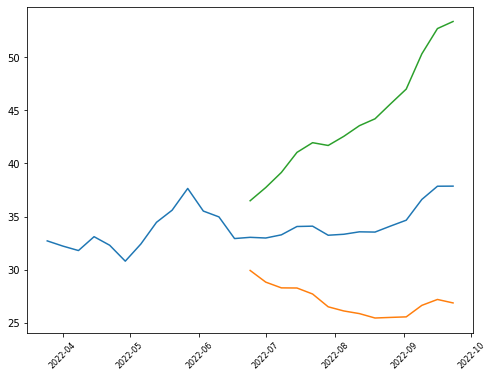

['options', ('2022-12-16',)]
symbol: BMY
sector: Healthcare
Index: SP500
vol_30d_2yr: 251915320.8984375
Sector 1YMF: -3.2500076293945312
1YMF: -3.2500076293945312
risk trend factor: -0.4710154943017281
         beta currentRatio debtToEquity dividendRate dividendYield  \
BMY  0.479582         1.32      145.347         2.16        0.0293   

    earningsGrowth       ebitda ebitdaMargins forwardPE freeCashflow  \
BMY         -0.337  21088999424       0.44908  9.141264  14867624960   

    grossMargins grossProfits heldPercentInstitutions  \
BMY      0.80128  37048000000                 0.79264   

                       industry     marketCap operatingCashflow  \
BMY  Drug Manufacturers—General  157060743168       16195000320   

    operatingMargins payoutRatio pegRatio priceToBook  \
BMY          0.22193      0.7305     2.12     4.97337   

    priceToSalesTrailing12Months profitMargins quickRatio returnOnAssets  \
BMY                     3.344564       0.13311      1.152        0.0604

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,73.769997,72.385736,75.350794,78.315851,75.403174,1.748022,71.90713,78.899219


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
BMY,1.240092,73.769997,251915320.898438,0.809374,0.645642,0.477511


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -122.20997619628906
Sector Volume Factor: 1.2238851152317325
Sector Risk Trend Factor: -3.3236323632363236
Index 1YMF: -287.8400573730469
Index Volume Factor: 1.1835166983613057
Index Risk Trend Factor: -3.791860877423899


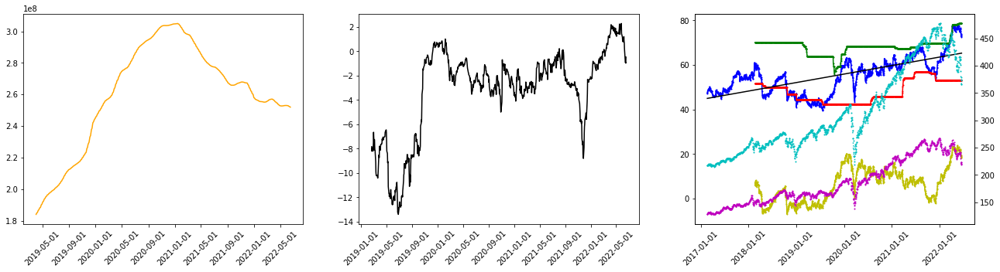

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', None]
best inner cv score, sdev (11 folds): 86.50903586996206 125.59465263993609
test cv mean error, stdev (10 folds): 81.65701896902372 130.73816916040838
sell date: 2022-07-01
expected return: 0.03473648557860149
discounted return: 0.002630128966783607
quarter return: 1.2733538077339723


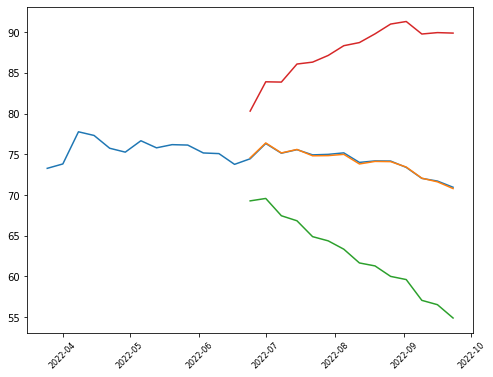

['options', ('2023-01-20', '2024-01-19')]
['sustainability',                                  Value
2022-5                                
palmOil                          False
controversialWeapons             False
gambling                         False
socialScore                      14.93
nuclear                          False
furLeather                       False
alcoholic                        False
gmo                              False
catholic                          True
socialPercentile                  None
peerCount                           83
governanceScore                   7.56
environmentPercentile             None
animalTesting                     True
tobacco                          False
totalEsg                         22.83
highestControversy                   2
esgPerformance                AVG_PERF
coal                             False
pesticides                       False
adult                            False
percentile                       34.61
pee

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,90.510002,91.355788,101.374286,111.392784,91.798413,8.517034,74.764345,108.832481


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
PSX,1.286747,90.510002,72319717.1875,0.694604,0.093536,0.512375


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -287.8400573730469
Index Volume Factor: 1.1835166983613057
Index Risk Trend Factor: -3.791860877423899


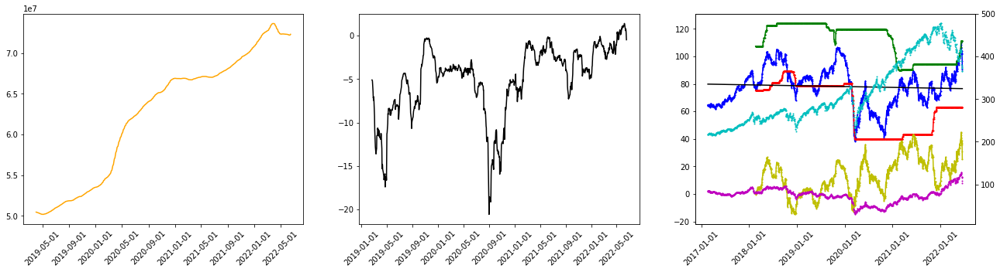

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', 'add', True]
best inner cv score, sdev (11 folds): 284.4482562736264 352.84569795287524
test cv mean error, stdev (10 folds): 310.5239011990068 359.82049014659225
sell date: 2022-08-26
expected return: 0.0965010881959715
discounted return: 0.0013360262005039925
quarter return: 1.1306948724119517


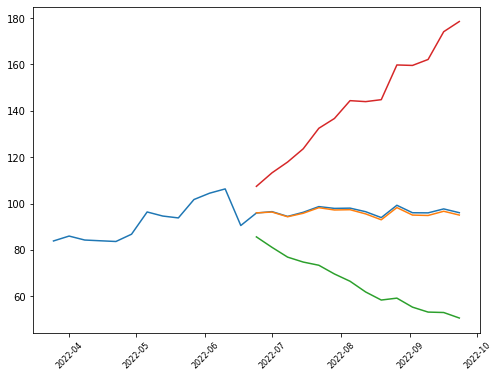

['quarterly_balance_sheet',                              2022-03-31    2021-12-31    2021-09-30  \
Intangible Assets          8.190000e+08  8.130000e+08  8.220000e+08   
Capital Surplus            1.966700e+10  2.050400e+10  2.048800e+10   
Total Liab                 3.851700e+10  3.395700e+10  3.581000e+10   
Total Stockholder Equity   2.181500e+10  1.916600e+10  1.813900e+10   
Minority Interest          3.060000e+08  2.471000e+09  2.458000e+09   
Other Current Liab         1.467000e+09  1.406000e+09  1.346000e+09   
Total Assets               6.063800e+10  5.559400e+10  5.640700e+10   
Common Stock               7.000000e+06  7.000000e+06  6.000000e+06   
Other Current Assets       2.020000e+08  9.900000e+07  3.200000e+07   
Retained Earnings          1.639100e+10  1.621600e+10  1.535000e+10   
Other Liab                 7.031000e+09  7.472000e+09  7.239000e+09   
Good Will                  1.484000e+09  1.484000e+09  1.425000e+09   
Treasury Stock            -1.425000e+10 -1.756100

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,443.929993,440.378773,462.968095,485.557416,457.224603,10.945286,435.33403,479.115175


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
NOC,0.996341,443.929993,18840431.25,0.769029,0.762454,0.423677


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -141.5800018310547
Sector Volume Factor: 0.8696853533786545
Sector Risk Trend Factor: -4.514668337867341
Index 1YMF: -287.8400573730469
Index Volume Factor: 1.1835166983613057
Index Risk Trend Factor: -3.791860877423899


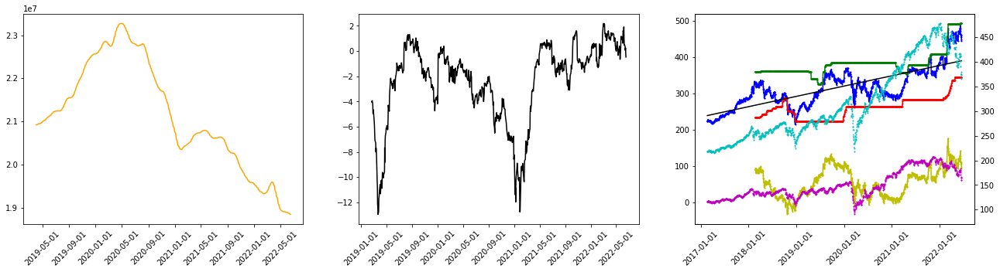

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: [None, None]
best inner cv score, sdev (11 folds): 1037.1044364754455 887.0591236372442
test cv mean error, stdev (10 folds): 1104.5418414308785 903.070007392854
sell date: 2022-06-24
expected return: 0.004203311359570917
discounted return: 0.0006993281031300036
quarter return: 1.0664290164326926


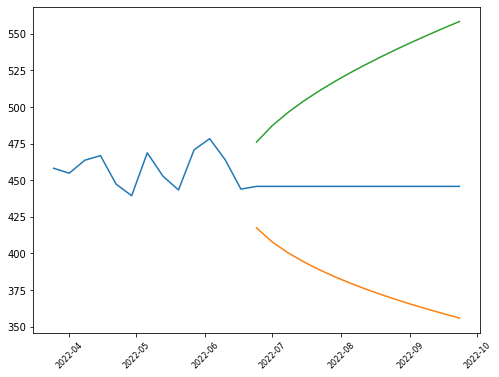

['quarterly_balance_sheet',                                     2022-03-31    2021-12-31    2021-09-30  \
Intangible Assets                 5.330000e+08  5.780000e+08  6.290000e+08   
Total Liab                        2.861600e+10  2.965300e+10  3.092900e+10   
Total Stockholder Equity          1.328700e+10  1.292600e+10  1.141700e+10   
Other Current Liab                5.261000e+09  4.842000e+09  4.583000e+09   
Total Assets                      4.190300e+10  4.257900e+10  4.234600e+10   
Common Stock                      1.560000e+08  1.560000e+08  1.590000e+08   
Retained Earnings                 1.327700e+10  1.291300e+10  1.139800e+10   
Other Liab                        5.280000e+09  5.756000e+09  7.969000e+09   
Good Will                         1.752300e+10  1.751500e+10  1.751600e+10   
Treasury Stock                   -1.460000e+08 -1.430000e+08 -1.400000e+08   
Other Assets                      2.572000e+09  2.093000e+09  2.038000e+09   
Cash                              2.

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,72.900002,69.379346,74.933492,80.487639,73.35127,3.022209,67.306851,79.395688


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
SNEX,1.141643,72.900002,1444321.875,0.751221,0.686282,0.374695


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


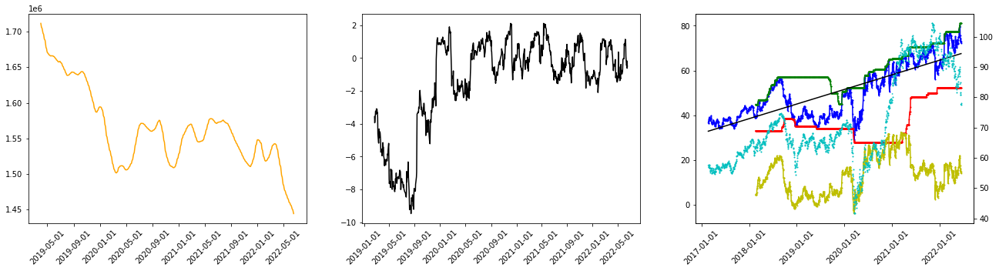

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: [None, 'mul', True]
best inner cv score, sdev (11 folds): 60.19721421430899 70.3914407848702
test cv mean error, stdev (10 folds): 63.77709988290337 72.86619337686182
sell date: 2022-06-24
expected return: 3.6648608282101023e-06
discounted return: 6.108092052148351e-07
quarter return: 1.0000561960086543


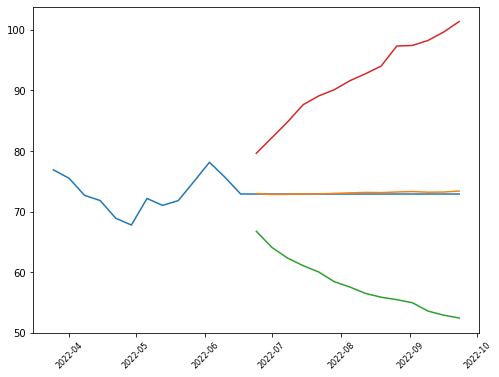

['options', ('2022-07-15',)]
symbol: TALO
sector: Energy
Index: SP600
vol_30d_2yr: 20408781.4453125
Sector 1YMF: -4.379999160766602
1YMF: -4.379999160766602
risk trend factor: -0.4965985614871265
          beta currentRatio debtToEquity     ebitda ebitdaMargins forwardPE  \
TALO  2.369307        0.569      141.375  465148000       0.33517  4.945783   

     freeCashflow grossMargins grossProfits heldPercentInstitutions  \
TALO    236123744      0.80056    957576000                 0.84615   

           industry   marketCap operatingCashflow operatingMargins  \
TALO  Oil & Gas E&P  2032841856         458041984          0.01077   

     payoutRatio priceToBook priceToSalesTrailing12Months profitMargins  \
TALO           0    2.924484                     1.464788      -0.09216   

     quickRatio returnOnAssets returnOnEquity revenueGrowth revenuePerShare  \
TALO      0.505        0.00331       -0.17028         0.551          16.939   

      sector sharesOutstanding shortRatio totalCash

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,18.610001,18.420168,21.889841,25.359515,19.298889,2.422677,14.453534,24.144243


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
TALO,1.661246,18.610001,20408781.445312,0.657711,0.240515,0.536905


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


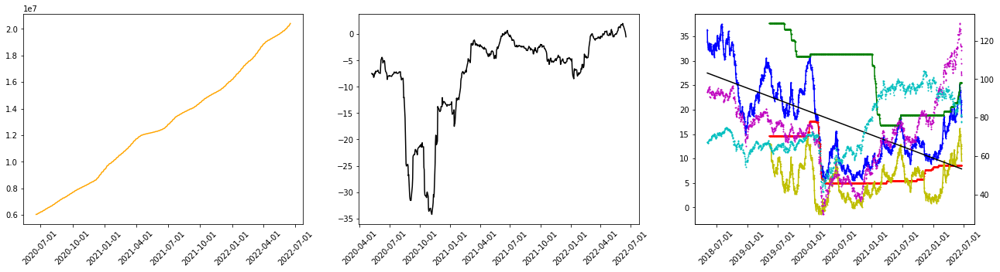

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'add', True]
best inner cv score, sdev (11 folds): 41.43457859222569 71.02454191322182
test cv mean error, stdev (10 folds): 41.43457859222569 71.02454191322182
sell date: 2022-08-26
expected return: 0.2425323205723936
discounted return: 0.0031520804515512424
quarter return: 1.3358066232715167


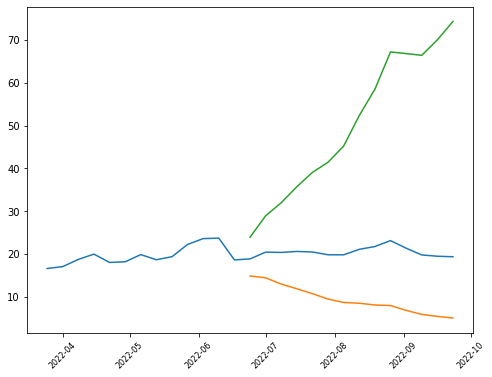

['options', ('2022-07-15',)]
symbol: FANG
sector: Energy
Index: SP500
vol_30d_2yr: 60333589.6484375
Sector 1YMF: -21.420005798339844
1YMF: -21.420005798339844
risk trend factor: -0.5018744567990084
          beta currentRatio debtToEquity dividendRate dividendYield  \
FANG  2.181941         0.72       42.218          2.8        0.0229   

     earningsGrowth      ebitda ebitdaMargins forwardPE freeCashflow  \
FANG          2.278  5171999744       0.67999  5.241749    958625024   

     grossMargins grossProfits heldPercentInstitutions       industry  \
FANG      0.87707   5577000000                 0.91762  Oil & Gas E&P   

        marketCap operatingCashflow operatingMargins payoutRatio pegRatio  \
FANG  21473144832        4572000256           0.5071      0.1272     0.35   

     priceToBook priceToSalesTrailing12Months profitMargins quickRatio  \
FANG    1.703891                     2.823185       0.36037      0.656   

     returnOnAssets returnOnEquity revenueGrowth revenuePerShar

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,122.290001,125.260628,146.419524,167.57842,139.154444,9.491267,120.17191,158.136978


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
FANG,1.13222,122.290001,60333589.648438,0.711781,0.579467,0.467129


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -287.8400573730469
Index Volume Factor: 1.1835166983613057
Index Risk Trend Factor: -3.791860877423899


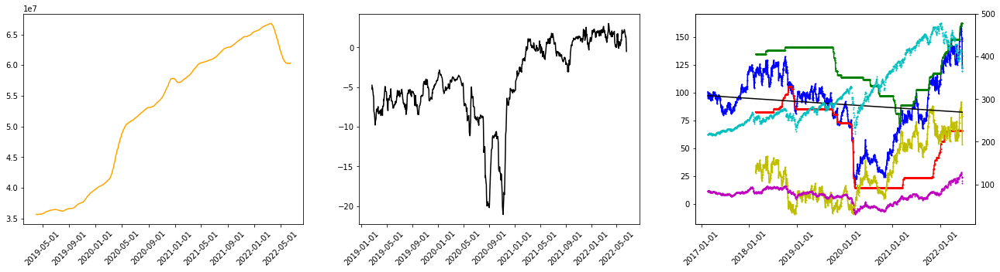

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', 'mul', False]
best inner cv score, sdev (11 folds): 459.00504522356 368.234706520547
test cv mean error, stdev (10 folds): 499.21600299893424 362.45054556208976
sell date: 2022-09-23
expected return: 0.24679453664600268
discounted return: 0.0022765656658614297
quarter return: 1.2326989033199744


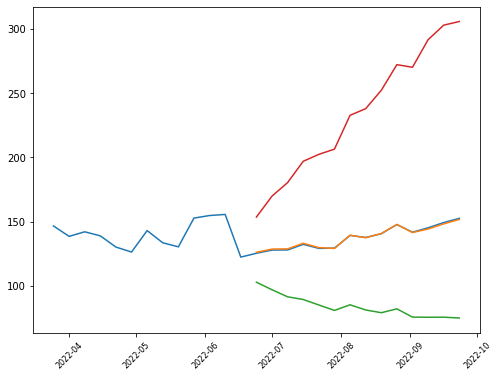

['options', ('2023-01-20', '2024-01-19')]
symbol: CVX
sector: Energy
Index: SP500
vol_30d_2yr: 237499572.65625
Sector 1YMF: -18.379974365234375
1YMF: -18.379974365234375
risk trend factor: -0.5020479120133474
         beta debtToEquity dividendRate dividendYield earningsGrowth  \
CVX  1.135294       24.919         5.68        0.0338          3.473   

          ebitda ebitdaMargins  forwardPE grossMargins grossProfits  \
CVX  38513999872       0.21779  15.602524      0.40935  66234000000   

    heldPercentInstitutions              industry     marketCap  \
CVX                 0.65877  Oil & Gas Integrated  286030659584   

    operatingCashflow operatingMargins payoutRatio pegRatio priceToBook  \
CVX       33087000576          0.12197      0.5113      0.6    2.105308   

    priceToSalesTrailing12Months profitMargins revenueGrowth revenuePerShare  \
CVX                     1.617418       0.11596         0.683          92.025   

     sector sharesOutstanding shortRatio   totalCash tot

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,148.380005,156.731372,171.950159,187.168946,166.72357,7.044224,152.635122,180.812018


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
CVX,1.062215,148.380005,237499572.65625,0.709826,0.669116,0.489773


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -287.8400573730469
Index Volume Factor: 1.1835166983613057
Index Risk Trend Factor: -3.791860877423899


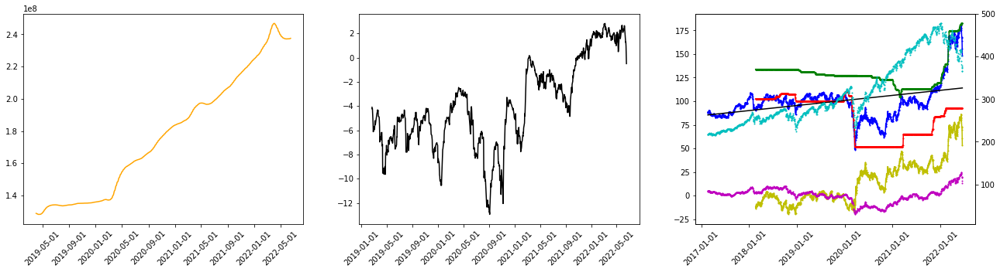

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: [None, 'mul', False]
best inner cv score, sdev (11 folds): 352.4866951142436 497.09405047335423
test cv mean error, stdev (10 folds): 384.720340150738 510.27802944767166
sell date: 2022-09-23
expected return: 0.04798558163709821
discounted return: 0.00048331085835640053
quarter return: 1.045456735419723


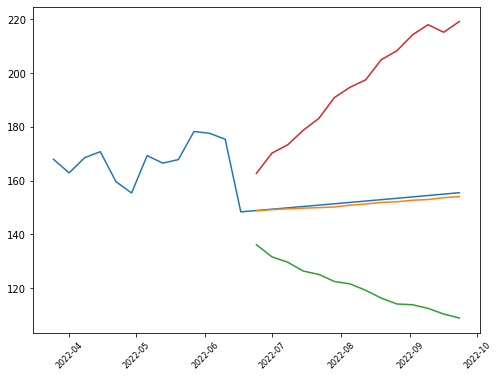

['quarterly_balance_sheet',                                     2022-03-31    2021-12-31    2021-09-30  \
Total Stockholder Equity          1.390670e+11  1.390670e+11  1.358620e+11   
Net Tangible Assets               1.346820e+11  1.346820e+11  1.314600e+11   
Capital Surplus                            NaN  1.728200e+10  1.706200e+10   
Total Liab                                 NaN  9.959500e+10  1.032260e+11   
Minority Interest                          NaN  8.730000e+08  8.600000e+08   
Deferred Long Term Liab                    NaN  2.235000e+09  1.096200e+10   
Other Current Liab                         NaN  1.700000e+09  1.467000e+09   
Total Assets                               NaN  2.395350e+11  2.399480e+11   
Common Stock                               NaN  1.832000e+09  1.832000e+09   
Other Current Assets                       NaN  5.840000e+08  6.500000e+08   
Retained Earnings                          NaN  1.655460e+11  1.630440e+11   
Other Liab                          

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,26.540001,28.387845,33.230635,38.073425,30.302698,2.942304,24.418091,36.187306


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
CTRA,1.576163,26.540001,166901859.960938,0.550516,0.135656,0.459926


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -287.8400573730469
Index Volume Factor: 1.1835166983613057
Index Risk Trend Factor: -3.791860877423899


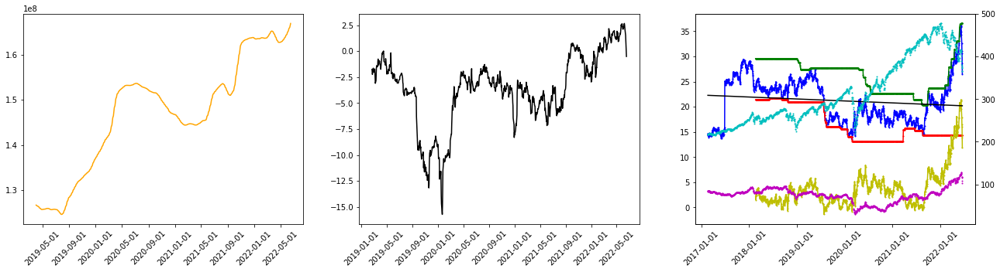

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', 'mul', True]
best inner cv score, sdev (11 folds): 10.275293829952599 11.188755969533434
test cv mean error, stdev (10 folds): 11.197177027146749 11.329542410812056
sell date: 2022-06-24
expected return: 0.07910851111841205
discounted return: 0.012770057541949376
quarter return: 3.2136492511014567


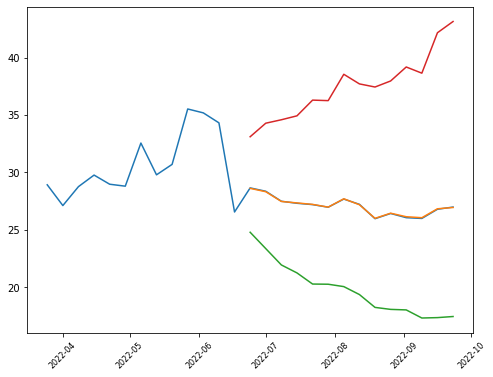

['quarterly_balance_sheet',                              2021-12-31    2021-09-30    2021-06-30  \
Capital Surplus            1.091100e+10  1.823373e+09  1.815770e+09   
Total Liab                 8.112000e+09  2.404585e+09  2.310672e+09   
Total Stockholder Equity   1.173800e+10  2.326112e+09  2.299895e+09   
Deferred Long Term Liab    5.000000e+06  5.329000e+06  5.844000e+06   
Other Current Liab         1.880000e+08  2.128940e+08  7.719900e+07   
Total Assets               1.990000e+10  4.730697e+09  4.610567e+09   
Common Stock               8.900000e+07  4.786200e+07  4.786200e+07   
Other Current Assets       2.400000e+07  1.323500e+07  1.540000e+07   
Retained Earnings          2.563000e+09  2.276071e+09  2.257320e+09   
Other Liab                 3.512000e+09  9.650310e+08  9.577370e+08   
Treasury Stock            -1.825000e+09 -1.821194e+09 -1.821057e+09   
Other Assets               7.200000e+07  3.109900e+07  3.170800e+07   
Cash                       1.036000e+09  7.627000

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,150.089996,127.330989,151.813809,176.296629,158.647302,10.32126,138.004781,179.289823


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
DLTR,1.139688,150.089996,54464099.804688,0.708383,0.508611,0.437414


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -74.80001831054688
Sector Volume Factor: 1.4135920452708397
Sector Risk Trend Factor: -2.283970024749523
Index 1YMF: -287.8400573730469
Index Volume Factor: 1.1835166983613057
Index Risk Trend Factor: -3.791860877423899


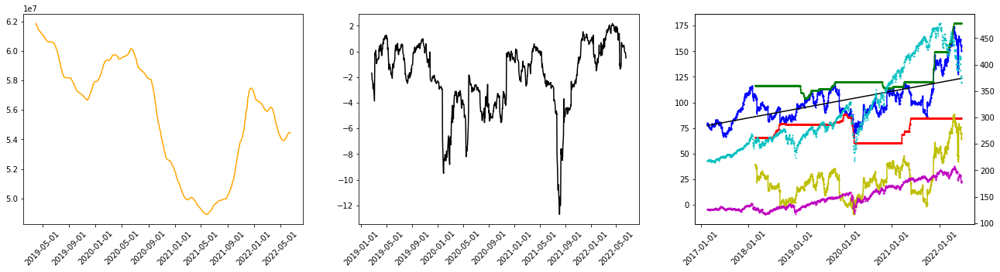

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', None]
best inner cv score, sdev (11 folds): 229.27743607804805 335.55903595508755
test cv mean error, stdev (10 folds): 230.18290981156468 351.9244728101693
sell date: 2022-06-24
expected return: -0.015703056620404568
discounted return: -0.002634466307904315
quarter return: 0.7845141098835329


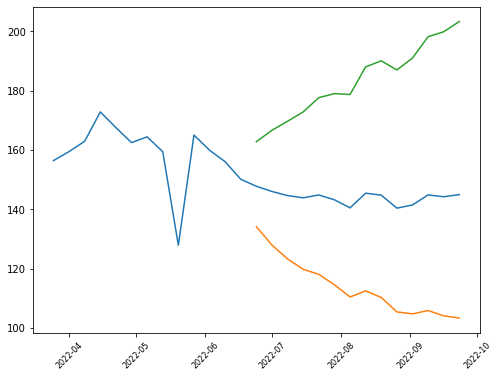

['options', ('2022-08-19', '2023-01-20', '2024-01-19')]
['sustainability',                             Value
2022-5                           
palmOil                     False
controversialWeapons        False
gambling                    False
socialScore                  7.41
nuclear                     False
furLeather                  False
alcoholic                   False
gmo                         False
catholic                    False
socialPercentile             None
peerCount                      57
governanceScore              4.27
environmentPercentile        None
animalTesting               False
tobacco                     False
totalEsg                    15.08
highestControversy              2
esgPerformance         UNDER_PERF
coal                        False
pesticides                  False
adult                       False
percentile                   9.94
peerGroup               Retailing
smallArms                   False
environmentScore              3.4
governa

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,134.259995,126.522812,140.06127,153.599727,140.494604,6.235211,128.024183,152.965025


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
EXLS,1.162846,134.259995,3597554.296875,0.786612,0.946996,0.378357


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


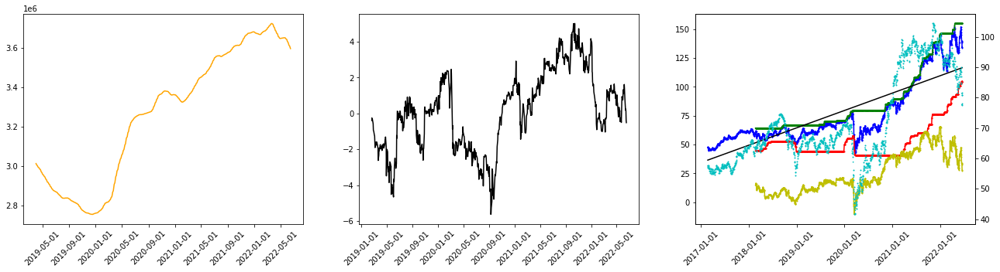

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', 'add', False]
best inner cv score, sdev (11 folds): 195.43581797354952 180.93710581168216
test cv mean error, stdev (10 folds): 207.6343054057983 185.40557120722215
sell date: 2022-08-26
expected return: 0.03011038499345682
discounted return: 0.00043003398008045757
quarter return: 1.0403473230400018


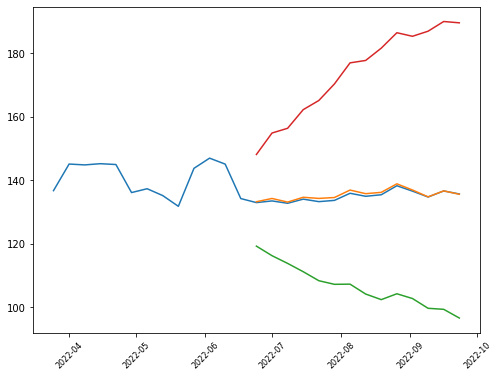

['options', ('2022-07-15',)]
symbol: PDCE
sector: Energy
Index: SP400
vol_30d_2yr: 24813862.890625
Sector 1YMF: -14.360000610351562
1YMF: -14.360000610351562
risk trend factor: -0.5396467599014401
          beta currentRatio debtToEquity dividendRate dividendYield  \
PDCE  2.922058        0.498       32.834            1        0.0155   

          ebitda ebitdaMargins forwardPE freeCashflow grossMargins  \
PDCE  1278352000       0.53439  6.465069    661902144      0.88251   

     grossProfits heldPercentInstitutions       industry   marketCap  \
PDCE   2111095000                 0.96343  Oil & Gas E&P  6308347904   

     operatingCashflow operatingMargins payoutRatio pegRatio priceToBook  \
PDCE        1547795968          0.26364      0.1225     0.14    2.480472   

     priceToSalesTrailing12Months profitMargins quickRatio returnOnAssets  \
PDCE                     2.637096       0.21834       0.47        0.07455   

     returnOnEquity revenueGrowth revenuePerShare  sector sharesOu

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,64.779999,63.693839,77.329841,90.965843,73.805873,5.730229,62.345416,85.26633


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
PDCE,1.314132,64.779999,24813862.890625,0.689138,0.390825,0.487351


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -69.05999755859375
Index Volume Factor: 0.5765983741853883
Index Risk Trend Factor: -5.134573474205833


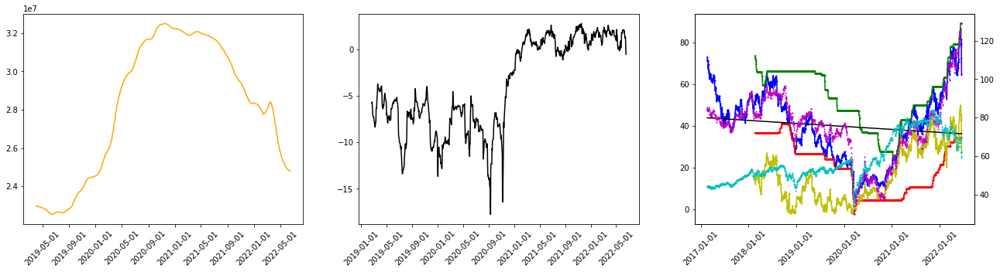

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'add', True]
best inner cv score, sdev (11 folds): 66.2456111050472 64.8590761857845
test cv mean error, stdev (10 folds): 70.97253672099464 66.1937233826639
sell date: 2022-08-26
expected return: 0.22468519510228271
discounted return: 0.0029417652978513953
quarter return: 1.310285566530066


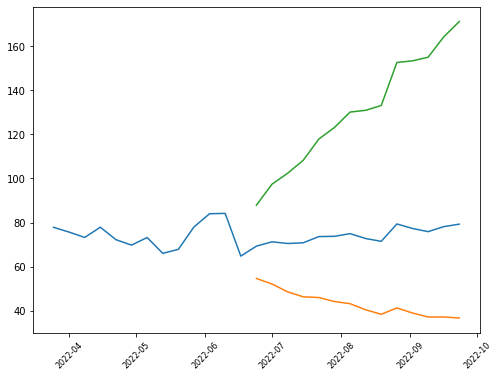

['quarterly_balance_sheet',                              2021-12-31    2021-09-30    2021-06-30  \
Capital Surplus            3.161941e+09  3.267261e+09  3.333168e+09   
Total Liab                 2.426419e+09  2.823041e+09  2.869083e+09   
Total Stockholder Equity   2.910247e+09  2.544224e+09  2.464906e+09   
Deferred Long Term Liab    1.690000e+07  5.600000e+06  6.400000e+06   
Other Current Liab         6.228770e+08  7.500000e+08  6.521060e+08   
Total Assets               5.336666e+09  5.367265e+09  5.333989e+09   
Common Stock               9.650000e+05  9.740000e+05  9.890000e+05   
Other Current Assets       1.790900e+07  7.559000e+06  5.146000e+06   
Retained Earnings         -2.499540e+08 -7.230170e+08 -8.683380e+08   
Other Liab                 5.579650e+08  5.186080e+08  4.555700e+08   
Treasury Stock            -2.705000e+06 -9.940000e+05 -9.130000e+05   
Other Assets               5.559800e+07  4.755700e+07  4.764500e+07   
Cash                       3.382900e+07  9.992200

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,89.279999,86.281435,90.769753,95.25807,88.833085,2.791169,83.250748,94.415422


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
SAFT,1.224409,89.279999,1389322.851562,0.813017,0.355619,0.426824


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


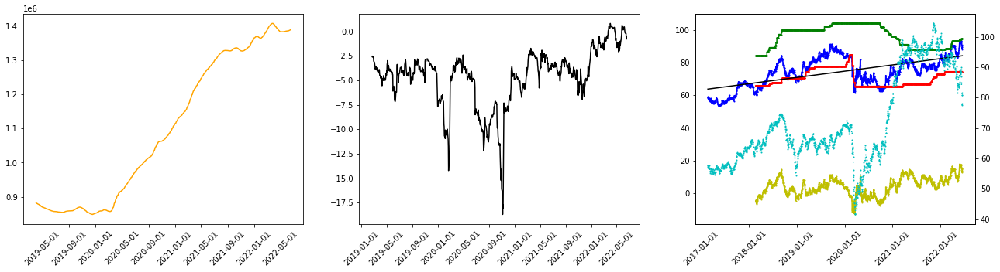

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', 'mul', False]
best inner cv score, sdev (11 folds): 44.584910960896444 46.35750841305056
test cv mean error, stdev (10 folds): 48.48701673436766 46.86612367659447
sell date: 2022-08-12
expected return: 0.07156331651840256
discounted return: 0.0012574922659944754
quarter return: 1.1225654094938735


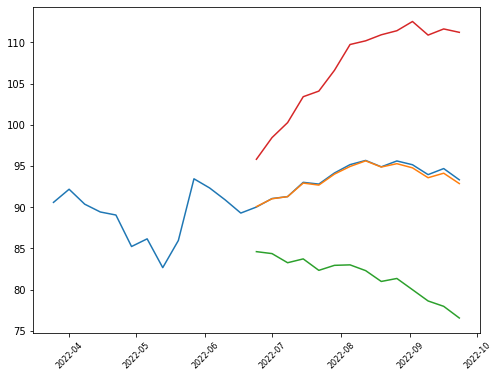

['options', ('2022-08-19',)]
symbol: RRC
sector: Energy
Index: SP400
vol_30d_2yr: 120549255.6640625
Sector 1YMF: -6.6699981689453125
1YMF: -6.6699981689453125
risk trend factor: -0.5642977510548108
         beta currentRatio debtToEquity     ebitda ebitdaMargins forwardPE  \
RRC  1.988656        0.246      162.685  458860992       0.11425  5.124756   

    freeCashflow grossMargins grossProfits heldPercentInstitutions  \
RRC    838692352      0.57877   1937478000                  0.8719   

          industry   marketCap operatingCashflow operatingMargins payoutRatio  \
RRC  Oil & Gas E&P  7092963328        1090109952          0.02264           0   

    pegRatio priceToBook priceToSalesTrailing12Months profitMargins  \
RRC     0.29    3.976706                     1.766035      -0.01797   

    quickRatio returnOnAssets returnOnEquity revenueGrowth revenuePerShare  \
RRC      0.238        0.00892       -0.04423         0.637          16.483   

     sector sharesOutstanding shortRatio 

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,26.290001,26.463464,32.556032,38.6486,31.029206,2.69788,25.633446,36.424967


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
RRC,0.930726,26.290001,120549255.664062,0.655439,0.472816,0.488191


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -69.05999755859375
Index Volume Factor: 0.5765983741853883
Index Risk Trend Factor: -5.134573474205833


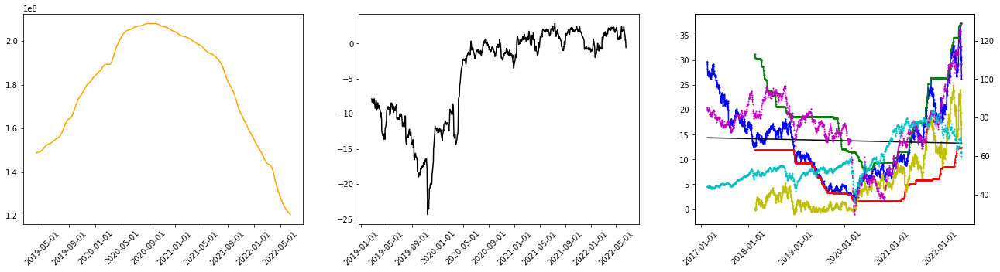

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', 'add', True]
best inner cv score, sdev (11 folds): 11.350390168992813 13.920119243670639
test cv mean error, stdev (10 folds): 12.432074723522295 14.151899495550747
sell date: 2022-09-23
expected return: 0.11935487431357858
discounted return: 0.0011630728996809836
quarter return: 1.1128680691380008


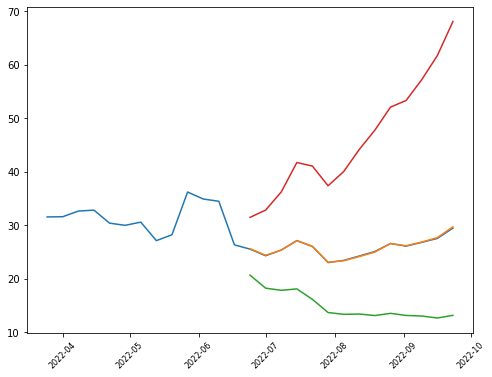

['options', ('2023-01-20', '2024-01-19')]
['sustainability',                                      Value
2022-5                                    
palmOil                              False
controversialWeapons                 False
gambling                             False
socialScore                           None
nuclear                              False
furLeather                           False
alcoholic                            False
gmo                                  False
catholic                             False
socialPercentile                      None
peerCount                               66
governanceScore                       None
environmentPercentile                 None
animalTesting                        False
tobacco                              False
totalEsg                             33.07
highestControversy                       2
esgPerformance                    OUT_PERF
coal                                 False
pesticides                          

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,102.870003,107.522864,120.951428,134.379992,113.081428,7.84924,97.382949,128.779908


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
HES,1.067832,102.870003,48039294.53125,0.704306,0.762574,0.442601


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -287.8400573730469
Index Volume Factor: 1.1835166983613057
Index Risk Trend Factor: -3.791860877423899


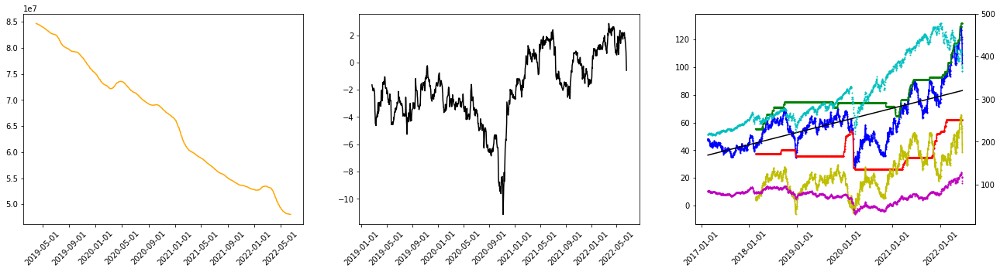

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', 'mul', True]
best inner cv score, sdev (11 folds): 184.05304053720195 131.95906986819597
test cv mean error, stdev (10 folds): 199.07107564373396 129.1262572686663
sell date: 2022-09-16
expected return: 0.18915992113788566
discounted return: 0.0019268218200787501
quarter return: 1.1937469346305718


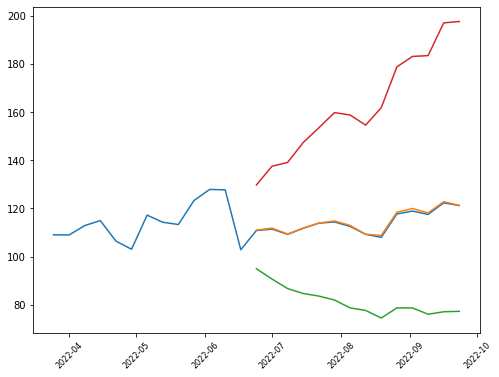

['quarterly_balance_sheet',                                     2022-03-31    2021-12-31    2021-09-30  \
Total Liab                        1.275000e+10  1.348900e+10  1.323400e+10   
Total Stockholder Equity          6.308000e+09  6.300000e+09  5.609000e+09   
Minority Interest                 7.400000e+08  7.260000e+08  6.470000e+08   
Other Current Liab                2.190000e+09  1.193000e+09  9.330000e+08   
Total Assets                      1.979800e+10  2.051500e+10  1.949000e+10   
Common Stock                      7.074000e+09  3.100000e+08  3.100000e+08   
Other Current Assets              1.896000e+09  1.990000e+08  1.180000e+08   
Other Liab                        1.937000e+09  1.890000e+09  1.877000e+09   
Treasury Stock                   -7.660000e+08 -4.060000e+08 -7.960000e+08   
Other Assets                      1.560000e+09  1.129000e+09  7.660000e+08   
Cash                              1.370000e+09  2.713000e+09  2.419000e+09   
Total Current Liabilities         2.

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,263.089996,245.480961,263.090794,280.700626,264.090635,12.86454,238.361554,289.819715


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
VRTX,0.879467,263.089996,38800428.125,0.668594,0.264015,0.438798


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -122.20997619628906
Sector Volume Factor: 1.2238851152317325
Sector Risk Trend Factor: -3.3236323632363236
Index 1YMF: -287.8400573730469
Index Volume Factor: 1.1835166983613057
Index Risk Trend Factor: -3.791860877423899


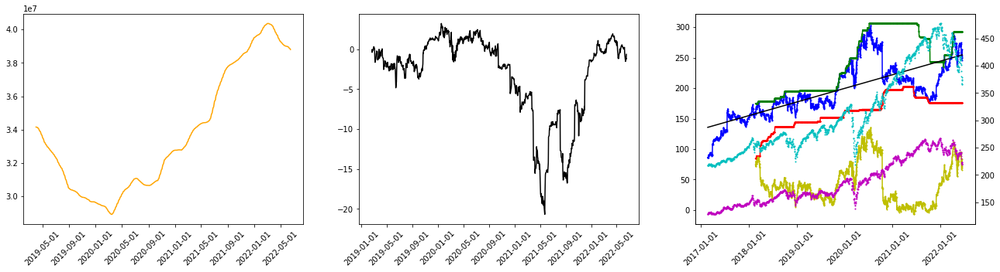

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'add', True]
best inner cv score, sdev (11 folds): 1124.9774062203103 1540.4240204902003
test cv mean error, stdev (10 folds): 1046.6926575477005 1594.6105683465257
sell date: 2022-08-05
expected return: 0.10078056003004886
discounted return: 0.002002408985750437
quarter return: 1.2020608142130922


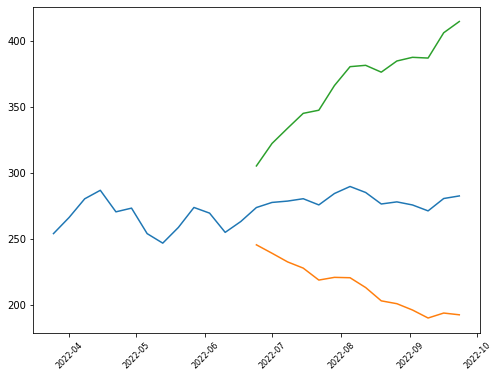

['options', ('2022-07-15', '2022-09-16', '2023-01-20', '2024-01-19', '2026-03-20')]
['sustainability',                                  Value
2022-5                                
palmOil                          False
controversialWeapons             False
gambling                         False
socialScore                      15.22
nuclear                          False
furLeather                       False
alcoholic                        False
gmo                              False
catholic                          True
socialPercentile                  None
peerCount                           83
governanceScore                    7.4
environmentPercentile             None
animalTesting                     True
tobacco                          False
totalEsg                         23.33
highestControversy                   2
esgPerformance                AVG_PERF
coal                             False
pesticides                       False
adult                            False


,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,44.139999,42.492536,44.943651,47.394766,42.266984,2.620388,37.026208,47.50776


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
HALO,0.928279,44.139999,23895179.6875,0.628597,0.811654,0.443799


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -122.20997619628906
Sector Volume Factor: 1.2238851152317325
Sector Risk Trend Factor: -3.3236323632363236
Index 1YMF: -69.05999755859375
Index Volume Factor: 0.5765983741853883
Index Risk Trend Factor: -5.134573474205833


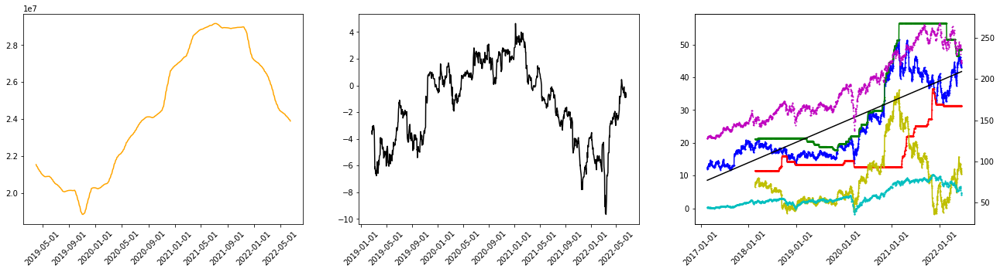

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'mul', True]
best inner cv score, sdev (11 folds): 24.150450995704862 24.173104041641793
test cv mean error, stdev (10 folds): 26.226303504889792 24.400247036284366
sell date: 2022-09-16
expected return: 0.06919154943054201
discounted return: 0.000743640826211367
quarter return: 1.0707823296696473


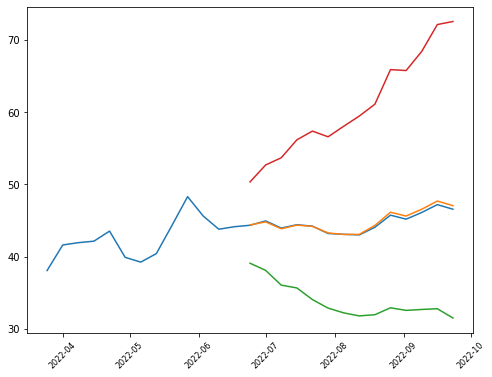

['quarterly_balance_sheet',                                     2021-12-31    2021-09-30    2021-06-30  \
Capital Surplus                   2.563470e+08  4.072290e+08  4.618970e+08   
Total Liab                        9.074760e+08  9.037460e+08  9.061150e+08   
Total Stockholder Equity          1.969530e+08  2.816740e+08  1.197480e+08   
Other Current Liab                1.746000e+06  2.245000e+06  1.247000e+06   
Total Assets                      1.104429e+09  1.185420e+09  1.025863e+09   
Common Stock                      1.380000e+05  1.410000e+05  1.420000e+05   
Retained Earnings                -5.891200e+07 -1.256820e+08 -3.422670e+08   
Other Liab                        2.965000e+06  2.530000e+06  4.026000e+06   
Treasury Stock                   -6.200000e+05 -1.400000e+04 -2.400000e+04   
Other Assets                      1.693480e+08  1.585330e+08  1.598100e+07   
Cash                              1.187190e+08  4.916830e+08  4.469660e+08   
Total Current Liabilities         1.

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,234.559998,232.555741,252.299205,272.042669,250.260634,9.078125,232.104383,268.416885


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
CSL,0.893561,234.559998,6905512.5,0.754731,0.961206,0.453537


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -141.5800018310547
Sector Volume Factor: 0.8696853533786545
Sector Risk Trend Factor: -4.514668337867341
Index 1YMF: -69.05999755859375
Index Volume Factor: 0.5765983741853883
Index Risk Trend Factor: -5.134573474205833


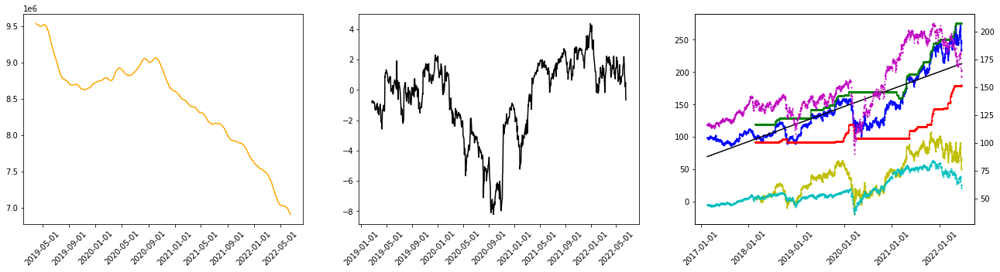

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: [None, 'mul', False]
best inner cv score, sdev (11 folds): 497.44209929377934 367.5632189484563
test cv mean error, stdev (10 folds): 491.75210128490096 385.0414039130602
sell date: 2022-09-23
expected return: 0.05922921392781611
discounted return: 0.0005933871901875332
quarter return: 1.056092135407889


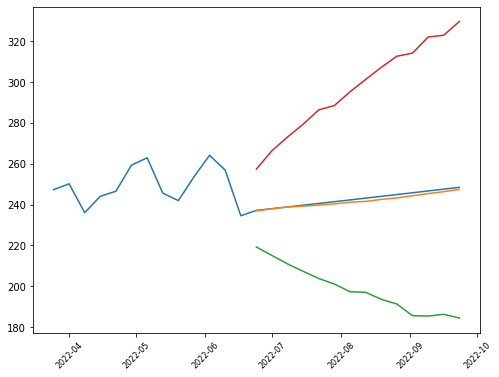

['quarterly_balance_sheet',                                     2022-03-31    2021-12-31    2021-09-30  \
Intangible Assets                 1.980900e+09  2.008700e+09  1.599400e+09   
Capital Surplus                   4.835000e+08  4.815000e+08  4.738000e+08   
Total Liab                        4.644400e+09  4.617300e+09  4.529800e+09   
Total Stockholder Equity          2.678600e+09  2.629500e+09  2.544800e+09   
Other Current Liab                8.220000e+07  8.010000e+07  7.060000e+07   
Total Assets                      7.323000e+09  7.246800e+09  7.074600e+09   
Common Stock                      7.870000e+07  7.870000e+07  7.870000e+07   
Other Current Assets              9.020000e+07  2.848000e+08  2.512000e+08   
Retained Earnings                 4.402600e+09  4.237700e+09  4.137900e+09   
Other Liab                        8.791000e+08  8.080000e+08  7.545000e+08   
Good Will                         2.215000e+09  2.199000e+09  2.539500e+09   
Treasury Stock                   -2.

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,65.440002,66.196732,71.468095,76.739458,70.233492,2.539221,65.155049,75.311934


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
NFG,1.09896,65.440002,10051408.984375,0.723622,0.865522,0.460844


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -69.05999755859375
Index Volume Factor: 0.5765983741853883
Index Risk Trend Factor: -5.134573474205833


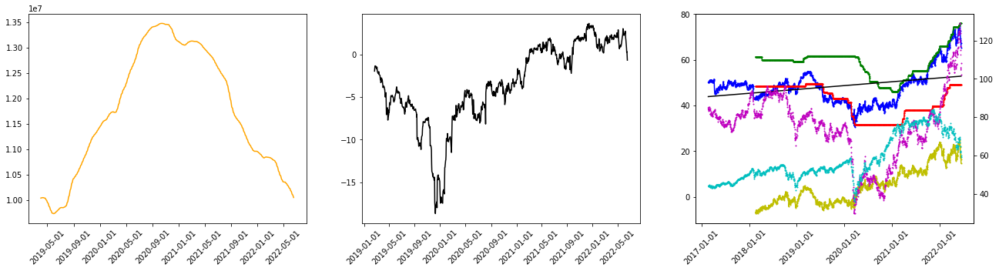

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', 'mul', True]
best inner cv score, sdev (11 folds): 18.32475491962216 15.305691880232668
test cv mean error, stdev (10 folds): 19.915628892149904 15.16655093435223
sell date: 2022-08-05
expected return: 0.09478769729193245
discounted return: 0.0018884571584556475
quarter return: 1.1895489675093711


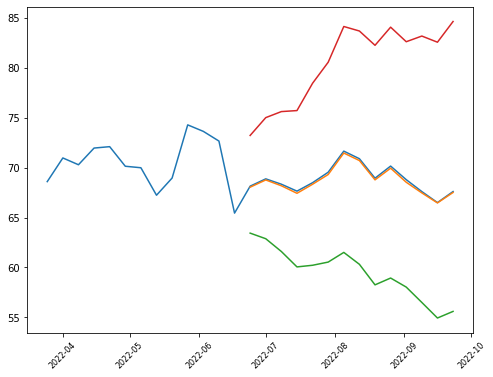

['options', ('2022-07-15',)]
symbol: CAL
sector: Consumer Cyclical
Index: SP600
vol_30d_2yr: 13624561.71875
Sector 1YMF: -7.140003204345703
1YMF: -7.140003204345703
risk trend factor: -0.6945527944974851
         beta currentRatio debtToEquity dividendRate dividendYield  \
CAL  2.076225        0.873      244.795         0.28        0.0105   

    earningsGrowth     ebitda ebitdaMargins forwardPE freeCashflow  \
CAL           7.25  301993984       0.10507  5.692308     52809000   

    grossMargins grossProfits heldPercentInstitutions                industry  \
CAL      0.44516   1227317000                 0.94973  Footwear & Accessories   

     marketCap operatingCashflow operatingMargins payoutRatio pegRatio  \
CAL  978686976         117749000           0.0892      0.0593     0.45   

    priceToBook priceToSalesTrailing12Months profitMargins quickRatio  \
CAL    2.832235                     0.340521       0.06311      0.212   

    returnOnAssets returnOnEquity revenueGrowth revenue

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,26.639999,22.454831,27.003651,31.55247,23.73746,3.136263,17.464934,30.009987


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
CAL,1.602114,26.639999,13624561.71875,0.862213,0.418598,0.505598


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -359.96002197265625
Sector Volume Factor: 1.2928194874233667
Sector Risk Trend Factor: -4.72140697901556
Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


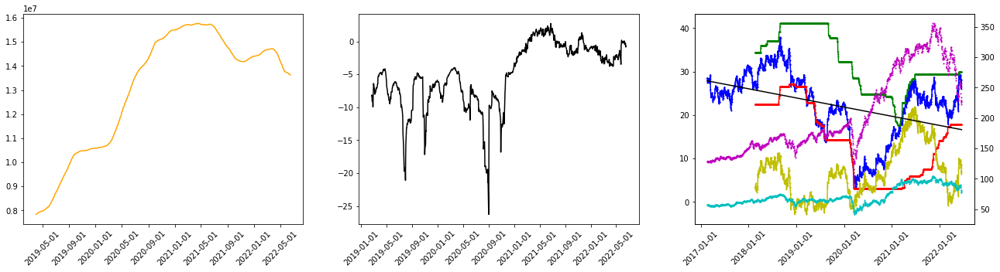

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['mul', 'mul', True]
best inner cv score, sdev (11 folds): 17.57251282551596 17.244721751582233
test cv mean error, stdev (10 folds): 19.098450198852767 17.3639033916298
sell date: 2022-07-22
expected return: 0.14002055143421874
discounted return: 0.0038617400183567074
quarter return: 1.4256043699011531


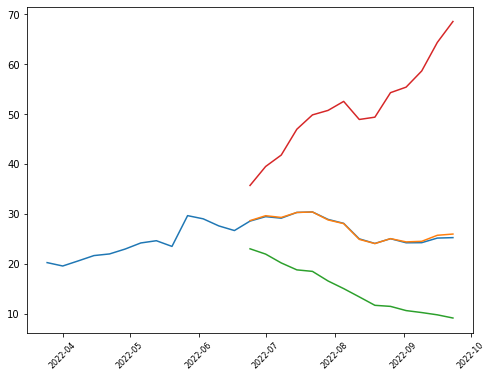

['quarterly_balance_sheet',                              2022-01-29    2021-10-30    2021-07-31  \
Intangible Assets          2.443470e+08  2.256690e+08  2.288210e+08   
Capital Surplus            1.688300e+08  1.654750e+08  1.621220e+08   
Total Liab                 1.520539e+09  1.568813e+09  1.587607e+09   
Total Stockholder Equity   3.185700e+08  3.010980e+08  2.406970e+08   
Minority Interest          4.817000e+06  4.647000e+06  4.594000e+06   
Other Current Liab         2.802200e+07  8.162900e+07  7.465000e+07   
Total Assets               1.843926e+09  1.874558e+09  1.832898e+09   
Common Stock               3.760000e+05  3.830000e+05  3.830000e+05   
Other Current Assets       1.735500e+07  7.789000e+06  8.361000e+06   
Retained Earnings          1.579700e+08  1.437110e+08  8.676400e+07   
Other Liab                 4.201700e+07  4.596700e+07  4.565200e+07   
Good Will                  4.956000e+06  4.956000e+06  4.956000e+06   
Treasury Stock            -8.606000e+06 -8.471000

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,32.560001,32.487871,35.250159,38.012447,33.449206,2.08965,29.269907,37.628506


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
UNM,0.872299,32.560001,53508487.695312,0.778725,0.43303,0.490172


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -72.2699966430664
Sector Volume Factor: 1.2707168073107045
Sector Risk Trend Factor: -4.617890709055871
Index 1YMF: -69.05999755859375
Index Volume Factor: 0.5765983741853883
Index Risk Trend Factor: -5.134573474205833


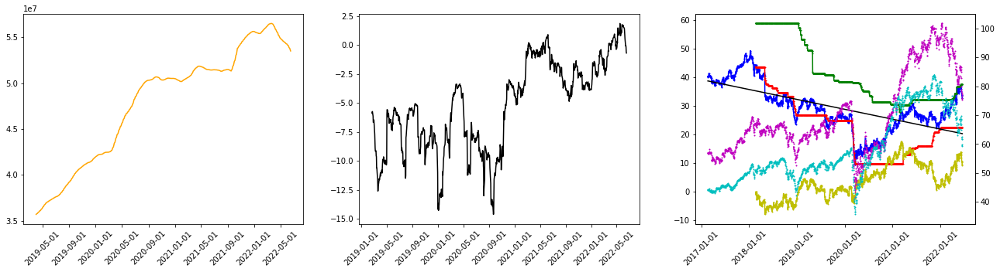

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'add', False]
best inner cv score, sdev (11 folds): 20.10065423888112 26.485586786406316
test cv mean error, stdev (10 folds): 21.693367627808307 27.271433151349527
sell date: 2022-07-22
expected return: 0.052593715434335934
discounted return: 0.001508705287804446
quarter return: 1.1487751489032836


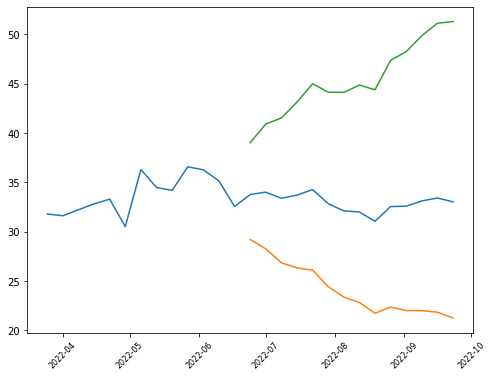

['quarterly_balance_sheet',                              2021-12-31    2021-09-30    2021-06-30  \
Intangible Assets          2.281000e+09  2.231500e+09  2.235700e+09   
Capital Surplus            2.408100e+09  2.398500e+09  2.386800e+09   
Total Liab                 5.869920e+10  5.947970e+10  5.986040e+10   
Total Stockholder Equity   1.141640e+10  1.111820e+10  1.094750e+10   
Other Current Liab         5.717000e+08  5.090000e+08  5.957000e+08   
Total Assets               7.011560e+10  7.059790e+10  7.080790e+10   
Common Stock               3.070000e+07  3.070000e+07  3.070000e+07   
Other Current Assets       1.152200e+10  1.170400e+10  1.202560e+10   
Retained Earnings          1.185320e+10  1.175480e+10  1.148760e+10   
Other Liab                 5.460270e+10  5.552930e+10  5.582330e+10   
Good Will                  3.522000e+08  3.521000e+08  3.533000e+08   
Treasury Stock            -2.875600e+09 -3.065800e+09 -2.957600e+09   
Other Assets               7.966200e+09  7.985200

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,206.029999,204.010093,209.173967,214.337841,217.173016,7.66194,201.849137,232.496895


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
HSY,1.169855,206.029999,19940425.0,0.759001,0.971853,0.450651


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -74.80001831054688
Sector Volume Factor: 1.4135920452708397
Sector Risk Trend Factor: -2.283970024749523
Index 1YMF: -287.8400573730469
Index Volume Factor: 1.1835166983613057
Index Risk Trend Factor: -3.791860877423899


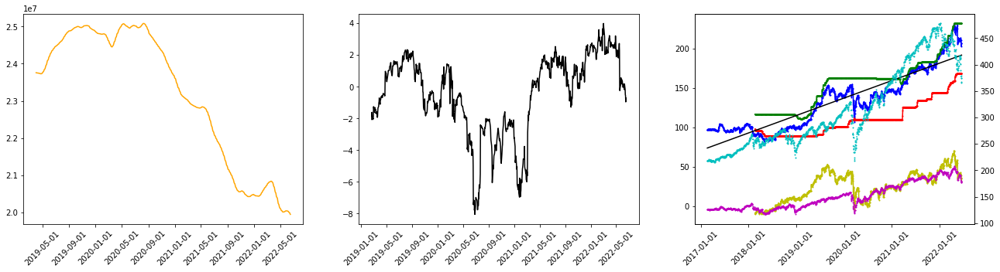

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'mul', True]
best inner cv score, sdev (11 folds): 126.32128598822646 95.57167363837233
test cv mean error, stdev (10 folds): 136.94865844395548 93.83526155947202
sell date: 2022-07-22
expected return: 0.06675063231683906
discounted return: 0.001902314044301745
quarter return: 1.1910635388921387


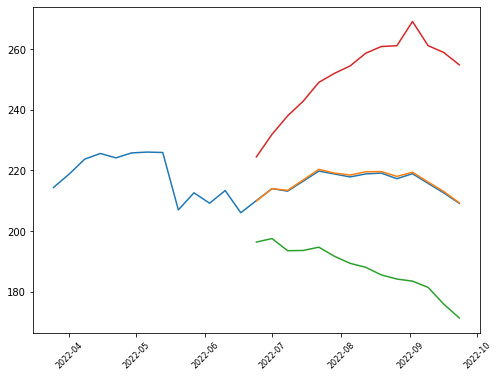

['quarterly_balance_sheet',                                     2022-04-03    2021-12-31    2021-10-03  \
Intangible Assets                 2.309871e+09  2.298244e+09  1.726473e+09   
Capital Surplus                   1.243240e+09  1.260331e+09  1.240012e+09   
Total Liab                        7.729495e+09  7.655002e+09  6.902050e+09   
Total Stockholder Equity          2.915549e+09  2.757229e+09  2.528294e+09   
Other Current Liab                7.963500e+07  3.070000e+06  6.948200e+07   
Total Assets                      1.064504e+10  1.041223e+10  9.439183e+09   
Common Stock                      2.215530e+08  2.215530e+08  2.215530e+08   
Other Current Assets              1.325250e+08  1.276780e+08  1.304180e+08   
Retained Earnings                 3.071416e+09  2.719936e+09  2.565538e+09   
Other Liab                        7.628260e+08  7.641630e+08  7.335690e+08   
Good Will                         2.620594e+09  2.633174e+09  2.164580e+09   
Treasury Stock                   -1.

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,26.34,27.29344,30.785079,34.276719,24.336443,5.440805,13.454833,35.218053


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
GFF,1.243283,26.34,6627450.78125,0.577684,0.073253,0.408627


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -141.5800018310547
Sector Volume Factor: 0.8696853533786545
Sector Risk Trend Factor: -4.514668337867341
Index 1YMF: -77.27001953125
Index Volume Factor: 1.232760496116622
Index Risk Trend Factor: -5.242200185196592


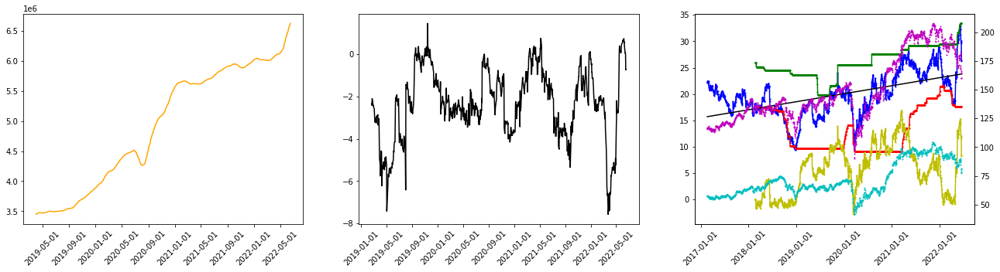

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'add', True]
best inner cv score, sdev (11 folds): 19.47079359884851 25.376167833733334
test cv mean error, stdev (10 folds): 21.26353787148501 25.942082207774813
sell date: 2022-06-24
expected return: 0.02871376697074862
discounted return: 0.0047293569307549355
quarter return: 1.5435349322169172


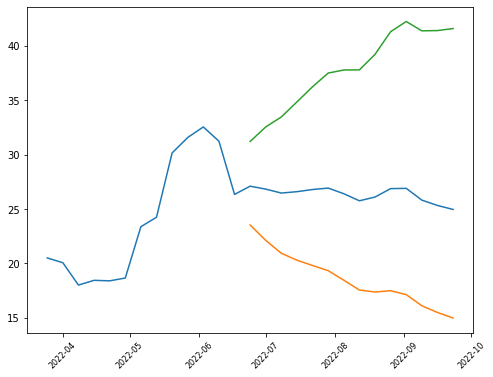

['options', ('2022-07-15',)]
symbol: PXD
sector: Energy
Index: SP500
vol_30d_2yr: 47391610.9375
Sector 1YMF: -50.03999328613281
1YMF: -50.03999328613281
risk trend factor: -0.727748651596503
         beta currentRatio debtToEquity dividendRate dividendYield  \
PXD  1.535843        1.541       25.456        12.34        0.0556   

         ebitda ebitdaMargins forwardPE freeCashflow grossMargins  \
PXD  9187000320       0.43846  7.828098   2404124928      0.53944   

    grossProfits heldPercentInstitutions       industry    marketCap  \
PXD   9392000000                 0.92214  Oil & Gas E&P  53659250688   

    operatingCashflow operatingMargins payoutRatio pegRatio priceToBook  \
PXD        8265999872          0.31175      0.3288     0.46     2.26717   

    priceToSalesTrailing12Months profitMargins quickRatio returnOnAssets  \
PXD                     2.560934        0.2003      1.404        0.12148   

    returnOnEquity revenueGrowth revenuePerShare  sector sharesOutstanding  \
PX

,Adj Close,21dBOLD,21dMA-TP,21dBOLU,90dSMA,90dSDev,90d_lower,90d_upper
2022-06-17,221.770004,243.334843,270.065238,296.795633,256.810952,15.318142,226.174668,287.447237


,volume_factor,latest_p,vol_30d_2yr,pct_2yr,adf,hurst
PXD,1.317982,221.770004,47391610.9375,0.685246,0.678534,0.490016


,legend
blue,symbol
green,trailing_1yr_max
red,trailing_1yr_min
orange,30d_vol_2yr
black,risk_trend_factor/linear
yellow,supply_trend_1yr
,legend
magenta,sector
cyan,index


Sector 1YMF: -3.82000732421875
Sector Volume Factor: 0.8966412344901694
Sector Risk Trend Factor: -0.12330558135216596
Index 1YMF: -287.8400573730469
Index Volume Factor: 1.1835166983613057
Index Risk Trend Factor: -3.791860877423899


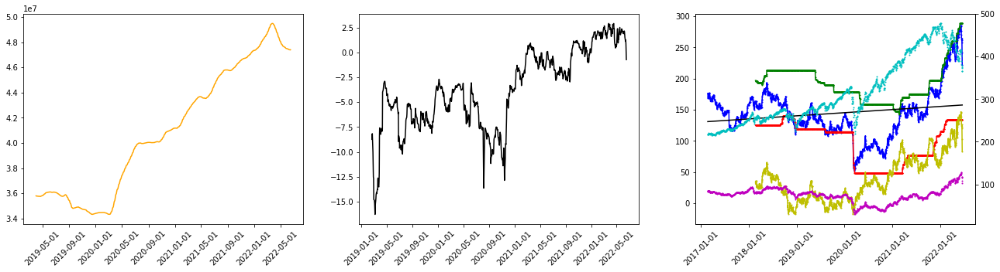

ets next 13 weeks
2022-06-17
2022-06-24
inner cv scores:
best model: ['add', 'mul', True]
best inner cv score, sdev (11 folds): 945.2115858493136 912.1408616277421
test cv mean error, stdev (10 folds): 1035.233622083089 908.8770046115551
sell date: 2022-08-26
expected return: 0.08911694869070397
discounted return: 0.0012379718739679024
quarter return: 1.1205537380651147


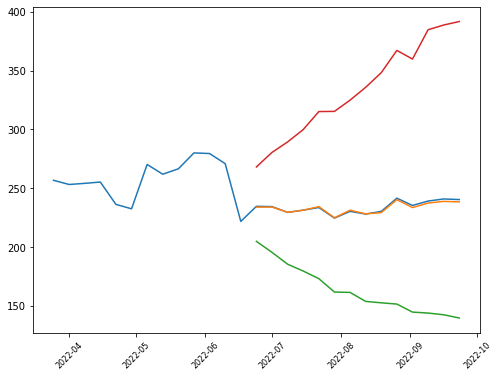

['options', ('2023-01-20', '2024-01-19')]
['sustainability',                                      Value
2022-5                                    
palmOil                              False
controversialWeapons                 False
gambling                             False
socialScore                           8.97
nuclear                              False
furLeather                           False
alcoholic                            False
gmo                                  False
catholic                             False
socialPercentile                      None
peerCount                               66
governanceScore                        9.1
environmentPercentile                 None
animalTesting                        False
tobacco                              False
totalEsg                             36.53
highestControversy                       1
esgPerformance                    OUT_PERF
coal                                 False
pesticides                          

In [88]:
import statsmodels
from statsmodels.tsa.exponential_smoothing.ets import ETSModel

client = Client('192.168.3.100:8786')

#tscv = expanding_window(initial =52*2, horizon = 13,period = 26)

batchClearLimit = round(len(list__)/7)

mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False
 
decision_metrics = []

print("adf < .05 or .01, mean reverting")
print("Hurst")
print("> .5 - The time series is mean reverting.")
print("= .5 - The time series is a Geometric Brownian Motion.")
print("< .5 - The time series is trending.")
"""*spdr_indexes['Symbol'].values,*vanguard_sectors['Symbol'].values,"""

for s in list__:

    #for s in ['CEIX']:
    msize = 2
    date_form = DateFormatter("%Y-%m-%d")

    metrics_df_ = pd.DataFrame(pd.DataFrame(screener.loc[s].dropna()).T[['volume_factor','latest_p','vol_30d_2yr','pct_2yr','adf','hurst']])

    subset=prices[prices['Symbol']==s]

    dates = []
    for t in subset.index.values:
        d = pd.Timestamp(t).strftime('%Y-%m-%d')
        dates.append(d)
        dto = datetime.strptime(d, '%Y-%m-%d').date()

    old_ordinal = [datetime.strptime(i, '%Y-%m-%d').toordinal() for i in dates]
    new_ordinal = old_ordinal + md.date2num(np.datetime64('0000-12-31'))
    x = new_ordinal    

    lookup_index_ = []

    labels = list()
    print("symbol:",s)   

    try:
        symbol_sector = dict_sectors[sector_merged[sector_merged['Symbol']==s]['Sector'].values[0]]
        print("sector:",dict_sectors_reverse[symbol_sector])
    except:
        if(symbol_sector=='error'):
            if(np.sum([vanguard_sectors['Symbol'].values==s])):
                symbol_sector = s
                print("sector:",dict_sectors_reverse[symbol_sector])
        else:
            symbol_sector = 'error'
    if(symbol_sector=='error'):
        if(np.sum([vanguard_sectors['Symbol'].values==s])):
            symbol_sector = s
            print("sector:",dict_sectors_reverse[symbol_sector])
        else:
            symbol_sector = 'error'
            print("sector:",'error')

    symbol_index = temp_sm.loc[s]['index_Symbol']

    try:
        matched_index_name = spdr_indexes.iloc[np.where(spdr_indexes['Symbol'].values==s)].index[0]
    except:
        try:
            matched_index_name = temp_sm.loc[s]['index']
        except:
            matched_index_name = "none"

    print("Index:",matched_index_name)

    print("vol_30d_2yr:",screener.iloc[np.where(screener.index==s)]['vol_30d_2yr'][0])
    #print("1YMF:",subset['1YMF'].values[-1])
    print("Sector 1YMF:",screener[screener.index==s]['1YMF'][0])
    print("1YMF:",screener.iloc[np.where(screener.index==s)]['1YMF'][0])
    print("risk trend factor:",screener.iloc[np.where(screener.index==s)]['risk_trend_factor'][0])

    temp = pd.DataFrame(stock_fundamentals.loc[s])
    print(temp[np.array(temp!='error')].replace([np.inf,'inf','error', -np.inf], np.nan).dropna().T)

    last_date = pd.DataFrame(subset.iloc[-1][['21dBOLD','21dMA-TP','21dBOLU']],index=[prices[prices['Symbol']==s].index[-1].strftime('%Y-%m-%d')]).index[0]

    bbands = pd.DataFrame(subset.iloc[-1][['Adj Close','21dBOLD','21dMA-TP','21dBOLU','90dSMA','90dSDev']]).T
    bbands['90d_lower'] = bbands['90dSMA']-bbands['90dSDev']*2
    bbands['90d_upper'] = bbands['90dSMA']+bbands['90dSDev']*2

    bbands.index = [last_date]
    display(bbands)

    display(metrics_df_)

    mean_revert_flag = False

    if(metrics_df_['adf'][0]<.05):
        print("ADFuller H0 rejected @ .05, Mean Reverting TS")
        if(bbands['Adj Close'][0]<bbands['90d_lower'][0]):
            colored_text = colored(255, 0, 0, "Quarter Mean Reverting buy signal")
            print(colored_text)
            mean_revert_flag = True
        if(bbands['Adj Close'][0]<bbands['21dBOLU'][0]):
            colored_text = colored(255, 0, 0, "Month Mean Reverting buy signal")
            print(colored_text)
            mean_revert_flag = True    

    l_axis_legend = pd.DataFrame(['symbol', 'trailing_1yr_max', 'trailing_1yr_min', '30d_vol_2yr','risk_trend_factor/linear','supply_trend_1yr'],index=['blue','green','red','orange','black','yellow'],columns=['legend'])

    r_axis_legend = pd.DataFrame(['sector','index'],index=['magenta','cyan'],columns=['legend'])

    display_side_by_side([l_axis_legend, r_axis_legend], ['l axis', 'r axis'])        

    f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=False,figsize=(22,5))
    ax1.plot(subset['30d_vol_2yr'],color='orange')
    ax1.set_xticklabels(subset[['30d_vol_2yr']].dropna().index, rotation = 45)

    locator = matplotlib.dates.AutoDateLocator()
    formatter = matplotlib.dates.ConciseDateFormatter(locator)

    ax1.xaxis.set_major_locator(locator)
    ax1.xaxis.set_major_formatter(formatter)


    ax1.xaxis.set_major_formatter(date_form)

    #plt.title('30d_vol_2yr')
    ax2.plot(subset['risk_trend_factor'],color='black')
    ax2.set_xticklabels(subset[['risk_trend_factor']].dropna().index, rotation = 45)

    locator = matplotlib.dates.AutoDateLocator()
    formatter = matplotlib.dates.ConciseDateFormatter(locator)

    ax2.xaxis.set_major_locator(locator)
    ax2.xaxis.set_major_formatter(formatter)

    ax2.xaxis.set_major_formatter(date_form)
    #plt.title('risk_trend_factor')

    #fig, ax1 = plt.subplots()   

    ax4 = ax3.twinx()

    if(symbol_sector=='error'):
        pass
    else:
        if(np.sum(vanguard_sectors['Symbol'].values==s)>0):
            pass
        else:
            #print("sector",)
            #print("else_sector:",dict_sectors_reverse[s])            
            print("Sector 1YMF:",screener[screener.index==symbol_sector]['1YMF'][0])
            print("Sector Volume Factor:",screener.iloc[np.where(screener.index==symbol_sector)]['volume_factor'][0])
            print("Sector Risk Trend Factor:",screener.iloc[np.where(screener.index==symbol_sector)]['risk_trend_factor'][0])
            ax4.plot(x, (prices[prices['Symbol']==symbol_sector]['Adj Close']).iloc[-len(subset):],marker = '.',markersize=msize,color='m',linestyle=(0, (3, 10, 1, 10)))
            #ax2.plot(x, prices[prices['Symbol']==symbol_sector]['Adj Close'],marker = '.',markersize=msize,color='m',linestyle=(0, (3, 10, 1, 10)))        
            #plt.legend([temp_sm.loc[s]['Sector']])
            #labels_ax2.append(temp_sm.loc[s]['Sector'])
            #plt.show()

    if(str(temp_sm.loc[s]['index_Symbol'])!='nan'):
        if(temp_sm.loc[s]['index_Symbol']!='error'):
            #print(temp_sm.loc[s]['index_Symbol'])
            print("Index 1YMF:",screener[screener.index==temp_sm.loc[s]['index_Symbol']]['1YMF'][0])
            print("Index Volume Factor:",screener.iloc[np.where(screener.index==temp_sm.loc[s]['index_Symbol'])]['volume_factor'][0])
            print("Index Risk Trend Factor:",screener.iloc[np.where(screener.index==temp_sm.loc[s]['index_Symbol'])]['risk_trend_factor'][0])

            ax4.plot(x, prices[prices['Symbol']==temp_sm.loc[s]['index_Symbol']]['Adj Close'].iloc[-len(subset):],marker = '.',markersize=msize,color='c',linestyle=(0, (1, 10)))
            #plt.plot()
            #plt.legend([temp_sm.loc[s]['index']])
            #labels_ax2.append(temp_sm.loc[s]['index'])
            #plt.show()

    y= subset['Adj Close']

    slope, intercept, r, p, std_err = stats.linregress(x, y)

    mymodel = list(map(myfunc, x))

    ax3.plot(x, y,marker = '.',markersize=msize, color = 'b')
    ax3.plot(x, subset['trailing_1yr_max'],marker = '.',markersize=msize, color = 'g')
    ax3.plot(x, subset['trailing_1yr_min'],marker = '.',markersize=msize, color = 'r')
    #ax1.plot(x, subset['risk_trend_factor'],marker = '.',markersize=msize, color = 'orange')

    ax3.plot(x, subset['supply_trend_1yr'],marker = '.',markersize=msize, color = 'y')

    ax3.plot(x, mymodel, color = 'k')

    #for l in ['symbol','1yrMax','1yrMin','risk_trend_factor','supply_trend_1yr','linear']:
        #labels.append(l)

    l = matplotlib.dates.AutoDateLocator()
    f = matplotlib.dates.ConciseDateFormatter(l)    

    ax3.set_xticklabels(ax3.get_xticks(), rotation = 45)

    locator = matplotlib.dates.AutoDateLocator()
    formatter = matplotlib.dates.ConciseDateFormatter(locator)

    ax3.xaxis.set_major_locator(locator)
    ax3.xaxis.set_major_formatter(formatter)

    ax3.xaxis.set_major_formatter(date_form)
    plt.show()

    print("ets next 13 weeks")

    #take last nyse date and extrapolate weeks from that point
    #starting from next week
    newDates = pd.date_range((subset.index[-1] + dt.timedelta(7)).strftime('%Y-%m-%d'), (subset.index[-1] + dt.timedelta(92)).strftime('%Y-%m-%d'), freq='W-'+nyse_dates.index[-1].strftime('%a')).map(lambda t: t.strftime('%Y-%m-%d'))

    print(subset.index[-1].strftime('%Y-%m-%d'))
    print(newDates[0])
    data = subset[['Adj Close']].asfreq('D').interpolate().asfreq('W-'+subset.index[-1].strftime('%a'))

    if(np.where(np.array(list__)==s)[0][0]%batchClearLimit==0):        
        client.restart()

    cv_inner = TimeSeriesSplit(n_splits=11,test_size=13)

    #has to be different makeup than cv_inner because there is no randomization.  Recommend a number that isn't a divisor of cv_inner's n_splits to ensure training is mixed up and not aligned
    cv_outer = TimeSeriesSplit(n_splits=10,test_size=13)

    outer_results = []

    #sm.tsa.statespace.ExponentialSmoothing
    """
    flags = []
    seasonal_flags1 = ['add','mul',None]

    trend_flags2 = ['add','mul',None]

    damped__trend_flags3 = [True,False]

    for sf in seasonal_flags1:
        for dt_ in trend_flags2:
            if(dt_ is None):          
                for d_ in damped__trend_flags3:
                    flags.append([sf,dt_,d_])
    """

    flags = [['add', 'add', True],\
     ['add', 'add', False],\
     ['add', 'mul', True],\
     ['add', 'mul', False],\
     ['add', None],\
     ['mul', 'add', True],\
     ['mul', 'add', False],\
     ['mul', 'mul', True],\
     ['mul', 'mul', False],\
     ['mul', None],\
     [None, 'add', True],\
     [None, 'add', False],\
     [None, 'mul', True],\
     [None, 'mul', False],\
     [None, None]]

    #print(flags)

    #flags = [['T','T'],['T','F'],['F','F'],['F','T']]       

    rmse_inner_flags = []

    for flag in flags:

        npa = []

        for trainv_ix, test_ix in cv_inner.split(data.index):

            npa.append([data.iloc[trainv_ix],data.iloc[test_ix],ETSModel,flag])

        future = client.map(evaluate_ets, npa)        

        rmses_inner = []
        #flag_order = []
        #my intent was to capture future objects vs results and this gave me results
        for f in as_completed(future):
            #exclude errors
            if(f.status=="error"):
                #pass
                #this causes errors with [flag,rmse] being passed by evaluate_ets
                rmses_inner.append([np.nan])
            else:
                rmses_inner.append(f.result())

        #I don't want to keep track of flag here
        #flag_order = [r[0] for r in results_rmses].copy()

        rmse_ = [r[1] for r in rmses_inner].copy()
        #print(rmse_)
        #print(flag)
        rmse_inner_flags.append([flag,np.nanmean(rmse_),np.nanstd(rmse_)])

    #rmse_scores = []
    #flag_rmses = []

    #for fn_ in range(0,len(flags)):
        #flag_ = flags[fn_]
        #rmse_scores.append([flag_rmses[fn_],rmses[fn_][1]])

    print("inner cv scores:")
    inner_rmse_df = pd.DataFrame(rmse_inner_flags,columns=['flags','mean','std'])
    #print("inner cv scores:",[r[rmses)
    #print("inner cv sdevs:",sdevs)

    scores = inner_rmse_df['mean'].values
    sdevs = inner_rmse_df['std'].values
    best_model = inner_rmse_df['flags'].values[np.argmin(scores)]

    print("best model:",best_model)
    print("best inner cv score, sdev (11 folds):",scores[np.argmin(scores)],sdevs[np.argmin(scores)])

    npa = []

    for trainv_ix, test_ix in cv_outer.split(data.index):

        npa.append([data.iloc[trainv_ix],data.iloc[test_ix],ETSModel,best_model])

    future = client.map(evaluate_ets, npa)
    results_rmses_outer = []

    #my intent was to capture future objects vs results and this gave me results
    for f in as_completed(future):
        #exclude errors
        if(f.status=="error"):
            #pass
            results_rmses_outer.append([np.nan])
        else:
            results_rmses_outer.append(f.result()) 

    test_score_mean = np.nanmean([r[1] for r in results_rmses_outer])
    test_score_std = np.nanstd([r[1] for r in results_rmses_outer])

    #test_score = [np.nanmean(rmse_outer_df['mean'].values),np.nanstd(rmse_outer_df['mean'].values)]
    print("test cv mean error, stdev (10 folds):",test_score_mean,test_score_std)
    
    #final_model=ETSModel(np.log(data),initialization_method='heuristic',seasonal=52,trend=F1,damped_trend=F2).fit()    
    flag = best_model
    if(len(flag)==2):
        if(flag[1] is None):
            final_model = ETSModel(np.log(data['Adj Close']),initialization_method='heuristic',seasonal=flag[0],trend=flag[1],dates=data.index).fit()
        else:
            final_model = ETSModel(np.log(data['Adj Close']),initialization_method='heuristic',seasonal=flag[0],seasonal_periods=52,trend=flag[1],dates=data.index).fit()
    else:
        final_model = ETSModel(np.log(data['Adj Close']),initialization_method='heuristic',seasonal=flag[0],seasonal_periods=52,trend=flag[1],damped_trend=flag[2],dates=data.index).fit()
        
    df_pred = np.exp(final_model.get_prediction(start=end,end=(end + dt.timedelta(92)).strftime('%Y-%m-%d')).summary_frame())
    #df_conf = np.exp(final_model.get_prediction(start=end,end=(end + dt.timedelta(92)).strftime('%Y-%m-%d')).pred_int(alpha = .05))
    #df_conf.columns = ['ci_lower','ci_upper']
    
    #final_model = ETSModel(np.log(data['Adj Close']),initialization_method='heuristic',seasonal=['add','mul','None'][0],seasonal_periods=52,trend=['add','mul','None'][0],damped_trend=['True','False'][0],dates=data.index).fit()
    #pred = final_model.get_prediction(start=end,end=(end + dt.timedelta(92)).strftime('%Y-%m-%d'))
    
    #final_model.get_prediction(start=end,end=(end + dt.timedelta(92)).strftime('%Y-%m-%d')).summary_frame()
    
    #df_pred = np.exp(pred.summary_frame(alpha=0.05))
    #df_pred = np.exp(pred.summary(alpha=0.05))
    s_date = df_pred.index[np.argmax(df_pred['mean'].values)].strftime('%Y-%m-%d')
    
    print("sell date:",s_date)
    e_return = np.array((np.max(df_pred['mean'].values)-metrics_df_['latest_p'])/metrics_df_['latest_p'])[0]
    p_metrics = pd.DataFrame(df_pred.iloc[np.argmax(df_pred['mean'].values)]).T
    #c_metrics = pd.DataFrame(df_conf.iloc[np.argmax(df_pred['mean'].values)]).T
    #print(c_metrics)
    print("expected return:",e_return)
        
    days_delta = (datetime.strptime(s_date, '%Y-%m-%d') - datetime.strptime(end.strftime('%Y-%m-%d'), '%Y-%m-%d')).days
    discounted_return = (1+e_return)**(1/days_delta)-1
    qtr_return = (1+discounted_return)**92

    print("discounted return:",discounted_return)
    
    print("quarter return:",qtr_return)
    
    #used to help filter at the end, not sdevs is chosen based on min score
    stop_loss_price = pd.DataFrame(np.mean(np.exp(final_model.get_prediction(start=end,end=(end + dt.timedelta(92)).strftime('%Y-%m-%d')).summary_frame())[['mean','pi_lower']],axis=1)).iloc[0].values[0]
    decision_metrics.append([s,e_return,s_date,stop_loss_price,days_delta,discounted_return,qtr_return,test_score_mean,test_score_std,mean_revert_flag,p_metrics['pi_lower'].values[0],p_metrics['pi_upper'].values[0]])

    temp_price = data.tail(13)
    temp_price.columns = ['mean']
    plt.plot(pd.concat([temp_price,df_pred],axis=0))
    #plt.xticks([*data.tail(13).index.map(lambda t: t.strftime('%Y-%m-%d')),*newDates],rotation = 45,size=8)
    plt.xticks(rotation = 45,size=8)
    plt.show()

    if(np.sum(np.array(fundamental_entries)==s)>0):
        loc = np.where(np.array(fundamental_entries)==s)[0][0]
        #print(fundamentals_quarterlies[loc[0]][0])
        #fundamentals_quarterlies[loc][1]
        for item in fundamentals_quarterlies[loc][1]:
            if(type(item[1]) == type(None)):
                pass
            else:
                if(len(item[1])>0):
                    #print(len(item[1]))
                    print(item)
client.close()    

In [82]:
decision_metrics_df = pd.DataFrame(decision_metrics,columns=['SYMBOL','exp_return','sell_date','stop_loss_price','days_delta','disc_rtn','qtr_rtn','outer_cv_avg_rmse_n11','outer_cv_std_n11','mean_revert_flag','pi_lower','pi_upper'])
decision_metrics_df = decision_metrics_df.set_index('SYMBOL').sort_values(by='disc_rtn',ascending=False)
decision_metrics_df['price'] = screener['latest_p'].loc[decision_metrics_df.index]
decision_metrics_df['Sector'] = temp_sm['Sector'].loc[decision_metrics_df.index]
decision_metrics_df['Index'] = temp_sm['index'].loc[decision_metrics_df.index]
decision_metrics_df['error_price_ratio'] = decision_metrics_df['outer_cv_avg_rmse_n11']/screener['latest_p'].loc[decision_metrics_df.index]
decision_metrics_df['std_price_ratio'] = decision_metrics_df['outer_cv_std_n11']/screener['latest_p'].loc[decision_metrics_df.index]

In [83]:
display(decision_metrics_df.style.applymap(highlight_cells, color_if_false='yellow', color_if_true='#C6E2E9', 
                  subset=['error_price_ratio','mean_revert_flag','std_price_ratio'], threshold_=.75))

,exp_return,sell_date,stop_loss_price,days_delta,disc_rtn,qtr_rtn,outer_cv_avg_rmse_n11,outer_cv_std_n11,mean_revert_flag,pi_lower,pi_upper,price,Sector,Index,error_price_ratio,std_price_ratio
SYMBOL,,,,,,,,,,,,,,,,
CEIX,0.921314,2022-09-16,40.189861,90,0.007282,1.949398,36.226317,60.302806,False,31.748757,246.413428,46.150002,Energy,SP600,0.784969,1.306670
EQT,0.164196,2022-07-22,36.213894,34,0.004481,1.508893,32.888753,51.452810,False,29.430572,59.485247,35.939999,Energy,SP400,0.915102,1.431631
PDCE,0.262066,2022-08-26,61.306214,69,0.003379,1.363880,70.972532,66.193714,False,41.264191,163.692226,64.779999,Energy,SP400,1.095593,1.021823
PBF,0.145927,2022-08-05,31.093993,48,0.002842,1.298327,30.715012,25.661940,False,18.701414,76.373143,32.980000,Energy,SP600,0.931322,0.778106
APA,0.186192,2022-09-02,36.253084,76,0.002249,1.229608,51.470318,47.097832,False,21.460485,107.620168,39.220001,Energy,SP500,1.312349,1.200863
EOG,0.222561,2022-09-16,109.596465,90,0.002235,1.228033,286.672424,188.787779,False,83.030786,225.525067,111.669998,Energy,SP500,2.567139,1.690586
LNTH,0.181039,2022-09-16,55.835493,90,0.001851,1.185414,42.361418,59.407851,False,40.713491,127.588408,60.720001,Healthcare,SP600,0.697652,0.978390
MANT,0.132115,2022-08-26,92.011551,69,0.001800,1.179924,75.670838,58.095909,False,79.580742,141.051127,94.790001,Technology,SP600,0.798300,0.612891
VAW,0.062302,2022-07-22,162.078809,34,0.001779,1.177671,311.019478,418.064744,False,149.778752,199.207158,162.800003,error,nan,1.910439,2.567965
